___


## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:#060108; font-size:200%; text-align:center; border-radius:10px 10px;">The Capstone Project of Data Analytics Module</p>

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:#060108; font-size:150%; text-align:center; border-radius:10px 10px;">Car Price Prediction EDA</p>

<a id="toc"></a>

## <p style="background-color:#9d4f8c; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">Content</p>

* [IMPORTING LIBRARIES NEEDED IN THIS NOTEBOOK](#0)
* [PART-03 (HANDLING WITH OUTLIERS)](#1)
* [THE EXAMINATION OF OUTLIERS IN THE COLUMNS](#2)
* [SOME SPECIFIC OUESTIONS ON ANALYSIS](#3)    
* [AN ANALYSIS OF INFERENTIAL STATISTICS/HYPOTHESIS TESTING ON SOME SPECIFIC FEATURES](#4)    
* [DUMMY OPERATION](#5)    
* [THE END OF DATA CLEANING (PART - 03)](#6)

## <p style="background-color:#9d4f8c; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">Importing Libraries Needed in This Notebook</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

Once you've installed NumPy, Pandas & other related you can import them as a library:

In [1]:
# !pip install termcolor

In [2]:
# conda install geopandas  # you have to install it at Anaconda Prompt
# conda install -c conda-forge geopy  # you have to install it at Anaconda Prompt
# !pip install shapely
# conda install descartes  
# !pip install descarteslabs[complete]
# !pip install -U scikit-learn

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats.mstats import winsorize
import re

import requests
# import geopy
from geopy.geocoders import Nominatim

import warnings
warnings.filterwarnings('ignore')
warnings.warn("this will not show")

%matplotlib inline
# %matplotlib notebook

plt.rcParams["figure.figsize"] = (10, 6)
# plt.rcParams['figure.dpi'] = 100

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

pd.options.display.max_rows = 2000
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_rows', df.shape[0]+1)
pd.options.display.max_columns = 150

## User Defined Functions (DEFs) to fill the missing values

In [4]:
# User Defined Function for first-looking to the features/columns

def first_looking(col):
    print("COLUMN NAME    : ", col)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col].isnull().sum()*100 / df.shape[0], 2))
    print("num_of_nulls   : ", df[col].isnull().sum())
    print("num_of_uniques : ", df[col].nunique())
    print("--------------------------------")
    print(df[col].value_counts(dropna = False))

In [5]:
def fill_most(df, group_col, col_name):
    '''Fills the missing values with the most existing value (mode) in the relevant column according to single-stage grouping'''
    for group in list(df[group_col].unique()):
        cond = df[group_col]==group
        mode = list(df[cond][col_name].mode())
        if mode != []:
            df.loc[cond, col_name] = df.loc[cond, col_name].fillna(df[cond][col_name].mode()[0])
        else:
            df.loc[cond, col_name] = df.loc[cond, col_name].fillna(df[col_name].mode()[0])
    
    print("COLUMN NAME    : ", col_name)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col_name].isnull().sum()*100 / df.shape[0], 2))
    print("num_of_nulls   : ", df[col_name].isnull().sum())
    print("num_of_uniques : ", df[col_name].nunique())
    print("--------------------------------")
    print(df[col_name].value_counts(dropna = False))

In [6]:
def fill_prop(df, group_col, col_name):
    for group in list(df[group_col].unique()):
        cond = df[group_col]==group
        df.loc[cond, col_name] = df.loc[cond, col_name].fillna(method="ffill").fillna(method="bfill")
    df[col_name] = df[col_name].fillna(method="ffill").fillna(method="bfill")
    
    print("COLUMN NAME    : ", col_name)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col_name].isnull().sum()*100 / df.shape[0], 2))
    print("num_of_nulls   : ", df[col_name].isnull().sum())
    print("num_of_uniques : ", df[col_name].nunique())
    print("--------------------------------")
    print(df[col_name].value_counts(dropna = False))

In [7]:
def fill(df, group_col1, group_col2, col_name, method): # method can be either "mode" or "mean" or "median" or "ffill"
    
    '''Fills the missing values with "mode/mean/median/ffill/bfill method" according to double-stage grouping'''
    
    if method == "mode":
        for group1 in list(df[group_col1].unique()):
            for group2 in list(df[group_col2].unique()):
                cond1 = df[group_col1]==group1
                cond2 = (df[group_col1]==group1) & (df[group_col2]==group2)
                mode1 = list(df[cond1][col_name].mode())
                mode2 = list(df[cond2][col_name].mode())
                if mode2 != []:
                    df.loc[cond2, col_name] = df.loc[cond2, col_name].fillna(df[cond2][col_name].mode()[0])
                elif mode1 != []:
                    df.loc[cond2, col_name] = df.loc[cond2, col_name].fillna(df[cond1][col_name].mode()[0])
                else:
                    df.loc[cond2, col_name] = df.loc[cond2, col_name].fillna(df[col_name].mode()[0])

    elif method == "mean":
        df[col_name].fillna(df.groupby([group_col1, group_col2])[col_name].transform("mean"), inplace = True)
        df[col_name].fillna(df.groupby(group_col1)[col_name].transform("mean"), inplace = True)
        df[col_name].fillna(df[col_name].mean(), inplace = True)
        
    elif method == "median":
        df[col_name].fillna(df.groupby([group_col1, group_col2])[col_name].transform("median"), inplace = True)
        df[col_name].fillna(df.groupby(group_col1)[col_name].transform("median"), inplace = True)
        df[col_name].fillna(df[col_name].median(), inplace = True)
        
    elif method == "ffill":           
        for group1 in list(df[group_col1].unique()):
            for group2 in list(df[group_col2].unique()):
                cond2 = (df[group_col1]==group1) & (df[group_col2]==group2)
                df.loc[cond2, col_name] = df.loc[cond2, col_name].fillna(method="ffill").fillna(method="bfill")
                
        for group1 in list(df[group_col1].unique()):
            cond1 = df[group_col1]==group1
            df.loc[cond1, col_name] = df.loc[cond1, col_name].fillna(method="ffill").fillna(method="bfill")            
           
        df[col_name] = df[col_name].fillna(method="ffill").fillna(method="bfill")
    
    
    print("COLUMN NAME    : ", col_name)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col_name].isnull().sum()*100 / df.shape[0], 2))
    print("num_of_nulls   : ", df[col_name].isnull().sum())
    print("num_of_uniques : ", df[col_name].nunique())
    print("--------------------------------")
    print(df[col_name].value_counts(dropna = False))

## <p style="background-color:#9d4f8c; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">PART - 03 (Handling with Outliers)</p>

<a id="1"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

## What is an Outlier?

In simple terms, an outlier is an extremely high or extremely low data point relative to the nearest data point and the rest of the neighboring co-existing values in a data graph or dataset you're working with.

Outliers are extreme values that stand out greatly from the overall pattern of values in a dataset or graph.

There are various ways handling with outliers. Please have a look at below link for further information.

**🧐 [Detecting and Treating Outliers | Treating the odd one out!](https://www.analyticsvidhya.com/blog/2021/05/detecting-and-treating-outliers-treating-the-odd-one-out/)**<br>
**🧐 [Detect and Remove the Outliers using Python](https://www.geeksforgeeks.org/detect-and-remove-the-outliers-using-python/)**<br>
**🧐 [How to Remove Outliers for Machine Learning](https://machinelearningmastery.com/how-to-use-statistics-to-identify-outliers-in-data/)**<br>

In [8]:
df0 = pd.read_csv("filled_scout2022_prj.csv")
df = df0.copy()

**Before diving into our analysis, let's first explore how our DataFrame/Dataset looks like:**

In [9]:
df.head(3).T

,0,1,2
make_model,Mercedes-Benz A 160,Mercedes-Benz EQE 350,Mercedes-Benz A 45 AMG
make,Mercedes-Benz,Mercedes-Benz,Mercedes-Benz
location,"P.I. EL PALMAR C/FORJA 6, 11500 PUERTO DE SAN...","APARTADO DE CORREOS 1032, 26140 LOGROÑO, ES","PORT. TARRACO, MOLL DE LLEVANT, Nº 5, LOC. 6-8..."
price,16950.000,80900.000,69900.000
body_type,Compact,Compact,Compact
type,Used,Pre-registered,Used
doors,5.000,4.000,5.000
warranty,Yes,Yes,Yes
mileage,120200.000,5000.000,18900.000
gearbox,Manual,Automatic,Automatic


In [10]:
# pd.set_option('display.max_rows', df.shape[0]+1)

df.shape

(28630, 31)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28630 entries, 0 to 28629
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   make_model               28630 non-null  object 
 1   make                     28630 non-null  object 
 2   location                 28630 non-null  object 
 3   price                    28630 non-null  float64
 4   body_type                28630 non-null  object 
 5   type                     28630 non-null  object 
 6   doors                    28630 non-null  float64
 7   warranty                 28630 non-null  object 
 8   mileage                  28630 non-null  float64
 9   gearbox                  28630 non-null  object 
 10  fuel_type                28630 non-null  object 
 11  seller                   28630 non-null  object 
 12  seats                    28630 non-null  float64
 13  engine_size              28630 non-null  float64
 14  gears                 

In [12]:
class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

def check_obj_columns(df):
    '''
    Returns NO PROBLEM or column/s which has/have mixed object types.
    '''    
    
    tdf = df.select_dtypes(include=['object']).applymap(type)
    for col in tdf:
        if len(set(tdf[col].values)) > 1:
            print("Column" + " " + color.BOLD + color.RED + col + color.END + " " + "has mixed object types." )
    else:
        if len(set(tdf[col].values)) == 1:
            print(color.BOLD + color.GREEN + " " + "NO PROBLEM" + " " + color.END + " " + "with the data types of Columns in the DataFrame.")

check_obj_columns(df)

 NO PROBLEM  with the data types of Columns in the DataFrame.


In [13]:
df.isnull().sum()*100 / df.shape[0]

make_model                0.000
make                      0.000
location                  0.000
price                     0.000
body_type                 0.000
type                      0.000
doors                     0.000
warranty                  0.000
mileage                   0.000
gearbox                   0.000
fuel_type                 0.000
seller                    0.000
seats                     0.000
engine_size               0.000
gears                     0.000
co_emissions              0.000
drivetrain                0.000
comfort_&_convenience     0.000
entertainment_&_media     0.000
safety_&_security         0.000
empty_weight              0.000
general_inspection        0.000
full_service_history      0.000
non_smoker_vehicle        0.000
emission_class            0.000
upholstery                0.000
previous_owner            0.000
energy_efficiency_class   0.000
age                       0.000
power_kW                  0.000
cons_avg                  0.000
dtype: f

In [14]:
df.duplicated(keep=False).sum()

3813

In [15]:
numeric_col = df.select_dtypes(include="number")
display(numeric_col.columns)
numeric_col

Index(['price', 'doors', 'mileage', 'seats', 'engine_size', 'gears',
       'co_emissions', 'empty_weight', 'previous_owner', 'age', 'power_kW',
       'cons_avg'],
      dtype='object')

,price,doors,mileage,seats,engine_size,gears,co_emissions,empty_weight,previous_owner,age,power_kW,cons_avg
0,16950.000,5.000,120200.000,5.000,1595.000,5.000,98.000,1270.000,2.000,6.000,75.000,3.800
1,80900.000,4.000,5000.000,5.000,1.000,9.000,0.000,2355.000,1.000,0.000,215.000,2.359
2,69900.000,5.000,18900.000,5.000,1991.000,8.000,162.000,1555.000,2.000,2.000,310.000,8.400
3,46990.000,5.000,18995.000,5.000,1991.000,7.000,169.000,1455.000,2.000,2.000,225.000,7.300
4,16800.000,5.000,197000.000,5.000,2143.000,7.000,162.000,1545.000,2.000,7.000,100.000,4.900
...,...,...,...,...,...,...,...,...,...,...,...,...
28625,37600.000,4.000,40345.000,4.000,1969.000,8.000,127.000,2077.000,2.000,3.000,288.000,2.000
28626,5499.000,4.000,145000.000,5.000,2435.000,5.000,217.000,1357.000,3.000,18.000,125.000,9.100
28627,7300.000,3.000,96000.000,4.000,1560.000,6.000,99.000,1356.000,1.000,11.000,84.000,3.800
28628,29900.000,4.000,94343.000,5.000,1969.000,8.000,149.000,1617.000,1.000,5.000,187.000,6.500


## <p style="background-color:#9d4f8c; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">The Examination of OUTLIERS in the Columns</p>

<a id="2"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

**Outlier — Why is it important?**

What is Outlier? According to Wikipedia, Outlier is a data point in the dataset that differs significantly from the other data or observations...The outlier is inherently different than Noise. While Outlier is a data that significantly different compared to the other data, Noise is a random error or variance. The outlier is part of the data, but Noise is just a random error (could be mislabeled or mistake or even missing data).

Many parametric statistics, like mean, correlations, and every statistic based on these is sensitive to outliers. Since the assumptions of standard statistical procedures or models, such as linear regression and ANOVA also based on the parametric statistic, outliers can mess up your analysis...

**[SOURCE - Outlier — Why is it important?](https://towardsdatascience.com/outlier-why-is-it-important-af58adbefecc)**

## price (Target/Label Variable)

In [16]:
first_looking("price")

COLUMN NAME    :  price
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  5021
--------------------------------
14990.000    222
12990.000    219
16990.000    186
19990.000    166
9990.000     160
            ... 
19112.000      1
30465.000      1
18461.000      1
22649.000      1
4440.000       1
Name: price, Length: 5021, dtype: int64


A boxplot is a way of summarizing a set of data measured on an interval scale. It is often used in exploratory data analysis. It is a type of graph which is used to show the shape of the distribution, its central value, and variability.

The following boxplot represents car prices of different makes and models. This boxplot is NOT using a common rule of 1.5 IQR, rather applying for 3.0 IQR that points out the values could be assumed as extreme if they lie more than 3.0 IQR from the nearer quartile. 

**However**, it should be noted that there is no universal agreement on what an "extreme value" is, exactly. And, in practice, it depends on context. What that means is specific to the dataset and the goals of the analysis, so any Data Scientist should be hesitant to perform an outlier removal to any dataset. On the other hand, what this box plot tells us is: skewness is so marked that one might assume to transform them! 

In [17]:
df.price.describe()

count    28630.000
mean     23470.662
std      23953.504
min        490.000
25%      11990.000
50%      17979.000
75%      27990.000
max     999999.000
Name: price, dtype: float64

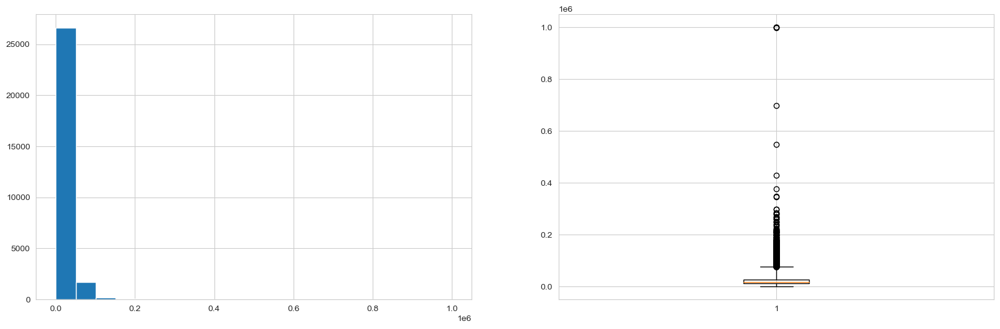

In [18]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df.price, bins=20)

plt.subplot(122)
plt.boxplot(df.price, whis=3)

plt.show()

In [19]:
df.price.sort_values().head(20)

5847    490.000
19565   500.000
5513    500.000
17516   590.000
5291    600.000
5351    600.000
5296    699.000
23792   700.000
3375    700.000
5519    740.000
5279    750.000
24546   750.000
20114   750.000
7812    750.000
5630    790.000
7835    790.000
2504    790.000
6460    790.000
3149    799.000
8187    800.000
Name: price, dtype: float64

In [20]:
df.price.sort_values().tail(20)

1587    259000.000
1397    259880.000
19314   264900.000
1413    267810.000
1320    268900.000
1114    279000.000
1444    279063.000
710     283900.000
1595    284780.000
1076    299000.000
1451    299000.000
1305    344900.000
21927   349000.000
1317    375900.000
21606   430000.000
21553   549000.000
1212    696900.000
21919   998000.000
28184   999999.000
27804   999999.000
Name: price, dtype: float64

**As seen above dataset has some unexpected values of 999999.000.**

**What might a data entry of 999999 mean?**

The missing value code should be a value that could not possibly show up as a true data value in the dataset. Sometimes, codes such as "-999999" or "999999" are used so that the code is easy to recognize when you scan a column of data. Any integer value can be used, including negative numbers.

In [21]:
df.price.sort_values().tail(20).index[:20]

Int64Index([ 1587,  1397, 19314,  1413,  1320,  1114,  1444,   710,  1595,
             1076,  1451,  1305, 21927,  1317, 21606, 21553,  1212, 21919,
            28184, 27804],
           dtype='int64')

In [22]:
df.iloc[[1587,  1397, 19314,  1413,  1320,  1114,  1444,   710,  1595,
         1076,  1451,  1305, 21927,  1317, 21606, 21553,  1212, 21919,
         28184, 27804]]

,make_model,make,location,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,seller,seats,engine_size,gears,co_emissions,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,empty_weight,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg
1587,Mercedes-Benz G 63 AMG,Mercedes-Benz,"Meckenheimer Straße 12, 53359 Rheinbach, DE",259000.000,Off-Road/Pick-up,Used,5.000,Yes,4003.000,Automatic,Benzine,Dealer,5.000,3982.000,9.000,299.000,4WD,Standard,Plus,Safety Premium Package,2560.000,New,No,No,Euro 6,Part/Full Leather,1.000,unefficient,0.000,430.000,14.400
1397,Mercedes-Benz G 63 AMG,Mercedes-Benz,"Pankofen-Irlwiesen 3, 94447 Plattling, DE",259880.000,Off-Road/Pick-up,Demonstration,5.000,Yes,9900.000,Automatic,Benzine,Dealer,5.000,3982.000,9.000,330.000,4WD,Premium,Plus,Safety Premium Package,2560.000,New,Yes,Yes,Euro 6,Part/Full Leather,1.000,unefficient,0.000,430.000,13.800
19314,Nissan Skyline,Nissan,"CTRA. DE RUBI, 88 (EDIFICIO CAN CASTANYER), 8...",264900.000,Coupe,Used,2.000,No,45000.000,Manual,Benzine,Dealer,4.000,2500.000,5.000,257.000,Rear,Standard,Standard,Safety Standard Package,1530.000,New,No,No,Euro 2,Cloth,1.000,efficient,22.000,313.000,12.000
1413,Mercedes-Benz G 63 AMG,Mercedes-Benz,"Hallesche Straße 150, 99734 Nordhausen, DE",267810.000,Off-Road/Pick-up,Demonstration,5.000,Yes,3003.000,Automatic,Benzine,Dealer,5.000,3982.000,9.000,330.000,4WD,Premium,Plus,Safety Premium Package,2560.000,New,Yes,Yes,Euro 6,Part/Full Leather,1.000,unefficient,0.000,430.000,14.400
1320,Mercedes-Benz G 63 AMG,Mercedes-Benz,"Poligono Industrial Sud, sector P3 Nave 10, 8...",268900.000,Off-Road/Pick-up,Pre-registered,5.000,Yes,1800.000,Automatic,Benzine,Dealer,5.000,3982.000,9.000,330.000,4WD,Standard,Plus,Safety Premium Package,2560.000,New,No,No,Euro 6,Part/Full Leather,1.000,unefficient,0.000,430.000,0.000
1114,Mercedes-Benz SLS,Mercedes-Benz,"Wagenzeller Str.13, 30855 Langenhagen / Kalte...",279000.000,Coupe,Used,2.000,No,30000.000,Automatic,Benzine,Dealer,2.000,6208.000,6.000,308.000,Front,Standard,Standard,Safety Premium Package,1395.000,New,No,Yes,Euro 5,Part/Full Leather,1.000,efficient,12.000,420.000,13.200
1444,Mercedes-Benz G 63 AMG,Mercedes-Benz,"Frankfurter Straße 49, 38122 Braunschweig, DE",279063.000,Off-Road/Pick-up,Demonstration,5.000,Yes,9900.000,Automatic,Benzine,Dealer,5.000,3982.000,9.000,341.000,4WD,Standard,Plus,Safety Premium Package,2485.000,New,Yes,Yes,Euro 6,Part/Full Leather,1.000,unefficient,0.000,430.000,13.100
710,Mercedes-Benz AMG GT,Mercedes-Benz,"Halbenrainer Straße 10, 8490 Bad Radkersburg, AT",283900.000,Convertible,Used,3.000,Yes,3569.000,Automatic,Benzine,Dealer,2.000,3982.000,7.000,298.000,Rear,Standard,Standard,Safety Premium Package,1735.000,New,Yes,No,Euro 6,Part/Full Leather,1.000,unefficient,0.000,409.000,13.000
1595,Mercedes-Benz G 63 AMG,Mercedes-Benz,"Landshuter Str. 1, 94315 Straubing, DE",284780.000,Off-Road/Pick-up,Demonstration,5.000,Yes,9900.000,Automatic,Benzine,Dealer,5.000,3982.000,9.000,330.000,4WD,Premium,Plus,Safety Premium Package,2560.000,New,Yes,Yes,Euro 6,Part/Full Leather,1.000,unefficient,0.000,430.000,13.800
1076,Mercedes-Benz GLE 63 AMG,Mercedes-Benz,"Viernheimer Strasse 100, 69469 Weinheim, DE",299000.000,Coupe,Demonstration,4.000,Yes,8000.000,Automatic,Benzine,Dealer,5.000,3982.000,7.000,282.000,4WD,Premium,Plus,Safety Premium Package,2350.000,New,Yes,No,Euro 6,Part/Full Leather,1.000,unefficient,1.000,588.000,11.500


In [23]:
# df.loc[df["make_model"] == "Volvo 240"][["make_model", "price", "age", "body_type", "mileage", "engine_size", "gears", "drivetrain"]]
# df.loc[df["make_model"] == "Mercedes-Benz G 63 AMG"][["make_model", "price", "age", "body_type", "mileage", "engine_size", "gears", "drivetrain"]]
# df.loc[df["make_model"] == "Ford GT"][["make_model", "price", "age", "body_type", "mileage", "engine_size", "gears", "drivetrain"]]
df.loc[df["make_model"] == "Nissan Skyline"][["make_model", "price", "age", "body_type", "mileage", "engine_size", "gears", "drivetrain"]]

,make_model,price,age,body_type,mileage,engine_size,gears,drivetrain
19276,Nissan Skyline,64950.000,26.000,Coupe,148461.000,2740.000,5.000,Rear
19297,Nissan Skyline,35160.000,26.000,Coupe,114003.000,2500.000,5.000,Rear
19299,Nissan Skyline,83000.000,51.000,Coupe,86000.000,2500.000,5.000,Rear
19305,Nissan Skyline,34500.000,30.000,Coupe,29500.000,2000.000,5.000,Rear
19314,Nissan Skyline,264900.000,22.000,Coupe,45000.000,2500.000,5.000,Rear
19315,Nissan Skyline,51000.000,31.000,Coupe,117000.000,2600.000,5.000,4WD
19317,Nissan Skyline,149990.000,22.000,Coupe,52000.000,2500.000,6.000,Rear
19389,Nissan Skyline,159999.000,23.000,Coupe,68314.000,2598.000,6.000,4WD
19390,Nissan Skyline,36000.000,26.000,Coupe,122000.000,2500.000,5.000,Rear
19396,Nissan Skyline,65000.000,27.000,Coupe,25700.000,2600.000,5.000,4WD


In [24]:
indexMercedes = df[(df["make_model"] == "Mercedes-Benz G 63 AMG") & (df['price'] >= 400000)].index
indexVolvo = df[(df["make_model"] == "Volvo 240") & (df['price'] >= 100000)].index
indexFord = df[(df["make_model"] == "Ford GT") & (df['price'] >= 600000)].index
indexNissan = df[(df["make_model"] == "Nissan Skyline") & (df['price'] >= 140000)].index

In [25]:
print(df.shape)
df.drop(indexMercedes, inplace=True)
df.drop(indexVolvo, inplace=True)
df.drop(indexFord, inplace=True)
df.drop(indexNissan, inplace=True)
print(df.shape)

(28630, 31)
(28621, 31)


In [26]:
df.price.sort_values().tail(20)

438     239000.000
21312   240000.000
1393    248800.000
1502    249890.000
21961   250000.000
1587    259000.000
1397    259880.000
1413    267810.000
1320    268900.000
1114    279000.000
1444    279063.000
710     283900.000
1595    284780.000
1076    299000.000
1451    299000.000
1305    344900.000
21927   349000.000
1317    375900.000
21606   430000.000
21553   549000.000
Name: price, dtype: float64

In [27]:
df.shape

(28621, 31)

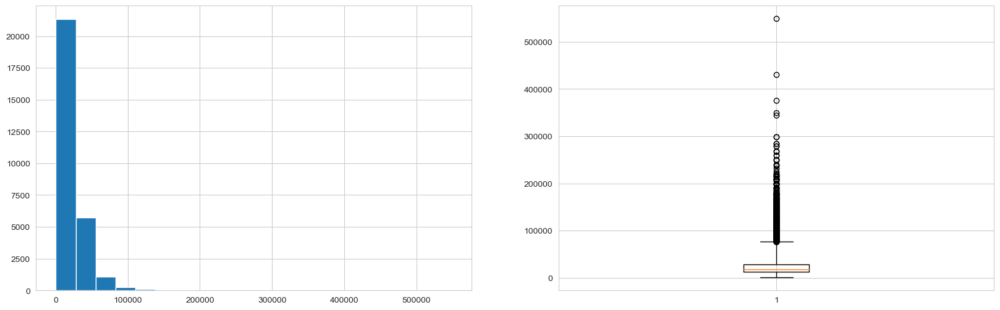

In [28]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df.price, bins=20)

plt.subplot(122)
plt.boxplot(df.price, whis=3)

plt.show()

In [29]:
# plt.figure(figsize=(16, 6))
# sns.boxplot(x="make_model", y="price", data=df, whis=3)
# plt.show()

## doors

In [30]:
first_looking("doors")

COLUMN NAME    :  doors
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  6
--------------------------------
5.000    17634
2.000     5663
4.000     3013
3.000     2304
6.000        5
1.000        2
Name: doors, dtype: int64


In [31]:
df[df["doors"]==1]["make_model"]

10001    Fiat 124 Spider
21140        Ford Fiesta
Name: make_model, dtype: object

In [32]:
df[df["make_model"]=="Fiat 124 Spider"][["make_model", "body_type", "doors"]].value_counts(dropna=False)

make_model       body_type    doors
Fiat 124 Spider  Convertible  2.000    56
                 Coupe        2.000    38
                 Convertible  1.000     1
                              3.000     1
dtype: int64

In [33]:
df[df["make_model"]=="Ford Fiesta"][["make_model", "body_type", "doors"]].value_counts(dropna=False)

make_model   body_type  doors
Ford Fiesta  Compact    5.000    137
             Sedan      5.000    120
             Compact    3.000     77
             Sedan      3.000     31
             Compact    4.000     18
             Sedan      4.000      6
             Compact    2.000      5
             Coupe      3.000      2
             Sedan      2.000      2
             Compact    1.000      1
             Coupe      5.000      1
dtype: int64

In [34]:
df[df["doors"]==6]["make_model"]

15931     Dacia Logan
16097     Dacia Logan
16105    Dacia Dokker
16129     Dacia Logan
16163     Dacia Logan
Name: make_model, dtype: object

In [35]:
df[df["make_model"]=="Dacia Logan"][["make_model", "body_type", "doors"]].value_counts(dropna=False)

make_model   body_type      doors
Dacia Logan  Station wagon  5.000    109
                            4.000     38
             Sedan          4.000     32
             Compact        4.000     13
             Station wagon  6.000      4
             Sedan          5.000      3
dtype: int64

In [36]:
df[df["make_model"]=="Dacia Dokker"][["make_model", "body_type", "doors"]].value_counts(dropna=False)

make_model    body_type         doors
Dacia Dokker  Station wagon     5.000    29
                                4.000    22
              Off-Road/Pick-up  4.000     2
              Compact           4.000     1
              Sedan             4.000     1
              Station wagon     6.000     1
dtype: int64

In [37]:
df["doors"].replace([1, 6], np.nan, inplace=True)

In [38]:
df["doors"].isnull().sum()

7

In [39]:
fill(df, "make_model", "body_type", "doors", "mode")

COLUMN NAME    :  doors
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  4
--------------------------------
5.000    17640
2.000     5664
4.000     3013
3.000     2304
Name: doors, dtype: int64


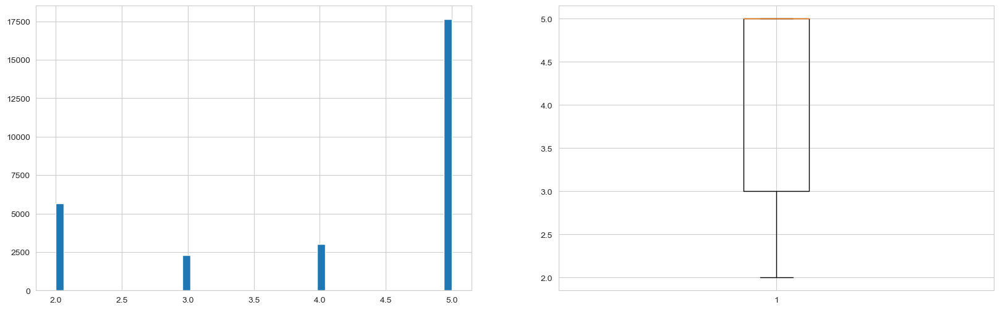

In [40]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df.doors, bins=50)

plt.subplot(122)
plt.boxplot(df.doors)

plt.show()

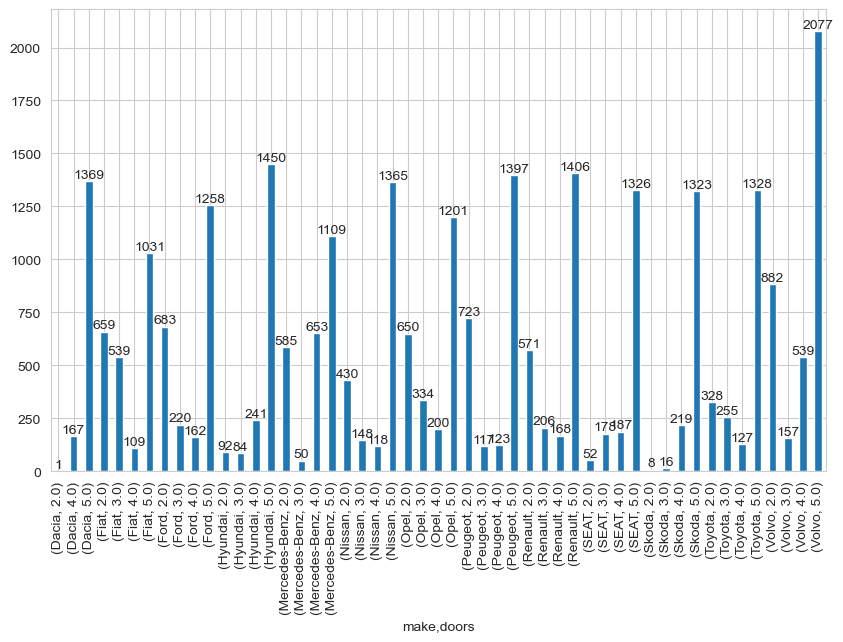

In [41]:
fig, ax = plt.subplots()

df.groupby(["make", "doors"]).doors.count().plot.bar()

for container in ax.containers:
    ax.bar_label(container);

In [42]:
print(df.shape)
df.drop("doors", axis=1, inplace=True)
print(df.shape)

(28621, 31)
(28621, 30)


## mileage

Right behind the age of the vehicle, most buyers will look at mileage. In some cases this is even more important than age, for example on vehicles that are known for their reliability. Typically, most cars start to experience issues after 100,000 odd miles, which can create expensive repair jobs. The lower the mileage, the more your car is likely to be worth.

In [43]:
first_looking("mileage")

COLUMN NAME    :  mileage
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  14183
--------------------------------
10.000        586
1.000         170
50.000        133
5000.000      118
100.000       118
             ... 
141589.000      1
59821.000       1
123500.000      1
29781.000       1
230047.000      1
Name: mileage, Length: 14183, dtype: int64


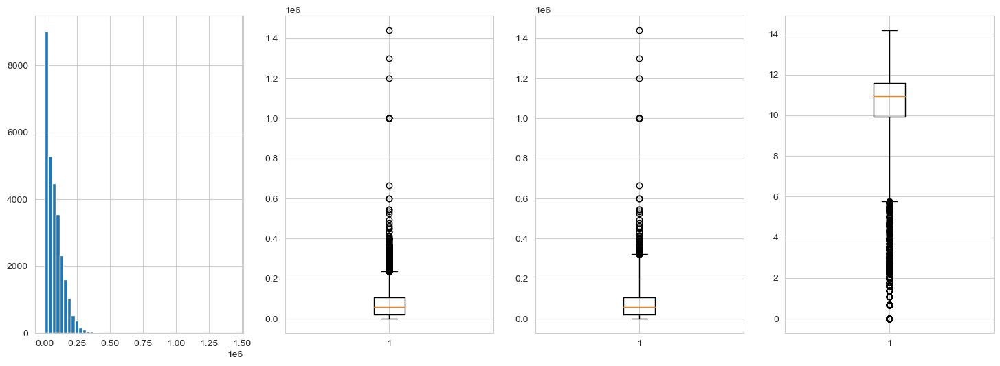

In [44]:
plt.figure(figsize=(18, 6))

plt.subplot(141)
plt.hist(df.mileage, bins=50)

plt.subplot(142)
plt.boxplot(df.mileage)

plt.subplot(143)
plt.boxplot(df.mileage, whis=2.5)

plt.subplot(144)
plt.boxplot(np.log(df.mileage), whis=2.5)

plt.show()

In [45]:
df.mileage.sort_values().head(20)

10258   0.000
16374   0.000
11078   0.000
22929   0.000
22150   0.000
18363   0.000
18382   0.000
4630    0.000
4309    0.000
22854   0.000
10982   0.000
4450    0.000
6437    0.000
11207   0.000
15950   0.000
21831   0.000
10942   0.000
14796   0.000
14753   0.000
3680    0.000
Name: mileage, dtype: float64

In [46]:
df.mileage.sort_values().tail(20)

28232    448914.000
282      457379.000
6494     461626.000
20092    477000.000
3456     494457.000
18340    523992.000
3212     536388.000
14374    546888.000
17907    547000.000
14360    600000.000
28463    600001.000
13153    667128.000
21344    999999.000
3397     999999.000
10009    999999.000
7684    1000000.000
22889   1000001.000
12169   1199900.000
17324   1300000.000
18873   1440000.000
Name: mileage, dtype: float64

In [47]:
df[df["mileage"] > 1000000][["make_model", "type", "mileage", "age"]]

,make_model,type,mileage,age
12169,SEAT Ibiza,Used,1199900.000,4.000
17324,Toyota Celica,Used,1300000.000,36.000
18873,Nissan Micra,Used,1440000.000,3.000
22889,Ford Fiesta,Used,1000001.000,4.000


In [48]:
drop_mileage_index = df[df["mileage"] > 1000000][["make_model", "type", "mileage", "age"]].index
drop_mileage_index

Int64Index([12169, 17324, 18873, 22889], dtype='int64')

In [49]:
print(df.shape)
df.drop(drop_mileage_index, inplace=True)
print(df.shape)

(28621, 30)
(28617, 30)


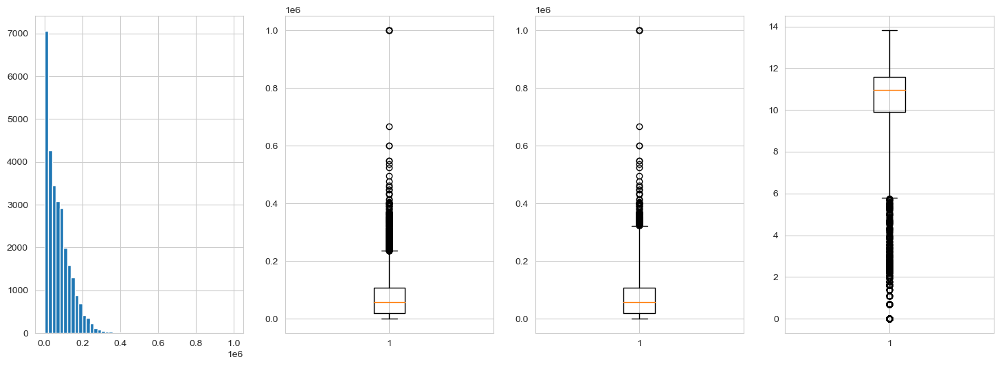

In [50]:
plt.figure(figsize=(18, 6))

plt.subplot(141)
plt.hist(df.mileage, bins=50)

plt.subplot(142)
plt.boxplot(df.mileage)

plt.subplot(143)
plt.boxplot(df.mileage, whis=2.5)

plt.subplot(144)
plt.boxplot(np.log(df.mileage), whis=2.5)

plt.show()

In [51]:
# df["mileage_logged"] = np.log(df.mileage)

**``mileage``** **is a variable with a wide range of values. However, these extreme values above CANNOT be considered as  genuine outliers since they might be a part of real world scenerio. So, let's keep these extreme values as they are.**

## seats

In [52]:
first_looking("seats")

COLUMN NAME    :  seats
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  11
--------------------------------
5.000     20713
4.000      5964
2.000      1265
7.000       542
8.000        44
9.000        35
3.000        26
6.000        12
0.000         9
1.000         5
17.000        2
Name: seats, dtype: int64


In [53]:
print(df.shape)
df.drop("seats", axis=1, inplace=True)
print(df.shape)

(28617, 30)
(28617, 29)


## engine_size

In [54]:
first_looking("engine_size")

COLUMN NAME    :  engine_size
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  466
--------------------------------
1598.000     2254
999.000      2144
1969.000     1967
1461.000     1144
1998.000     1055
998.000       952
1199.000      931
1498.000      785
1997.000      676
1968.000      631
1984.000      584
1332.000      531
1798.000      487
1560.000      479
898.000       432
1242.000      421
1499.000      413
1197.000      384
1995.000      357
1991.000      357
1368.000      355
1248.000      332
0.000         330
2435.000      309
5038.000      303
1600.000      296
2143.000      251
1364.000      230
1500.000      213
2000.000      209
3982.000      204
1591.000      203
1956.000      203
1950.000      203
3498.000      180
1395.000      176
1987.000      164
1200.000      162
1796.000      160
1149.000      159
3696.000      158
2400.000      156
1497.000      154
1490.000      153
1198.000      153
1398.000      147
2996.000  

In [55]:
df["engine_size"].describe()

count   28617.000
mean     1745.544
std      1045.363
min         0.000
25%      1300.000
50%      1598.000
75%      1984.000
max     99900.000
Name: engine_size, dtype: float64

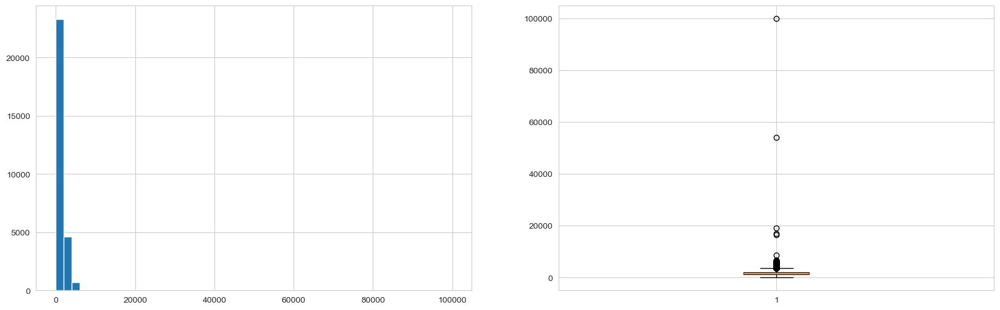

In [56]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["engine_size"], bins=50)

plt.subplot(122)
plt.boxplot(df["engine_size"], whis=2.5)

plt.show()

In [57]:
df.sort_values(by=["engine_size"], ascending=False)["engine_size"].head(20)

# df["engine_size"].sort_values(ascending=False).head(20)

16556   99900.000
21330   54009.000
716     19194.000
5580    16998.000
16105   16597.000
21667    8660.000
21797    6653.000
21653    6400.000
21345    6400.000
21393    6387.000
699      6300.000
693      6300.000
21481    6294.000
21333    6276.000
703      6209.000
2169     6208.000
813      6208.000
722      6208.000
1114     6208.000
1214     6208.000
Name: engine_size, dtype: float64

In [58]:
df.sort_values(by=["engine_size"], ascending=True)["engine_size"].head(20)

# df["engine_size"].sort_values(ascending=True).head(20)

6870    0.000
18587   0.000
10023   0.000
18607   0.000
10033   0.000
10039   0.000
9538    0.000
2745    0.000
9532    0.000
2691    0.000
2688    0.000
18586   0.000
2682    0.000
18716   0.000
16471   0.000
18725   0.000
18726   0.000
18730   0.000
18733   0.000
9522    0.000
Name: engine_size, dtype: float64

In [59]:
df["engine_size"].value_counts().sort_index(ascending=True)

0.000         330
1.000         111
2.000          12
4.000           2
5.000           3
20.000          1
200.000         1
289.000         1
300.000         1
332.000         1
498.000         1
499.000         5
500.000         2
549.000         1
600.000         1
650.000         2
652.000         2
698.000         1
750.000         2
767.000         6
839.000         2
843.000        10
847.000         1
850.000         5
875.000       113
898.000       432
899.000        20
900.000        53
903.000         4
964.000         3
973.000         2
982.000         1
987.000         2
988.000         1
996.000         2
997.000         1
998.000       952
999.000      2144
1000.000       99
1084.000       37
1086.000       15
1089.000        1
1100.000       13
1108.000       10
1116.000        2
1119.000        1
1120.000        4
1122.000        1
1124.000       10
1149.000      159
1150.000        2
1158.000        4
1194.000        2
1196.000        1
1197.000      384
1198.000  

In [60]:
df[df["engine_size"] <= 500][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]\
                            .sort_values(by=["engine_size"], ascending=True)

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type
11620,Fiat 500e,1.000,Sedan,Automatic,Front,1.000,0.000,Electric
11640,Fiat 500e,0.000,Sedan,Automatic,Front,1.000,0.000,Electric
11632,Fiat 500e,1.000,Sedan,Automatic,Front,1.000,0.000,Electric
18964,Nissan Leaf,1.000,Compact,Automatic,Front,1.000,0.000,Electric
11619,Fiat 500e,1.000,Sedan,Automatic,Front,1.000,0.000,Electric
11595,Fiat 500e,0.000,Sedan,Automatic,Front,1.000,0.000,Electric
11578,Fiat 500e,1.000,Sedan,Automatic,Front,1.000,0.000,Electric
11577,Fiat 500e,0.000,Sedan,Automatic,Front,1.000,0.000,Electric
11558,Fiat 500e,0.000,Sedan,Automatic,Front,1.000,0.000,Electric
11544,Fiat 500e,0.000,Sedan,Automatic,Front,1.000,0.000,Electric


In [61]:
df["engine_size"].value_counts().sort_index(ascending=False)

99900.000       1
54009.000       1
19194.000       1
16998.000       1
16597.000       1
8660.000        1
6653.000        1
6400.000        2
6387.000        1
6300.000        2
6294.000        1
6276.000        1
6209.000        1
6208.000       12
6000.000        1
5987.000        2
5981.000        1
5980.000        4
5950.000        1
5812.000        1
5800.000        2
5786.000        1
5768.000        1
5766.000        1
5700.000        1
5689.000        2
5686.000        1
5666.000        1
5663.000        1
5600.000        4
5513.000        5
5461.000       51
5439.000        9
5409.000        2
5400.000        4
5300.000        1
5200.000       12
5162.000        4
5083.000        1
5038.000      303
5032.000        2
5031.000        1
5000.000       21
4996.000        2
4995.000        1
4973.000        7
4966.000       19
4952.000        3
4951.000       89
4949.000        9
4948.000        1
4942.000        2
4886.000        1
4885.000        1
4800.000        1
4742.000  

In [62]:
df[df["engine_size"] > 4000][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]\
                            .sort_values(by=["engine_size"], ascending=False)

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type
16556,Dacia Sandero,3.000,Sedan,Manual,Front,5.000,99900.000,Benzine
21330,Ford Mustang,14.000,Convertible,Manual,Rear,6.000,54009.000,Benzine
716,Mercedes-Benz SL 320,21.000,Convertible,Automatic,Rear,5.000,19194.000,Benzine
5580,Renault Megane,7.000,Coupe,Manual,Front,6.000,16998.000,Benzine
16105,Dacia Dokker,0.000,Station wagon,Manual,Front,5.000,16597.000,Liquid/Natural Gas
21667,Ford Mustang,53.000,Coupe,Semi-automatic,Rear,6.000,8660.000,Benzine
21797,Ford Mustang,57.000,Coupe,Manual,Rear,6.000,6653.000,Benzine
21345,Ford Thunderbird,59.000,Convertible,Automatic,Rear,3.000,6400.000,Benzine
21653,Ford Mustang,54.000,Coupe,Manual,Rear,4.000,6400.000,Benzine
21393,Ford,60.000,Convertible,Automatic,Rear,3.000,6387.000,Benzine


In [63]:
# df.loc[df.make_model == "Ford Thunderbird"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Ford Fairlane"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Dacia Sandero"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
df.loc[df.make_model == "Mercedes-Benz SL 320"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Renault Megane"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Dacia Dokker"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type
716,Mercedes-Benz SL 320,21.000,Convertible,Automatic,Rear,5.000,19194.000,Benzine
733,Mercedes-Benz SL 320,29.000,Convertible,Automatic,Rear,5.000,3200.000,Benzine
823,Mercedes-Benz SL 320,29.000,Coupe,Automatic,Rear,5.000,3199.000,Benzine


### Domain Knowledge About Some Vehicles on the List Above:
**[SOURCE](https://www.automobile-catalog.com/#gsc.tab=0)**

- **Ford Thunderbird Convertible (1964-1966)**, manufactured or offered in the years 1964-1966 with convertible body_type, equipped with engines of **6384 - 6997 cc (389.6 - 427 cui) displacement**, delivering 223.5 - 257 kW (304 - 350 PS, 300 - 345 hp) of horsepower.

- **Ford Fairlane**, 2-Door Hardtop 390 Thunderbird V-8 (man. 3) , model year 1968, version for North America U.S. manufactured by Ford (USA) in United States, 2-door coupe body_type, RWD (rear-wheel drive), manual 3-speed gearbox, gasoline (petrol) engine with **displacement: 6384 cm3 / 389.6 cui**, advertised power: 197.5 kW / 265 hp / 269 PS ( SAE gross ), torque: 529 Nm / 390 lb-ft.

- **Ford Mustang Mach**, manufactured by Ford (USA) in United States, 2-door coupe body_type, RWD (rear-wheel drive), manual 4-speed gearbox, gasoline (petrol) engine with **displacement: 7033 cm3 / 429.2 cui**, advertised power: 276 kW / 370 hp / 375 PS ( SAE gross ), torque: 610 Nm / 450 lb-ft.

- **Dacia Sandero SCe 65 (man. 5) (Access, Essential, Comfort)** in 2021, the model with 5-door hatchback body and Line-3 999 cm3 / 61.1 cui, 49 kW / 67 PS / 66 hp (ECE) of power, 95 Nm / 70 lb-ft of torque, 5-speed manual powertrain offered since March 2021 for Europe, **Displacement: 999 cm3 / 61.1 cui**.

- **Mercedes-Benz SL 320 (aut. 5)** in 1993, the model with 2-door convertible body and Line-6 3199 cm3 / 195.5 cui, 170 kW / 231 PS / 228 hp (ECE) of power, 315 Nm / 232 lb-ft of torque, 5-speed automatic powertrain offered since July 1993 for Europe **Displacement: 3199 cm3 / 195.5 cui**.

- **Renault Megane Coupe 1.6 Energy dCi 130 (man. 6) in 2015**, the model with 3-door hatchback (coupe) body and Line-4 1598 cm3 / 97.6 cui, 95.5 kW / 130 PS / 128 hp (ECE) of power, 320 Nm / 236 lb-ft of torque, 6-speed manual powertrain for Europe, **Displacement: 1598 cm3 / 97.6 cui**.

- **Dacia Dokker Stepway TCe 130 (man. 6)**, manufactured by Dacia in Romania assembly in Morocco, 5-door mpv body_type, FWD (front-wheel drive), manual 6-speed gearbox, gasoline (petrol) engine with **displacement: 1332 cm3 / 81.1 cui**, advertised power: 95.5 kW / 128 hp / 130 PS ( ECE ), torque: 240 Nm / 177 lb-ft

In [64]:
df[(df["engine_size"] >= 2) & (df["engine_size"] <= 500)][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]\
                            .sort_values(by=["engine_size"], ascending=True)

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type
28528,Volvo S90,1.000,Sedan,Automatic,4WD,8.000,2.000,Electric
28340,Volvo S90,1.000,Sedan,Automatic,4WD,8.000,2.000,Electric
21948,Ford Kuga,1.000,Off-Road/Pick-up,Automatic,4WD,6.000,2.000,Electric
22312,Ford Kuga,4.000,Off-Road/Pick-up,Manual,4WD,6.000,2.000,Diesel
26827,Volvo XC60,0.000,Off-Road/Pick-up,Automatic,4WD,8.000,2.000,Diesel
26950,Volvo XC90,1.000,Off-Road/Pick-up,Automatic,4WD,8.000,2.000,Diesel
27216,Volvo XC60,0.000,Off-Road/Pick-up,Automatic,4WD,8.000,2.000,Diesel
26877,Volvo XC60,0.000,Off-Road/Pick-up,Automatic,4WD,8.000,2.000,Diesel
27336,Volvo XC90,1.000,Off-Road/Pick-up,Automatic,4WD,8.000,2.000,Diesel
2140,Mercedes-Benz E 220,12.000,Sedan,Manual,Rear,9.000,2.000,Diesel


In [65]:
# df.loc[df.make_model == "Volvo S90"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Ford Kuga"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Volvo XC60"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Mercedes-Benz E 220"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Dacia Duster	"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Fiat 500 Abarth"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Opel Calibra"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Ford Mustang"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "SEAT Leon"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
# df.loc[df.make_model == "Toyota MR 2"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]
df.loc[df.make_model == "Renault Megane"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type"]]

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type
4783,Renault Megane,1.000,Compact,Manual,Front,6.000,1332.000,Benzine
4786,Renault Megane,1.000,Compact,Automatic,Front,6.000,1798.000,Benzine
4789,Renault Megane,4.000,Compact,Automatic,Front,6.000,1500.000,Diesel
4791,Renault Megane,7.000,Compact,Manual,Front,6.000,1461.000,Diesel
4793,Renault Megane,8.000,Compact,Manual,Front,6.000,1461.000,Diesel
4794,Renault Megane,18.000,Compact,Automatic,Front,4.000,1598.000,Benzine
4796,Renault Megane,4.000,Compact,Automatic,Front,6.000,1500.000,Diesel
4798,Renault Megane,6.000,Compact,Automatic,Rear,7.000,1618.000,Benzine
4800,Renault Megane,14.000,Compact,Manual,Front,6.000,1870.000,Diesel
4801,Renault Megane,4.000,Compact,Automatic,Front,6.000,1500.000,Diesel


In [66]:
# df.loc[((df["engine_size"] <= 300) & (df["engine_size"] > 8000)), 'engine_size'] = np.nan

outlier_eng_size = df["engine_size"].isin([4, 5, 20, 200, 289, 300, 332, 8660, 99900, 54009, 19194, 16998, 16597])
df[outlier_eng_size][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight
88,Mercedes-Benz E 300,36.000,Compact,Automatic,Rear,9.000,300.000,Liquid/Natural Gas,1550.000
716,Mercedes-Benz SL 320,21.000,Convertible,Automatic,Rear,5.000,19194.000,Benzine,1780.000
3327,Opel Calibra,30.000,Coupe,Manual,Front,5.000,200.000,Benzine,1245.000
5243,Renault Megane,18.000,Convertible,Automatic,Rear,6.000,20.000,Benzine,1395.000
5580,Renault Megane,7.000,Coupe,Manual,Front,6.000,16998.000,Benzine,1454.000
13253,SEAT Leon,1.000,Sedan,Automatic,Front,6.000,4.000,Benzine,1239.000
15606,Dacia Duster,1.000,Off-Road/Pick-up,Manual,4WD,6.000,332.000,Benzine,1320.000
16105,Dacia Dokker,0.000,Station wagon,Manual,Front,5.000,16597.000,Liquid/Natural Gas,1280.000
16556,Dacia Sandero,3.000,Sedan,Manual,Front,5.000,99900.000,Benzine,1115.000
17068,Toyota MR 2,30.000,Convertible,Manual,4WD,1.000,4.000,Benzine,1050.000


In [67]:
df.loc[outlier_eng_size, "engine_size"] = np.nan

In [68]:
df["engine_size"].isnull().sum()

16

In [69]:
fill(df, "make_model", "body_type", "engine_size", "mode")

COLUMN NAME    :  engine_size
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  453
--------------------------------
1598.000    2255
999.000     2144
1969.000    1967
1461.000    1145
1998.000    1058
998.000      952
1199.000     931
1498.000     786
1997.000     676
1968.000     631
1984.000     584
1332.000     531
1798.000     487
1560.000     479
898.000      433
1242.000     421
1499.000     413
1197.000     384
1991.000     357
1995.000     357
1368.000     355
1248.000     332
0.000        330
5038.000     309
2435.000     309
1600.000     296
2143.000     251
1364.000     230
1500.000     213
2000.000     209
1950.000     204
3982.000     204
1956.000     203
1591.000     203
3498.000     180
1395.000     176
1987.000     164
1200.000     162
1796.000     160
1149.000     159
3696.000     158
2400.000     156
1497.000     154
1198.000     153
1490.000     153
1398.000     147
2996.000     147
1999.000     147
1794.000     143
1496.

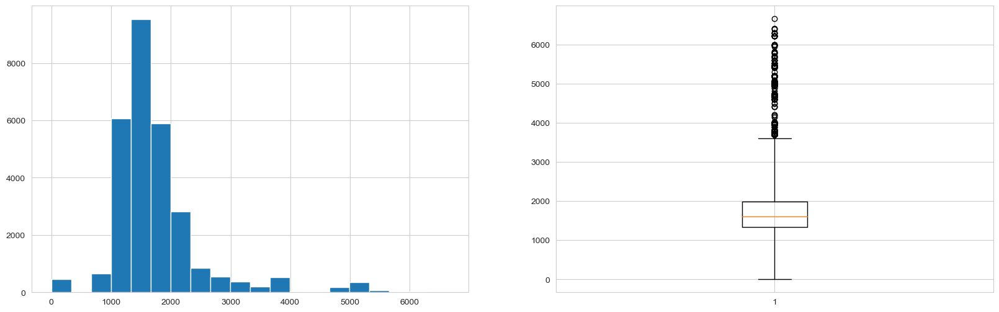

In [70]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["engine_size"], bins=20)

plt.subplot(122)
plt.boxplot(df["engine_size"], whis=2.5)

plt.show()

## gears

In [71]:
first_looking("gears")

COLUMN NAME    :  gears
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  11
--------------------------------
6.000     13125
5.000      7819
7.000      2427
8.000      2424
1.000      1142
9.000      1113
4.000       345
10.000      120
3.000        62
0.000        37
2.000         3
Name: gears, dtype: int64


In [72]:
df.gears.describe()

count   28617.000
mean        5.876
std         1.487
min         0.000
25%         5.000
50%         6.000
75%         6.000
max        10.000
Name: gears, dtype: float64

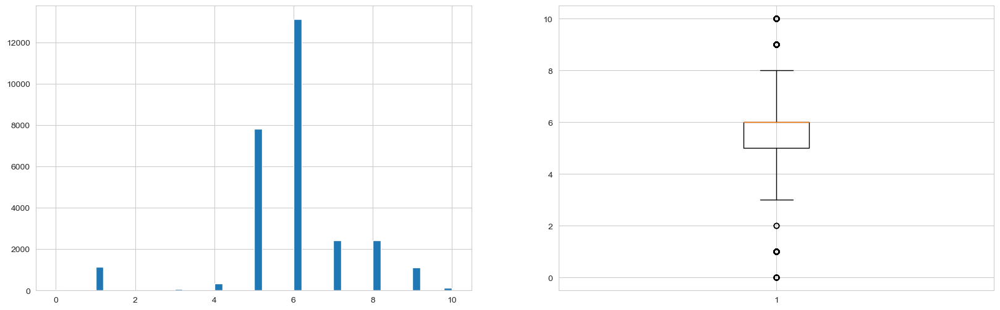

In [73]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df.gears, bins=50)

plt.subplot(122)
plt.boxplot(df.gears, whis=2.5)

plt.show()

In [74]:
df.sort_values(by=["gears"], ascending=False)["gears"].head(20)

22189   10.000
21605   10.000
21241   10.000
21242   10.000
21624   10.000
22036   10.000
21248   10.000
21249   10.000
21257   10.000
21587   10.000
21602   10.000
22310   10.000
21601   10.000
21592   10.000
21589   10.000
21275   10.000
21240   10.000
21627   10.000
21233   10.000
21231   10.000
Name: gears, dtype: float64

In [75]:
df.sort_values(by=["gears"], ascending=True)["gears"].head(20)

18598   0.000
15126   0.000
18657   0.000
18655   0.000
18654   0.000
18646   0.000
28557   0.000
28556   0.000
22823   0.000
6211    0.000
1177    0.000
18608   0.000
22783   0.000
20567   0.000
5129    0.000
5122    0.000
18150   0.000
18583   0.000
12801   0.000
9102    0.000
Name: gears, dtype: float64

In [76]:
# Let's check the observations having extreme Gear value.

df[(df.gears < 5) | (df.gears > 8)][["make_model", "body_type", "gearbox", "fuel_type", "gears"]]

,make_model,body_type,gearbox,fuel_type,gears
1,Mercedes-Benz EQE 350,Compact,Automatic,Electric,9.000
9,Mercedes-Benz A 200,Compact,Automatic,Diesel,1.000
24,Mercedes-Benz GLC 220,Compact,Automatic,Diesel,9.000
33,Mercedes-Benz E 220,Compact,Manual,Diesel,9.000
73,Mercedes-Benz V 220,Compact,Manual,Diesel,9.000
...,...,...,...,...,...
28447,Volvo S90,Sedan,Automatic,Benzine,4.000
28504,Volvo 240,Sedan,Automatic,Benzine,1.000
28518,Volvo S60,Sedan,Automatic,Benzine,4.000
28556,Volvo S90,Sedan,Automatic,Diesel,0.000


In [77]:
# Let's check the observations belonging to "Mercedes-Benz EQE 350" model to see distribution of Gear values. 

df[(df.make_model == "Mercedes-Benz EQE 350")][["make_model", "body_type", "gearbox", "drivetrain", "gears", "fuel_type"]]

,make_model,body_type,gearbox,drivetrain,gears,fuel_type
1,Mercedes-Benz EQE 350,Compact,Automatic,4WD,9.000,Electric
1777,Mercedes-Benz EQE 350,Station wagon,Automatic,4WD,9.000,Electric
2246,Mercedes-Benz EQE 350,Sedan,Automatic,4WD,1.000,Electric
2272,Mercedes-Benz EQE 350,Sedan,Automatic,4WD,1.000,Electric
2276,Mercedes-Benz EQE 350,Sedan,Automatic,4WD,1.000,Electric
2278,Mercedes-Benz EQE 350,Sedan,Automatic,4WD,1.000,Electric
2301,Mercedes-Benz EQE 350,Sedan,Automatic,Rear,1.000,Electric
2317,Mercedes-Benz EQE 350,Sedan,Automatic,4WD,1.000,Electric
2328,Mercedes-Benz EQE 350,Sedan,Automatic,4WD,1.000,Electric
2356,Mercedes-Benz EQE 350,Sedan,Automatic,4WD,1.000,Electric


### Domain Knowledge on Electric Vehicles:

**Do electric cars have gears?**

One of the most common questions regarding the latest in passenger-car technology is: Do electric cars have gears? The question really should be: Do electric vehicles have more than one gear, but, **in both cases** the broad answer is **``NO``**, they don’t. That’s in the case of production cars anyway, and the reason is simple: They don’t really need more than one gear.

**However**, if the vehicle is hybrit, it might have more than one gear.

**🧐 [SOURCE - Do electric cars have gears?](https://www.carsguide.com.au/car-advice/q-and-a/do-electric-cars-have-gears-84694)**

**As seen below, the majority of Electric Cars have a gear of 1:**

In [78]:
df[(df["fuel_type"] == "Electric")][["make_model", "body_type", "gearbox", "drivetrain", "gears"]]

,make_model,body_type,gearbox,drivetrain,gears
1,Mercedes-Benz EQE 350,Compact,Automatic,4WD,9.000
93,Mercedes-Benz EQS,Compact,Automatic,4WD,9.000
94,Mercedes-Benz EQS,Compact,Automatic,Rear,9.000
108,Mercedes-Benz EQS,Compact,Automatic,Rear,9.000
1213,Mercedes-Benz EQA,Off-Road/Pick-up,Automatic,Front,1.000
1226,Mercedes-Benz EQC 400,Off-Road/Pick-up,Automatic,4WD,1.000
1271,Mercedes-Benz EQC 400,Off-Road/Pick-up,Automatic,4WD,1.000
1273,Mercedes-Benz EQC 400,Off-Road/Pick-up,Automatic,4WD,1.000
1281,Mercedes-Benz EQB 350,Off-Road/Pick-up,Automatic,4WD,1.000
1283,Mercedes-Benz EQC 400,Off-Road/Pick-up,Automatic,4WD,1.000


**What About Classic ``Modern`` Vehicles?**

**Domain Knowledge on Electric Vehicles:**

**Is it possible that there have been ``MODERN cars`` with manual/automatic transmissions with 1, 2, 3, 4, 9, 50 gears?**

Most modern cars with manual transmissions have 5 or 6 forward gears. Most modern cars with automatic transmissions have 5–8 forward gears. A few have as many as 10 [Source](https://www.quora.com/What-are-maximum-number-of-transmission-gears).
Contemporary manual transmissions for cars typically use five or six forward gears ratios and one reverse gear, however, transmissions with between two and seven gears have been produced at times [Source](https://en.wikipedia.org/wiki/Manual_transmission).

**Let's take a look at the gear numbers of other vehicles rather than electric vehicles in the dataset:**

In [79]:
df[((df["fuel_type"] == "Benzine")|(df["fuel_type"] == "Diesel")|(df["fuel_type"] == "Liquid/Natural Gas"))][["fuel_type", "gears", "make_model"]].value_counts()

fuel_type           gears   make_model              
Diesel              6.000   Volvo V40                   563
Benzine             5.000   Dacia Sandero               518
                    6.000   Ford Mustang                507
                            Hyundai i30                 489
                            Renault Megane              455
                    5.000   Volvo C70                   433
                    6.000   SEAT Leon                   416
                            Opel Astra                  350
                    5.000   Nissan Micra                308
                    6.000   Ford Focus                  300
Diesel              6.000   Renault Megane              278
Benzine             6.000   Ford Fiesta                 273
                    5.000   Fiat 500                    272
                            SEAT Ibiza                  245
Diesel              6.000   Nissan Qashqai              230
Benzine             6.000   Nissan Qashqai     

In [80]:
# Domain Knowledge: Ford Mustang has 6 Speed Automatic Gear Box

df[(df.make_model == "Ford Mustang") & ~(df["fuel_type"] == "Electric")][["make_model", "body_type", "gearbox", "drivetrain", "gears", "fuel_type"]]

,make_model,body_type,gearbox,drivetrain,gears,fuel_type
20930,Ford Mustang,Compact,Automatic,Rear,6.000,Benzine
21156,Ford Mustang,Convertible,Automatic,Rear,6.000,Benzine
21157,Ford Mustang,Convertible,Automatic,Rear,6.000,Benzine
21158,Ford Mustang,Convertible,Automatic,Rear,10.000,Benzine
21159,Ford Mustang,Convertible,Automatic,Rear,6.000,Benzine
21160,Ford Mustang,Convertible,Automatic,Rear,10.000,Benzine
21161,Ford Mustang,Convertible,Manual,Rear,6.000,Benzine
21162,Ford Mustang,Convertible,Automatic,Rear,6.000,Benzine
21163,Ford Mustang,Convertible,Manual,Rear,6.000,Benzine
21164,Ford Mustang,Convertible,Automatic,Rear,6.000,Benzine


In [81]:
df.loc[((df.make_model == "Ford Mustang") & ~(df["fuel_type"] == "Electric")), "gears"] = 6
df.loc[((df.make_model == "Ford Mustang") & ~(df["fuel_type"] == "Electric")), "gears"]

20930   6.000
21156   6.000
21157   6.000
21158   6.000
21159   6.000
21160   6.000
21161   6.000
21162   6.000
21163   6.000
21164   6.000
21165   6.000
21166   6.000
21167   6.000
21168   6.000
21169   6.000
21170   6.000
21171   6.000
21172   6.000
21173   6.000
21174   6.000
21175   6.000
21176   6.000
21177   6.000
21178   6.000
21179   6.000
21180   6.000
21181   6.000
21182   6.000
21183   6.000
21184   6.000
21185   6.000
21186   6.000
21187   6.000
21188   6.000
21189   6.000
21190   6.000
21191   6.000
21193   6.000
21194   6.000
21196   6.000
21197   6.000
21199   6.000
21201   6.000
21202   6.000
21203   6.000
21204   6.000
21205   6.000
21206   6.000
21207   6.000
21208   6.000
21209   6.000
21210   6.000
21211   6.000
21212   6.000
21213   6.000
21214   6.000
21215   6.000
21216   6.000
21217   6.000
21218   6.000
21219   6.000
21221   6.000
21222   6.000
21223   6.000
21224   6.000
21225   6.000
21226   6.000
21227   6.000
21228   6.000
21229   6.000
21230   6.000
21231 

**Unlike Ford Mustang, the Japanese market C-HR is powered by either ``1.2-litre turbocharged petrol engine``, OR ``1.8-litre Hybrid``. The FWD models are available with both engines, while the only motor for the AWD models is 1.2-litre turbo.**

**So, we will keep the values of ``gears`` for it.**

In [82]:
df[(df.make_model == "Toyota C-HR") & ~(df["fuel_type"] == "Electric")][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "fuel_type"]]

,make_model,age,body_type,gearbox,drivetrain,gears,fuel_type
17196,Toyota C-HR,4.000,Convertible,Automatic,Front,1.000,Benzine
17246,Toyota C-HR,0.000,Coupe,Automatic,Front,5.000,Benzine
17248,Toyota C-HR,0.000,Coupe,Automatic,Front,5.000,Benzine
17454,Toyota C-HR,1.000,Coupe,Automatic,Front,5.000,Benzine
17502,Toyota C-HR,3.000,Coupe,Automatic,Front,1.000,Benzine
17567,Toyota C-HR,0.000,Coupe,Automatic,Front,5.000,Benzine
17581,Toyota C-HR,4.000,Off-Road/Pick-up,Automatic,Front,6.000,Benzine
17586,Toyota C-HR,1.000,Off-Road/Pick-up,Automatic,Front,1.000,Benzine
17588,Toyota C-HR,3.000,Off-Road/Pick-up,Automatic,Front,5.000,Benzine
17589,Toyota C-HR,1.000,Off-Road/Pick-up,Automatic,Front,1.000,Benzine


**Conclusion:**

**Due to the confusion and unstandardized situations in the concepts of the automotive sector mentioned above, ``more than 8-gear for traditional vehicles`` or ``vehicles having 0-Gear for electric ones`` will be EITHER deducted from the dataset OR imputed consistent with ``"make_model"`` & ``"body_type"`` features, assuming that they do NOT reflect reality.**

In [83]:
# Let's check the observations having extreme Gear value according to our Domain Knowledge.

df[df.gears > 8][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "fuel_type"]]

,make_model,age,body_type,gearbox,drivetrain,gears,fuel_type
1,Mercedes-Benz EQE 350,0.000,Compact,Automatic,4WD,9.000,Electric
24,Mercedes-Benz GLC 220,1.000,Compact,Automatic,4WD,9.000,Diesel
33,Mercedes-Benz E 220,6.000,Compact,Manual,Rear,9.000,Diesel
73,Mercedes-Benz V 220,6.000,Compact,Manual,Front,9.000,Diesel
88,Mercedes-Benz E 300,36.000,Compact,Automatic,Rear,9.000,Liquid/Natural Gas
89,Mercedes-Benz AMG GT,3.000,Compact,Automatic,4WD,9.000,Benzine
90,Mercedes-Benz AMG GT,3.000,Compact,Automatic,4WD,9.000,Benzine
92,Mercedes-Benz AMG GT,2.000,Compact,Automatic,4WD,9.000,Benzine
93,Mercedes-Benz EQS,0.000,Compact,Automatic,4WD,9.000,Electric
94,Mercedes-Benz EQS,0.000,Compact,Automatic,Rear,9.000,Electric


In [84]:
df[df.gears == 0][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "fuel_type"]]

,make_model,age,body_type,gearbox,drivetrain,gears,fuel_type
1177,Mercedes-Benz E 300,3.000,Coupe,Automatic,Rear,0.000,Diesel
1396,Mercedes-Benz GLS 400,2.000,Off-Road/Pick-up,Automatic,4WD,0.000,Diesel
5122,Renault ZOE,3.000,Compact,Automatic,Front,0.000,Electric
5129,Renault ZOE,3.000,Compact,Automatic,Front,0.000,Electric
6211,Renault Kadjar,2.000,Off-Road/Pick-up,Automatic,Front,0.000,Benzine
9102,Peugeot Partner,4.000,Station wagon,Automatic,Front,0.000,Electric
9770,Fiat 500,1.000,Compact,Automatic,Front,0.000,Benzine
12801,SEAT Tarraco,3.000,Off-Road/Pick-up,Automatic,4WD,0.000,Diesel
15106,Skoda Octavia,0.000,Sedan,Automatic,Front,0.000,Benzine
15126,Skoda Octavia,1.000,Sedan,Automatic,Front,0.000,Diesel


In [85]:
df[(df.gears > 1) & (df.gears < 5)][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "fuel_type"]]

,make_model,age,body_type,gearbox,drivetrain,gears,fuel_type
377,Mercedes-Benz 220,13.000,Compact,Manual,Rear,4.000,Diesel
443,Mercedes-Benz 500,31.000,Convertible,Automatic,Rear,4.000,Benzine
538,Mercedes-Benz SL 300,35.000,Convertible,Automatic,Rear,4.000,Benzine
556,Mercedes-Benz SL 280,43.000,Convertible,Automatic,Rear,4.000,Benzine
571,Mercedes-Benz SL 500,38.000,Convertible,Automatic,Rear,4.000,Benzine
595,Mercedes-Benz SL 280,27.000,Convertible,Automatic,Rear,4.000,Benzine
614,Mercedes-Benz SL 280,45.000,Convertible,Automatic,Rear,4.000,Benzine
616,Mercedes-Benz 190,59.000,Convertible,Manual,Rear,4.000,Benzine
676,Mercedes-Benz SL 280,41.000,Convertible,Manual,Rear,4.000,Benzine
684,Mercedes-Benz SL 600,28.000,Convertible,Automatic,Rear,4.000,Benzine


### Domain Knowledge on Some Old Vehicles:**

- **1961 Mercury Comet** with a V6 101 HP engine and a **2-speed automatic transmission**.<br>
- **1957 Ford Thunderbird has 3-speed Fordomatic automatic 3-speed manual 3-speed overdrive manual transmission**.<br>
- All **automatic Nissan Stageas** were **4 speed**.<br>
- The **300ZX** offers you three types of transmissions to choose from-5-speed manual with the VG30ET and 5-speed manual or **4-speed automatic** with the VG30E.<br>
- The **Nissan Figaro** is equipped with a turbocharged, 4 cylinder, fuel injected MA10ET engine mated to a **3-speed automatic gearbox**.<br>

And so on.

In [86]:
# df['gears'] = np.where(df.gears > 8, np.nan, df.gears)

df.loc[((df.gears == 0) | (df.gears > 8)), 'gears'] = np.nan

In [87]:
df.gears.isnull().sum()

1167

In [88]:
fill(df, "make_model", "body_type", "gears", "mode")

COLUMN NAME    :  gears
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  8
--------------------------------
6.000    13827
5.000     7823
7.000     2943
8.000     2483
1.000     1155
4.000      328
3.000       55
2.000        3
Name: gears, dtype: int64


In [89]:
df[df.gears==2]

,make_model,make,location,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,empty_weight,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg
9513,Fiat 500,Fiat,"Dreiangelweg 3, 92318 Neumarkt, DE",10950.000,Compact,Used,No,13500.000,Manual,Benzine,Dealer,1242.000,2.000,93.000,Front,Standard,Standard,Safety Standard Package,1055.000,New,Yes,No,Euro 5,Cloth,2.000,unefficient,11.000,17.000,4.150
21744,Ford Mercury,Ford,"Zeppelinring 4-8, 76344 Eggenstein, DE",38990.000,Coupe,Used,No,93522.000,Automatic,Benzine,Dealer,5689.000,2.000,124.000,Rear,Standard,Standard,Safety Standard Package,1850.000,New,No,No,Euro 6,Part/Full Leather,4.000,efficient,52.000,187.000,5.300
21814,Ford Mercury,Ford,"87764 Legau, DE",26750.000,Coupe,Used,No,124000.000,Automatic,Benzine,Private seller,6000.000,2.000,124.000,Rear,Standard,Standard,Safety Standard Package,1850.000,New,No,No,Euro 6,Part/Full Leather,2.000,efficient,65.000,218.000,5.300


In [90]:
drop_index = df[df.gears==2].index
drop_index

Int64Index([9513, 21744, 21814], dtype='int64')

In [91]:
print(df.shape)
df.drop(drop_index, axis=0, inplace=True)
print(df.shape)

(28617, 29)
(28614, 29)


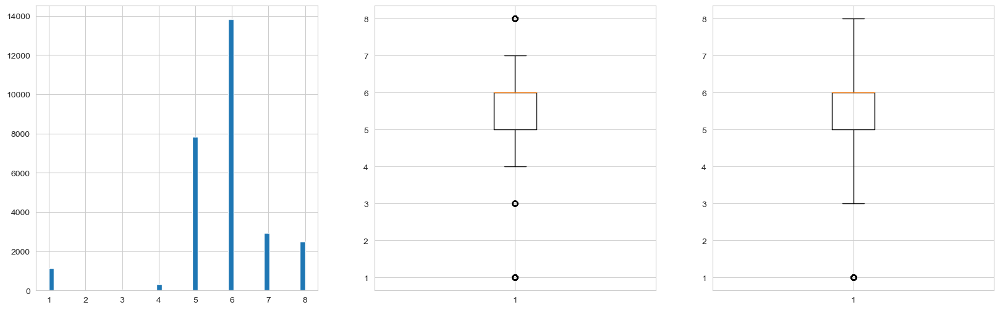

In [92]:
plt.figure(figsize=(20, 6))

plt.subplot(131)
plt.hist(df.gears, bins=50)

plt.subplot(132)
plt.boxplot(df.gears, whis=1.5)

plt.subplot(133)
plt.boxplot(df.gears, whis=2.5)

plt.show()

## empty_weight

In [93]:
first_looking("empty_weight")

COLUMN NAME    :  empty_weight
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  1218
--------------------------------
1320.000     724
1280.000     518
1055.000     473
1395.000     461
1165.000     392
1115.000     357
1090.000     263
1315.000     259
1659.000     252
1370.000     242
1423.000     239
1331.000     220
1239.000     215
1310.000     201
1245.000     190
1135.000     189
1485.000     188
1430.000     185
1597.000     184
1335.000     182
1550.000     181
1425.000     180
1893.000     177
1275.000     176
1505.000     176
2169.000     175
1295.000     174
1255.000     174
1680.000     167
1050.000     157
1355.000     155
1735.000     154
1233.000     146
905.000      144
1557.000     137
2075.000     137
1375.000     136
1615.000     134
1063.000     131
1235.000     126
1157.000     126
1701.000     120
1040.000     119
1500.000     118
1575.000     113
1472.000     112
1492.000     112
1350.000     110
1065.000     109
950

In [94]:
df["empty_weight"].describe()

count   28614.000
mean     1419.351
std       324.967
min        75.000
25%      1214.000
50%      1371.000
75%      1595.000
max     15590.000
Name: empty_weight, dtype: float64

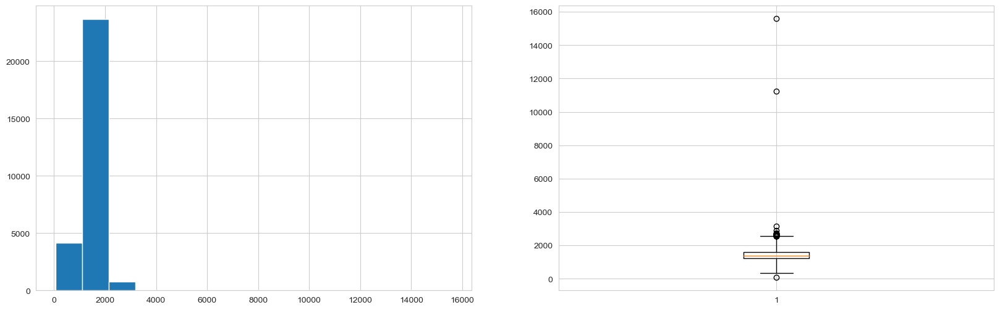

In [95]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["empty_weight"], bins=15)

plt.subplot(122)
plt.boxplot(df["empty_weight"], whis=2.5)

plt.show()

In [96]:
df.sort_values(by=["empty_weight"], ascending=False)["empty_weight"].head(20)

# df["empty_weight"].sort_values(ascending=False).head(20)

6869    15590.000
21142   11246.000
1295     3150.000
20037    2900.000
5414     2750.000
17891    2725.000
2371     2712.000
1199     2690.000
2199     2680.000
1628     2680.000
2156     2655.000
17907    2650.000
1449     2612.000
1259     2610.000
1481     2610.000
1357     2610.000
1344     2610.000
1333     2610.000
1421     2610.000
1270     2595.000
Name: empty_weight, dtype: float64

In [97]:
# df.sort_values(by=["empty_weight"], ascending=True)["empty_weight"].head(20)

df["empty_weight"].sort_values(ascending=True).head(20)

13995    75.000
6166    347.000
6205    375.000
4838    473.000
4943    473.000
5430    473.000
4886    473.000
5786    474.000
4188    525.000
5140    562.000
5816    562.000
5919    562.000
5748    562.000
5936    562.000
9628    600.000
9632    600.000
12208   600.000
10626   600.000
5594    650.000
11827   670.000
Name: empty_weight, dtype: float64

**Let us examine empty_weights of vehicles more than 3150 kg:**

In [98]:
df.loc[df["empty_weight"] > 3150][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight
6869,Renault ZOE,3.000,Sedan,Automatic,Front,1.000,0.000,Electric,15590.000
21142,Ford Fiesta,1.000,Compact,Manual,Front,6.000,999.000,Benzine,11246.000


In [99]:
# df.loc[df.make_model == "Mercedes-Benz G 500"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
df.loc[df.make_model == "Renault ZOE"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Ford Fiesta"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight
4810,Renault ZOE,1.000,Compact,Automatic,Front,1.000,1.000,Electric,1577.000
4819,Renault ZOE,0.000,Compact,Automatic,Front,1.000,1.000,Electric,1577.000
4823,Renault ZOE,4.000,Compact,Automatic,Front,1.000,1.000,Electric,1428.000
4826,Renault ZOE,0.000,Compact,Automatic,Front,1.000,1.000,Electric,1577.000
4840,Renault ZOE,4.000,Compact,Automatic,Front,1.000,1.000,Electric,1428.000
4873,Renault ZOE,2.000,Compact,Automatic,Front,1.000,1.000,Electric,1575.000
4923,Renault ZOE,7.000,Compact,Automatic,Front,1.000,1.000,Electric,1402.000
4929,Renault ZOE,2.000,Compact,Automatic,Front,1.000,1.000,Electric,1577.000
4939,Renault ZOE,7.000,Compact,Automatic,Front,1.000,1.000,Electric,1402.000
4952,Renault ZOE,8.000,Compact,Automatic,Front,1.000,1.000,Electric,1403.000


### Domain Knowledge About Empty/Curb Weights of Some Vehicles on the List Above:
**[List of Car Weights](https://qureshiuniversity.com/listofcarweights.html)**, **[Average car weight](https://www.bankrate.com/insurance/car/average-car-weight/)**

Vehicle weight can vary significantly by the model and even the year of the car or truck, so your own vehicle's manual or driver's side doorsill is your best resource for finding out its weight. However, many people wonder how their vehicle compares to others in its class.

Below, you'll find a chart depicting the average weight for various classes of vehicles, according to USA Today:

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:#060108; font-size:75%; text-align:center; border-radius:10px 10px;">Average Curb Weights by Vehicle Class</p>
<img src=https://i.ibb.co/CwTxpyJ/avg-car-weights.png width="400" height="100">


- **[Renault ZOE](https://en.wikipedia.org/wiki/Renault_Zoe)'s Curb weight (Excluding Driver)** is around **1,468 kg (3,236 lbs)**
- **[2018 Ford Fiesta SE 4dr Hatchback](https://www.autoblog.com/buy/2018-Ford-Fiesta-SE__4dr_Hatchback/specs/)'s Curb weight** is around **1,151 kg (2,537.0 lbs).**
- **[Skoda Enyaq iV 60 62 kWh (180 Hp)](https://www.auto-data.net/en/skoda-enyaq-iv-60-62-kwh-180hp-42038)'s Curb weight** is around **1,890 kg (4,166.74 lbs).**
- **[Renault Twizy](https://en.wikipedia.org/wiki/Renault_Twizy)'s Curb weight** is around **450 kg (992.00 lbs).**
- **[Fiat 126](https://en.wikipedia.org/wiki/Fiat_126)'s Curb weight** is around **580–619 kg (1,279–1,365 lbs).**
- **[SEAT Marbella](https://en.wikipedia.org/wiki/SEAT_Marbella)'s Curb weight** is around **620 kg (1367.00 lbs).**
- **[Nissan Figaro](https://en.wikipedia.org/wiki/Nissan_Figaro)'s Curb weight** is around **810 kg (1,790 lbs).**
- **[Opel Astra H 1.6 16v](https://www.ultimatespecs.com/car-specs/Opel/1131/Opel-Astra-H-16-16v.html)'s Curb weight** is around **1,265 kg (2,789 lbs).**

**Let us examine empty_weights of vehicles less than 1000 kg:**

In [100]:
df.loc[df["empty_weight"] < 1000][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]\
                                 .sort_values(by=["empty_weight"], ascending=True)

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight
13995,Skoda Enyaq,0.000,Off-Road/Pick-up,Automatic,4WD,1.000,0.000,Electric,75.000
6166,Renault Twizy,10.000,Off-Road/Pick-up,Automatic,Rear,1.000,1598.000,Electric,347.000
6205,Renault Twizy,6.000,Off-Road/Pick-up,Automatic,Rear,1.000,1598.000,Electric,375.000
5430,Renault Twizy,5.000,Convertible,Automatic,Front,1.000,1598.000,Electric,473.000
4838,Renault Twizy,10.000,Compact,Automatic,Rear,1.000,1598.000,Electric,473.000
4886,Renault Twizy,1.000,Compact,Automatic,Rear,1.000,1598.000,Electric,473.000
4943,Renault Twizy,6.000,Compact,Automatic,Rear,1.000,1598.000,Electric,473.000
5786,Renault Twizy,3.000,Coupe,Automatic,Front,1.000,1598.000,Electric,474.000
4188,Opel Astra,1.000,Station wagon,Manual,Front,6.000,1199.000,Benzine,525.000
5816,Renault Twizy,7.000,Coupe,Automatic,Front,1.000,1598.000,Electric,562.000


In [101]:
# df.loc[df.make_model == "Skoda Enyaq"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Renault Twizy"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Opel Astra"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Hyundai i10"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Toyota MR 2"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Renault Twingo"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Peugeot 108"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Peugeot 107"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Toyota Aygo"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Toyota Starlet"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Renault Spider"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "SEAT Ibiza"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "Nissan Figaro"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
df.loc[df.make_model == "Fiat Panda"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]
# df.loc[df.make_model == "SEAT Marbella"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight"]]

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight
9517,Fiat Panda,6.000,Compact,Manual,4WD,5.000,1248.000,Diesel,1115.000
9529,Fiat Panda,6.000,Compact,Manual,4WD,5.000,1248.000,Diesel,1115.000
9535,Fiat Panda,6.000,Compact,Manual,4WD,5.000,1248.000,Diesel,1115.000
9551,Fiat Panda,6.000,Compact,Manual,4WD,5.000,1248.000,Diesel,1115.000
9555,Fiat Panda,16.000,Compact,Manual,Front,5.000,1251.000,Diesel,935.000
9572,Fiat Panda,4.000,Compact,Manual,Front,5.000,1242.000,Benzine,915.000
9576,Fiat Panda,3.000,Compact,Manual,Front,5.000,1242.000,Benzine,1055.000
9580,Fiat Panda,6.000,Compact,Manual,Front,5.000,1242.000,Benzine,940.000
9583,Fiat Panda,9.000,Compact,Manual,Front,5.000,1242.000,Benzine,940.000
9587,Fiat Panda,9.000,Compact,Manual,Front,5.000,1242.000,Benzine,940.000


In [102]:
df.loc[(df["empty_weight"] > 4000), 'empty_weight'] = np.nan

df["empty_weight"].replace([75, 525], np.nan, inplace=True)

In [103]:
df["empty_weight"].isnull().sum()

4

In [104]:
fill(df, "make_model", "body_type", "empty_weight", "mode")

COLUMN NAME    :  empty_weight
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  1214
--------------------------------
1320.000    724
1280.000    518
1055.000    473
1395.000    461
1165.000    392
1115.000    357
1090.000    263
1315.000    259
1659.000    252
1370.000    242
1423.000    239
1331.000    220
1239.000    215
1310.000    201
1245.000    190
1135.000    189
1485.000    188
1430.000    185
1597.000    184
1335.000    182
1550.000    181
1425.000    180
1893.000    177
1275.000    176
1505.000    176
2169.000    175
1255.000    174
1295.000    174
1680.000    167
1050.000    157
1355.000    156
1735.000    154
1233.000    146
905.000     144
1557.000    137
2075.000    137
1375.000    136
1615.000    134
1063.000    132
1157.000    126
1235.000    126
1701.000    120
1040.000    119
1500.000    118
1575.000    113
1492.000    112
1472.000    112
1350.000    110
1065.000    109
950.000     109
1812.000    108
1480.000    107
1420

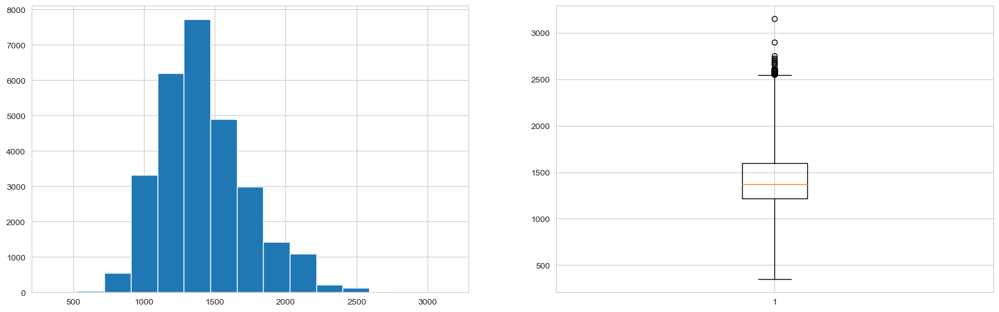

In [105]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["empty_weight"], bins=15)

plt.subplot(122)
plt.boxplot(df["empty_weight"], whis=2.5)

plt.show()

## co_emissions

**🧐 [CO₂ emission performance standards for cars and VANs](https://climate.ec.europa.eu/eu-action/transport-emissions/road-transport-reducing-co2-emissions-vehicles/co2-emission-performance-standards-cars-and-vans_en#:~:text=In%20the%20years%20from%202020,as%201.67%20vehicles%20in%202021):**

Passenger cars and vans ('light commercial vehicles') are respectively responsible for around 12% and 2.5% of total EU emissions of carbon dioxide (CO2), which is the main greenhouse gas...On 1 January 2020, [Regulation (EU) 2019/631](https://eur-lex.europa.eu/legal-content/EN/TXT/?uri=CELEX%3A02019R0631-20210301) entered into force, setting CO2 emission performance standards for new passenger cars and vans. 

**Targets (2020-2024):**<br>
For the period 2020-2024, Regulation (EU) 2019/631 confirms the EU fleet-wide CO2 emission targets set under Regulations (EC) No 443/2009 and (EU) No 510/2011.
- Cars: 95 g CO2/km
- Vans: 147 g CO2/km

**🧐 [What is low CO2 emission?](https://www.cazoo.co.uk/the-view/buying/what-are-co2-emissions/)**<br>
What is considered a **'good' CO2 emission level** for a car? Anything **less than 100g/km** can be considered low – or good – CO2 emissions.

**🧐 [What sort of cars produce the least CO2?](https://www.cazoo.co.uk/the-view/buying/what-are-co2-emissions/)**<br>
- **Diesel cars** produce **a lot less CO2** than petrol cars. That’s because diesel fuel has a different chemical makeup to petrol, and diesel engines burn their fuel more efficiently.
- **Conventional hybrid cars** (also known as self-charging hybrids) generally produce **very little CO2** because they have the capability to run on electric power some of the time. Plug-in hybrids have very low CO2 emissions because they have a much longer electric-only range. 
- **Electric cars** produce **NO carbon emissions**, which is why they’re sometimes referred to as ‘zero-emissions’ vehicles.

**🧐 [WHICH CARS ARE THE WORST OFFENDERS WHEN IT COMES TO CARBON EMISSIONS?](https://www.coastcaptureair.com/blog/worst-cars-for-carbon-emissions)**

**🧐 [Best Low Emission Cars 2022](https://www.moneyshake.com/car-finance-guides/electric-and-hybrid-guides/best-low-emission-cars-2022)**

**🧐 [Hot air: the worst cars for real-world CO2 emissions](https://www.motoringresearch.com/car-news/hot-air-worst-cars-for-real-world-co2-emissions/)**

In [106]:
first_looking("co_emissions")

COLUMN NAME    :  co_emissions
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  389
--------------------------------
0.000      1412
124.000    1074
115.000     681
99.000      587
119.000     574
89.000      549
129.000     528
117.000     521
139.000     467
109.000     456
108.000     454
114.000     409
113.000     386
110.000     380
123.000     375
104.000     363
116.000     358
130.000     355
120.000     335
138.000     332
149.000     328
127.000     310
125.000     306
112.000     288
105.000     273
107.000     257
111.000     250
93.000      249
178.000     239
273.000     234
98.000      233
128.000     233
126.000     228
145.000     227
96.000      216
121.000     213
118.000     212
137.000     210
276.000     208
142.000     206
95.000      204
85.000      199
155.000     197
133.000     196
135.000     195
131.000     194
148.000     194
122.000     193
143.000     193
106.000     190
167.000     189
154.000     184
134.0

In [107]:
df["co_emissions"].describe()

count   28614.000
mean      132.008
std        56.991
min         0.000
25%       107.000
50%       124.000
75%       155.000
max       940.000
Name: co_emissions, dtype: float64

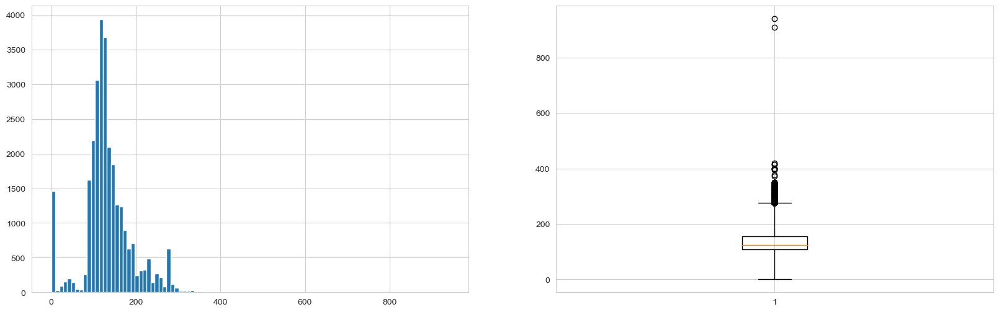

In [108]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["co_emissions"], bins=100)

plt.subplot(122)
plt.boxplot(df["co_emissions"], whis=2.5)

plt.show()

In [109]:
df.sort_values(by=["co_emissions"], ascending=False)["co_emissions"].head(20)

# df["co_emissions"].sort_values(ascending=False).head(20)

22010   940.000
20797   910.000
21923   420.000
27896   414.000
27509   414.000
613     400.000
610     400.000
21541   399.000
19523   398.000
21569   394.000
1299    377.000
1502    373.000
21644   350.000
21778   350.000
21606   350.000
21921   350.000
21793   350.000
21553   350.000
21645   350.000
1542    348.000
Name: co_emissions, dtype: float64

In [110]:
df.sort_values(by=["co_emissions"], ascending=True)["co_emissions"].head(20)

# df["co_emissions"].sort_values(ascending=False).head(20)

11517   0.000
2255    0.000
14188   0.000
14196   0.000
2246    0.000
14212   0.000
14235   0.000
14248   0.000
14264   0.000
14268   0.000
2235    0.000
14277   0.000
14284   0.000
14163   0.000
2230    0.000
14316   0.000
14317   0.000
14404   0.000
14406   0.000
14427   0.000
Name: co_emissions, dtype: float64

In [111]:
df.groupby(["make_model", "body_type", "fuel_type", "co_emissions"]).price.describe()

count      mean  \
make_model   body_type        fuel_type co_emissions                    
Dacia        Compact          Benzine   130.000       3.000 21431.000   
             Sedan            Benzine   130.000       1.000  9999.000   
             Station wagon    Benzine   130.000       1.000 21799.000   
Dacia Break  Station wagon    Benzine   124.000       1.000 20500.000   
Dacia Dokker Compact          Diesel    108.000       1.000 11930.000   
...                                                     ...       ...   
Volvo XC90   Off-Road/Pick-up Diesel    224.000       2.000 11850.000   
                              Electric  0.000         4.000 64400.000   
             Sedan            Diesel    47.000        3.000 60366.667   
             Station wagon    Diesel    149.000       2.000 29500.000   
                                        152.000       2.000 36000.000   

                                                           std       min  \
make_model   body_type        fuel_type co_emissions                       
Dacia        Compact          Benzine   130.000       1661.744 19515.000   
             Sedan            Benzine   130.000            NaN  9999.000   
             Station wagon    Benzine   130.000            NaN 21799.000   
Dacia Break  Station wagon    Benzine   124.000            NaN 20500.000   
Dacia Dokker Compact          Diesel    108.000            NaN 11930.000   
...                                                        ...       ...   
Volvo XC90   Off-Road/Pick-up Diesel    224.000          0.000 11850.000   
                              Electric  0.000         9814.955 55900.000   
             Sedan            Diesel    47.000       21250.255 47700.000   
             Station wagon    Diesel    149.000          0.000 29500.000   
                                        152.000          0.000 36000.000   

                                                           25%       50%  \
make_model   body_type        fuel_type co_emissions                       
Dacia        Compact          Benzine   130.000      20907.000 22299.000   
             Sedan            Benzine   130.000       9999.000  9999.000   
             Station wagon    Benzine   130.000      21799.000 21799.000   
Dacia Break  Station wagon    Benzine   124.000      20500.000 20500.000   
Dacia Dokker Compact          Diesel    108.000      11930.000 11930.000   
...                                                        ...       ...   
Volvo XC90   Off-Road/Pick-up Diesel    224.000      11850.000 11850.000   
                              Electric  0.000        55900.000 64400.000   
             Sedan            Diesel    47.000       48100.000 48500.000   
             Station wagon    Diesel    149.000      29500.000 29500.000   
                                        152.000      36000.000 36000.000   

                                                           75%       max  
make_model   body_type        fuel_type co_emissions                      
Dacia        Compact          Benzine   130.000      22389.000 22479.000  
             Sedan            Benzine   130.000       9999.000  9999.000  
             Station wagon    Benzine   130.000      21799.000 21799.000  
Dacia Break  Station wagon    Benzine   124.000      20500.000 20500.000  
Dacia Dokker Compact          Diesel    108.000      11930.000 11930.000  
...                                                        ...       ...  
Volvo XC90   Off-Road/Pick-up Diesel    224.000      11850.000 11850.000  
                              Electric  0.000        72900.000 72900.000  
             Sedan            Diesel    47.000       66700.000 84900.000  
             Station wagon    Diesel    149.000      29500.000 29500.000  
                                        152.000      36000.000 36000.000  

[7638 rows x 8 columns]

In [112]:
df.loc[df["co_emissions"] > 300][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]\
                                 .sort_values(by=["co_emissions"], ascending=False)

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight,co_emissions
22010,Ford Edge,2.000,Off-Road/Pick-up,Automatic,4WD,8.000,1995.000,Diesel,2116.000,940.000
20797,Ford Fiesta,1.000,Compact,Manual,Front,6.000,1496.000,Benzine,1242.000,910.000
21923,Ford Mustang,1.000,Coupe,Automatic,Rear,6.000,4949.000,Benzine,1725.000,420.000
27896,Volvo V60,5.000,Station wagon,Manual,Front,6.000,1969.000,Diesel,1690.000,414.000
27509,Volvo V60,5.000,Station wagon,Manual,Front,6.000,1969.000,Diesel,1690.000,414.000
610,Mercedes-Benz G 500,23.000,Convertible,Automatic,4WD,7.000,4996.000,Benzine,2350.000,400.000
613,Mercedes-Benz G 500,23.000,Convertible,Automatic,4WD,7.000,4996.000,Benzine,2350.000,400.000
21541,Ford Mustang,1.000,Coupe,Automatic,Rear,6.000,5162.000,Benzine,1992.000,399.000
19523,Nissan GT-R,12.000,Coupe,Automatic,4WD,6.000,3799.000,Benzine,1740.000,398.000
21569,Ford Mustang,0.000,Coupe,Automatic,Rear,6.000,5162.000,Benzine,1950.000,394.000


In [113]:
# df.loc[df.make_model == "Ford Edge"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]
# df.loc[df.make_model == "Ford Fiesta"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]
# df.loc[df.make_model == "Ford Mustang"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]
# df.loc[df.make_model == "Volvo V60"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]
# df.loc[df.make_model == "Mercedes-Benz G 500"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]
# df.loc[df.make_model == "Nissan GT-R"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]
# df.loc[df.make_model == "Mercedes-Benz E 63 AMG"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]
# df.loc[df.make_model == "Ford GT"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]
# df.loc[df.make_model == "Toyota Land Cruiser"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]
df.loc[df.make_model == "Mercedes-Benz SL 600"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight,co_emissions
604,Mercedes-Benz SL 600,14.000,Convertible,Automatic,Rear,5.000,5513.000,Benzine,1950.000,330.000
684,Mercedes-Benz SL 600,28.000,Convertible,Automatic,Rear,4.000,5987.000,Benzine,1950.000,330.000
720,Mercedes-Benz SL 600,26.000,Convertible,Automatic,Rear,5.000,5987.000,Benzine,1950.000,330.000
721,Mercedes-Benz SL 600,12.000,Convertible,Automatic,Rear,5.000,5513.000,Benzine,2045.000,326.000
753,Mercedes-Benz SL 600,14.000,Convertible,Automatic,Rear,5.000,5513.000,Benzine,1945.000,330.000


### Domain Knowledge About Average ``co2 emission values`` of some Vehicles:

- ``Ford Edge``'s co2 emission value is **153 g/km**
- ``Ford Fiesta``'s co2 emission value is **108 g/km**
- ``Ford Mustang``'s co2 emission value is **299 g/km**
- ``Volvo V60``'s co2 emission value is **146 g/km**
- ``Mercedes-Benz G 500``'s co2 emission value is **252-299 g/km**
- ``Nissan GT-R``'s co2 emission value is **275 g/km**
- ``Mercedes-Benz E 63 AMG``'s co2 emission value is **230 g/km**
- ``Ford GT``'s co2 emission value is **349.6 g/km**
- ``Toyota Land Cruiser``'s co2 emission value is **262.0 g/km**
- ``Mercedes-Benz SL 55 AMG``'s co2 emission value is **324 g/km**
- ``Mercedes-Benz SL 600``'s co2 emission value is **326-370 g/km**

**To get more information in detail about Average Car Emission of each maake and model, you can visit [car-emissions.com](https://www.car-emissions.com/) and [cars-data.com](https://www.cars-data.com/search_results.html?q=emissions)**

In [114]:
df[(~(df["make_model"] == "Ford GT") | ~(df["make_model"].str.contains("Mercedes-Benz"))) & (df["co_emissions"] > 330)][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]\
                                 .sort_values(by=["co_emissions"], ascending=False)

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight,co_emissions
22010,Ford Edge,2.000,Off-Road/Pick-up,Automatic,4WD,8.000,1995.000,Diesel,2116.000,940.000
20797,Ford Fiesta,1.000,Compact,Manual,Front,6.000,1496.000,Benzine,1242.000,910.000
21923,Ford Mustang,1.000,Coupe,Automatic,Rear,6.000,4949.000,Benzine,1725.000,420.000
27896,Volvo V60,5.000,Station wagon,Manual,Front,6.000,1969.000,Diesel,1690.000,414.000
27509,Volvo V60,5.000,Station wagon,Manual,Front,6.000,1969.000,Diesel,1690.000,414.000
610,Mercedes-Benz G 500,23.000,Convertible,Automatic,4WD,7.000,4996.000,Benzine,2350.000,400.000
613,Mercedes-Benz G 500,23.000,Convertible,Automatic,4WD,7.000,4996.000,Benzine,2350.000,400.000
21541,Ford Mustang,1.000,Coupe,Automatic,Rear,6.000,5162.000,Benzine,1992.000,399.000
19523,Nissan GT-R,12.000,Coupe,Automatic,4WD,6.000,3799.000,Benzine,1740.000,398.000
21569,Ford Mustang,0.000,Coupe,Automatic,Rear,6.000,5162.000,Benzine,1950.000,394.000


In [115]:
cond_emission = (~(df["make_model"] == "Ford GT") | ~(df["make_model"].str.contains("Mercedes-Benz"))) & (df["co_emissions"] > 400)
df[cond_emission][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions"]]

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight,co_emissions
20797,Ford Fiesta,1.000,Compact,Manual,Front,6.000,1496.000,Benzine,1242.000,910.000
21923,Ford Mustang,1.000,Coupe,Automatic,Rear,6.000,4949.000,Benzine,1725.000,420.000
22010,Ford Edge,2.000,Off-Road/Pick-up,Automatic,4WD,8.000,1995.000,Diesel,2116.000,940.000
27509,Volvo V60,5.000,Station wagon,Manual,Front,6.000,1969.000,Diesel,1690.000,414.000
27896,Volvo V60,5.000,Station wagon,Manual,Front,6.000,1969.000,Diesel,1690.000,414.000


In [116]:
outlier_emission = df["co_emissions"].isin([940, 910, 420, 414])

df.loc[outlier_emission, "co_emissions"] = np.nan

# df["engine_size"].replace([940, 910, 420, 414], np.nan, inplace=True)
# df.loc[cond_emission, "co_emissions"] = np.nan

In [117]:
df["co_emissions"].isnull().sum()

5

In [118]:
fill(df, "make_model", "body_type", "co_emissions", "median")

COLUMN NAME    :  co_emissions
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  385
--------------------------------
0.000      1412
124.000    1074
115.000     681
99.000      587
119.000     574
89.000      549
129.000     528
117.000     521
139.000     467
109.000     456
108.000     454
114.000     409
113.000     386
110.000     380
123.000     375
104.000     363
116.000     358
130.000     355
120.000     337
138.000     332
149.000     328
127.000     310
125.000     306
112.000     288
105.000     273
107.000     257
111.000     251
93.000      249
178.000     239
273.000     234
98.000      233
128.000     233
126.000     228
145.000     227
96.000      216
121.000     213
118.000     212
137.000     210
276.000     209
142.000     206
95.000      204
85.000      199
155.000     197
133.000     196
135.000     195
131.000     194
148.000     194
122.000     193
143.000     193
106.000     190
167.000     189
154.000     184
134.0

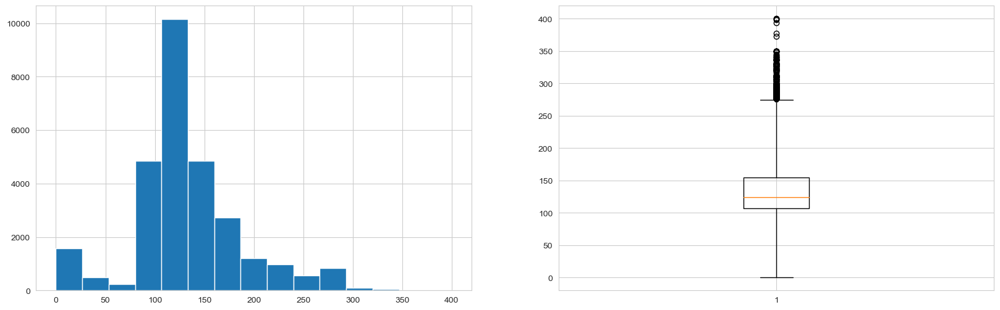

In [119]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["co_emissions"], bins=15)

plt.subplot(122)
plt.boxplot(df["co_emissions"], whis=2.5)

plt.show()

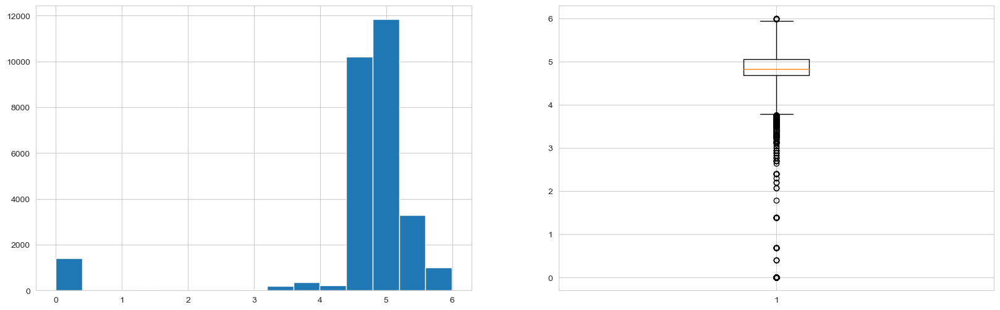

In [120]:
plt.figure(figsize = (20, 6))

plt.subplot(121)
# df["co_emissions"].map(np.log).hist(bins=15)
# plt.hist(np.log(df["co_emissions"]), bins=15)  # This code (np.log) does NOT work due to the values 0
                                                 # -inf is what you get from computing np.log(0.)
plt.hist(np.log1p(df['co_emissions']), bins=15)

plt.subplot(122)
# df["co_emissions"].map(np.log).boxplot(whis=2.5)
plt.boxplot(np.log1p(df["co_emissions"]), whis=2.5)  

plt.show()

# ValueError: supplied range of [-inf, 6.84587987526405] is not finite

# Make sure the data does not have;

# Null/None
# ""/empty string
# Too many zeros (0)
# float('inf') or float('-inf')

# https://stackoverflow.com/questions/66055838/my-data-has-no-nan-but-i-keep-getting-the-finite-error

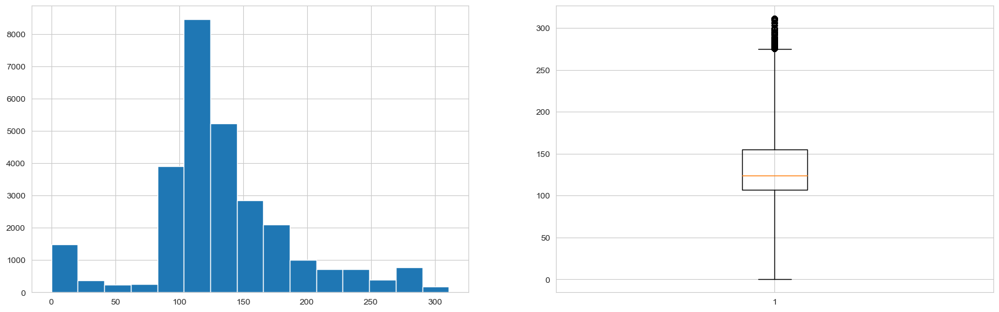

In [121]:
plt.figure(figsize = (20, 6))

plt.subplot(121)
plt.hist(winsorize(df["co_emissions"], (0.001, 0.003)), bins = 15)

plt.subplot(122)
plt.boxplot(winsorize(df["co_emissions"], (0.001, 0.003)), whis=2.5)

plt.show()

## cons_avg

Simply put, the average fuel consumption of your car is a calculation of how many kilometres you were able to travel for every litre of fuel used, be it diesel or petrol. Some vehicles will help you out by calculating your averages and sometimes even give you an instantaneous reading of how much fuel you are using. 

Fuel consumption is most commonly quoted as litres per 100 kilometres condensed to read as "l/100km". A more tradition way of measuring it is kilometres per litre expressed in "km/l".

Both of these give a similar indication of the amount of fuel used and l/100km is more common because the lower the number, the better the fuel consumption of the vehicle - remember, using less fuel is better!

The longer you drive, the more information the car has to be able to work out your average fuel consumption. Steady driving uses less fuel than stop-start driving and the amount of time or kilometres you spent in these situations is reflected in your average fuel consumption. Driving erratically, accelerating hard and stopping suddenly all negatively affect your fuel consumption.

If you travelled 10 kilometres and used 1 litre of fuel, your car has an average fuel consumption of 10 km/l or 10 l/100km. Similarly, if you travelled 10 km and used 2 litres of fuel, your car did 5 km/l. 10 ÷ 2 = 5. This is equal to 20 l/100km when converted. 10 is the magic number and the crossover point for the conversion between km/l and l/100km.

**🧐 [What is Fuel consumption (average)? How is it calculated?](https://www.autotrader.co.za/cars/news-and-advice/automotive-news/what-is-fuel-consumption-(average)-how-is-it-calculated/9831)**

**🧐 [10 Cars with the Worst Fuel Economy](https://www.caranddriver.com/features/g30256394/worst-fuel-economy-cars/)**

**🧐 [The 15 Cars With the Worst Fuel Economy on Sale Today](https://www.motortrend.com/features/cars-worst-fuel-economy-list/)**

**🧐 [The 5 most fuel-efficient cars on the road today](https://www.businessinsider.com/most-fuel-efficient-cars-vehicles-best-gas-mileage-2019-11)**

**🧐 [2023 Best and Worst Fuel Economy Vehicles](https://www.fueleconomy.gov/feg/best-worst.shtml)**

**🧐 [The most fuel efficient vehicles](https://www.spritmonitor.de/en/evaluation/economic_models.html)**

In [122]:
first_looking("cons_avg")

COLUMN NAME    :  cons_avg
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  217
--------------------------------
4.900     1043
5.000      966
4.500      889
5.100      886
5.300      885
0.000      715
4.700      710
5.400      706
4.600      682
5.600      675
4.800      670
4.300      641
5.200      615
5.900      612
3.800      612
4.100      606
4.200      605
5.700      595
5.500      569
4.000      552
4.400      523
6.300      513
6.000      500
3.700      474
5.800      467
6.400      452
2.359      443
3.900      394
3.600      394
6.500      344
6.900      334
7.000      333
7.400      323
6.100      306
3.400      302
6.600      302
6.200      300
6.700      269
7.100      267
12.000     263
6.800      248
7.300      246
8.400      229
7.700      220
7.600      208
7.500      206
7.200      204
8.000      203
3.500      194
12.100     192
7.800      184
8.200      170
9.800      138
8.300      128
8.900      119
3.300      115
9

In [123]:
df.cons_avg.describe()

count   28614.000
mean        5.704
std         2.793
min         0.000
25%         4.400
50%         5.300
75%         6.600
max        99.900
Name: cons_avg, dtype: float64

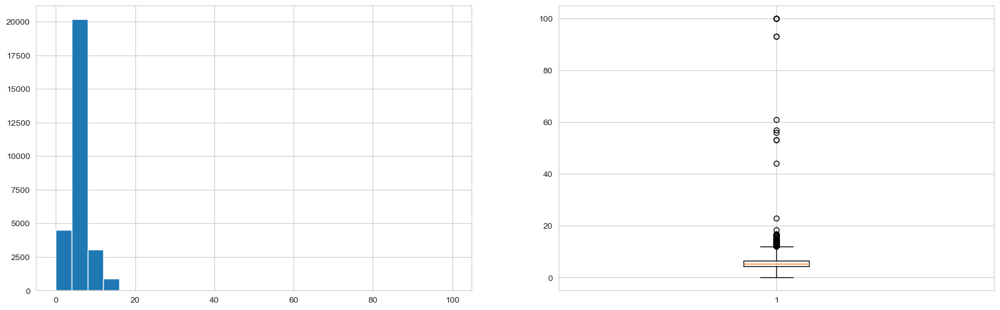

In [124]:
plt.figure(figsize = (20, 6))

plt.subplot(121)
plt.hist(df.cons_avg, bins = 25)

plt.subplot(122)
plt.boxplot(df.cons_avg, whis=2.5)

plt.show()

In [125]:
df.sort_values(by=["cons_avg"], ascending=False)["cons_avg"].head(20)

# df["cons_avg"].sort_values(ascending=False).head(20)

265     99.900
18798   99.900
23004   99.900
18799   99.900
21012   93.000
20995   93.000
1771    61.000
6580    57.000
18546   56.000
23974   53.000
24144   53.000
19904   44.000
21345   23.000
21531   18.300
21569   16.800
613     16.700
610     16.700
10406   16.700
1214    16.500
1253    16.500
Name: cons_avg, dtype: float64

In [126]:
df.sort_values(by=["cons_avg"], ascending=True)["cons_avg"].head(20)

# df["cons_avg"].sort_values(ascending=True).head(20)
# df.cons_avg.sort_values().tail(20)

7317    0.000
993     0.000
17234   0.000
3363    0.000
5287    0.000
18287   0.000
3357    0.000
5301    0.000
17213   0.000
1015    0.000
3344    0.000
26715   0.000
5333    0.000
18298   0.000
19775   0.000
1038    0.000
18300   0.000
26726   0.000
18301   0.000
3325    0.000
Name: cons_avg, dtype: float64

In [127]:
df.groupby(["make_model", "body_type", "fuel_type", "cons_avg"]).mileage.describe()

count       mean       std  \
make_model   body_type        fuel_type cons_avg                               
Dacia        Compact          Benzine   5.600     3.000    865.333  1308.276   
             Sedan            Benzine   5.600     1.000  59098.000       NaN   
             Station wagon    Benzine   5.600     1.000   2000.000       NaN   
Dacia Break  Station wagon    Benzine   5.300     1.000    999.000       NaN   
Dacia Dokker Compact          Diesel    4.200     1.000 141100.000       NaN   
...                                                 ...        ...       ...   
Volvo XC90   Off-Road/Pick-up Diesel    9.100     2.000 237102.000     0.000   
                              Electric  2.359     4.000  40399.500 32215.568   
             Sedan            Diesel    6.700     3.000  58761.333 34192.796   
             Station wagon    Diesel    5.700     2.000 150000.000     0.000   
                                        5.800     2.000 143550.000     0.000   

                                                        min        25%  \
make_model   body_type        fuel_type cons_avg                         
Dacia        Compact          Benzine   5.600       110.000    110.000   
             Sedan            Benzine   5.600     59098.000  59098.000   
             Station wagon    Benzine   5.600      2000.000   2000.000   
Dacia Break  Station wagon    Benzine   5.300       999.000    999.000   
Dacia Dokker Compact          Diesel    4.200    141100.000 141100.000   
...                                                     ...        ...   
Volvo XC90   Off-Road/Pick-up Diesel    9.100    237102.000 237102.000   
                              Electric  2.359     12500.000  12500.000   
             Sedan            Diesel    6.700     20635.000  44787.500   
             Station wagon    Diesel    5.700    150000.000 150000.000   
                                        5.800    143550.000 143550.000   

                                                        50%        75%  \
make_model   body_type        fuel_type cons_avg                         
Dacia        Compact          Benzine   5.600       110.000   1243.000   
             Sedan            Benzine   5.600     59098.000  59098.000   
             Station wagon    Benzine   5.600      2000.000   2000.000   
Dacia Break  Station wagon    Benzine   5.300       999.000    999.000   
Dacia Dokker Compact          Diesel    4.200    141100.000 141100.000   
...                                                     ...        ...   
Volvo XC90   Off-Road/Pick-up Diesel    9.100    237102.000 237102.000   
                              Electric  2.359     40399.500  68299.000   
             Sedan            Diesel    6.700     68940.000  77824.500   
             Station wagon    Diesel    5.700    150000.000 150000.000   
                                        5.800    143550.000 143550.000   

                                                        max  
make_model   body_type        fuel_type cons_avg             
Dacia        Compact          Benzine   5.600      2376.000  
             Sedan            Benzine   5.600     59098.000  
             Station wagon    Benzine   5.600      2000.000  
Dacia Break  Station wagon    Benzine   5.300       999.000  
Dacia Dokker Compact          Diesel    4.200    141100.000  
...                                                     ...  
Volvo XC90   Off-Road/Pick-up Diesel    9.100    237102.000  
                              Electric  2.359     68299.000  
             Sedan            Diesel    6.700     86709.000  
             Station wagon    Diesel    5.700    150000.000  
                                        5.800    143550.000  

[6838 rows x 8 columns]

In [128]:
df.loc[df["cons_avg"] >= 10][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]\
                                 .sort_values(by=["cons_avg"], ascending=False)

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight,co_emissions,cons_avg
18799,Nissan Qashqai,5.000,Compact,Manual,Front,6.000,1197.000,Benzine,1250.000,129.000,99.900
265,Mercedes-Benz A 180,2.000,Compact,Automatic,Front,7.000,1332.000,Benzine,1265.000,138.000,99.900
18798,Nissan Qashqai,3.000,Compact,Manual,Front,6.000,1332.000,Benzine,1275.000,121.000,99.900
23004,Ford Focus,3.000,Sedan,Automatic,Front,6.000,1499.000,Diesel,1280.000,112.000,99.900
20995,Ford Focus,4.000,Compact,Manual,Front,6.000,1499.000,Diesel,1263.000,93.000,93.000
21012,Ford Focus,3.000,Compact,Manual,Front,6.000,1499.000,Diesel,1263.000,93.000,93.000
1771,Mercedes-Benz E 200,8.000,Station wagon,Automatic,Rear,7.000,1991.000,Benzine,1735.000,142.000,61.000
6580,Renault Megane,3.000,Station wagon,Manual,Front,6.000,1332.000,Benzine,1362.000,139.000,57.000
18546,Toyota Yaris,0.000,Sedan,Manual,Front,5.000,998.000,Benzine,1100.000,127.000,56.000
23974,Hyundai KONA,1.000,Off-Road/Pick-up,Manual,Front,6.000,998.000,Benzine,1233.000,122.000,53.000


In [129]:
df.loc[df.make_model == "Mercedes-Benz A 180"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Nissan Qashqai"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Ford Focus"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Mercedes-Benz E 200"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Renault Megane"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Toyota Yaris"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Hyundai KONA"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Mercedes-Benz GLC 63 AMG"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Ford Mustang"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Nissan GT-R"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Nissan Skyline"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Nissan 370Z"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Peugeot 205"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Volvo C70"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Renault Alpine A310"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Hyundai Genesis"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Fiat Coupe"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]
# df.loc[df.make_model == "Ford Thunderbird"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg"]]

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight,co_emissions,cons_avg
13,Mercedes-Benz A 180,2.000,Compact,Manual,Front,6.000,1461.000,Diesel,1330.000,120.000,4.500
15,Mercedes-Benz A 180,12.000,Compact,Manual,Front,7.000,1991.000,Diesel,1295.000,138.000,5.200
18,Mercedes-Benz A 180,2.000,Compact,Automatic,Front,7.000,1461.000,Diesel,1445.000,99.500,3.900
20,Mercedes-Benz A 180,4.000,Compact,Automatic,Front,7.000,1461.000,Diesel,1425.000,99.500,3.700
21,Mercedes-Benz A 180,2.000,Compact,Automatic,Front,7.000,1461.000,Diesel,1455.000,99.500,3.900
22,Mercedes-Benz A 180,1.000,Compact,Manual,Front,6.000,1332.000,Benzine,1350.000,126.000,0.000
25,Mercedes-Benz A 180,4.000,Compact,Automatic,Front,7.000,1461.000,Diesel,1425.000,99.500,3.700
31,Mercedes-Benz A 180,2.000,Compact,Automatic,Front,7.000,1332.000,Benzine,1295.000,128.000,5.600
34,Mercedes-Benz A 180,5.000,Compact,Automatic,Front,7.000,1595.000,Benzine,1395.000,126.000,5.400
35,Mercedes-Benz A 180,2.000,Compact,Manual,Front,6.000,1332.000,Benzine,1350.000,126.000,0.000


### Domain Knowledge About ``Average Fuel Consumptions`` of some Vehicles:

- ``Mercedes-Benz A 180``'s Average Fuel Consumption value is **5.7 L/100km**
- ``Nissan Qashqai``'s Average Fuel Consumption value is **6.2 L/100 km**
- ``Ford Focus``'s co2 Average Fuel Consumption value is **4.6 to 6.7 L/100 km**
- ``Mercedes-Benz E 200``'s Average Fuel Consumption value is **7.1 to 8 L/100 km**
- ``Renault Megane``'s Average Fuel Consumption value is **4.4 to 6.8 L/100 km**
- ``Toyota Yaris``'s Average Fuel Consumption value is **5.4 to 6.9 L/100 km**
- ``Hyundai KONA``'s Average Fuel Consumption value is **4 to 5.8 L/100 km**
- ``Mercedes-Benz GLC 63 AMG``'s Average Fuel Consumption value is **9 to 16 L/100km**
- ``Ford Mustang``'s Average Fuel Consumption value is **12 to 16.2 L/100 km**
- ``Nissan GT-R``'s co2 Average Fuel Consumption value is **11.8 to 19.4 L/100 km**
- ``Nissan Skyline``'s Average Fuel Consumption value is **16 to 17.7 L/100 km**
- ``Nissan 370Z``'s Average Fuel Consumption value is **11.2 to 18.1 L/100 km**
- ``Peugeot 205``'s Average Fuel Consumption value is **6.3 to 9.9 L/100 km**
- ``Volvo C70``'s Average Fuel Consumption value is **8.9 to 9.8 L/100 km**
- ``Renault Alpine A310``'s Average Fuel Consumption value is **8.7 to 16.6 L/100 km**
- ``Hyundai Genesis``'s Average Fuel Consumption value is **9.4 to 14.4 L/100 km**
- ``Fiat Coupe``'s Average Fuel Consumption value is **8 to 14 L/100 km**
- ``Ford Thunderbird``'s Average Fuel Consumption value is **13.5 to 19 L/100 km**

<img src=https://i.ibb.co/YPB2RWx/least-fuel-consumption.png width="500" height="100">

**To get more information in detail about Average Car Emission of each maake and model, you can visit [car-emissions.com](https://www.car-emissions.com/), [incardoc.com](https://incardoc.com/en-us/), and [carsfuelconsumption.com](http://carsfuelconsumption.com/)**

**Considering our domain knowledge, it can be concluded that the max value equal to/greater than 20 is anomaly.**

In [130]:
cond_cons_avg = (df["cons_avg"] >= 20)
df.loc[cond_cons_avg, "cons_avg"] = np.nan

# outlier_consumption = df["ons_avg"].isin([23.000, 44.000, 53.000, 56.000, 57.000, 61.000, 93.000, 99.900])
# df["cons_avg"].replace([23.000, 44.000, 53.000, 56.000, 57.000, 61.000, 93.000, 99.900], np.nan, inplace=True)

In [131]:
df["cons_avg"].isnull().sum()

13

In [132]:
fill(df, "make_model", "body_type", "cons_avg", "median")

COLUMN NAME    :  cons_avg
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  209
--------------------------------
4.900     1043
5.000      966
4.500      889
5.300      887
5.100      886
0.000      715
4.700      710
5.400      706
4.600      682
5.600      675
4.800      670
4.300      641
5.200      617
3.800      613
5.900      612
4.100      607
4.200      605
5.700      595
5.500      571
4.000      552
4.400      524
6.300      513
6.000      500
3.700      474
5.800      467
6.400      452
2.359      443
3.900      394
3.600      394
6.500      344
6.900      334
7.000      333
7.400      323
6.100      306
6.600      302
3.400      302
6.200      300
6.700      269
7.100      267
12.000     263
6.800      248
7.300      246
8.400      229
7.700      220
7.600      208
7.500      206
7.200      204
8.000      203
3.500      194
12.100     192
7.800      184
8.200      170
9.800      138
8.300      128
8.900      119
3.300      115
9

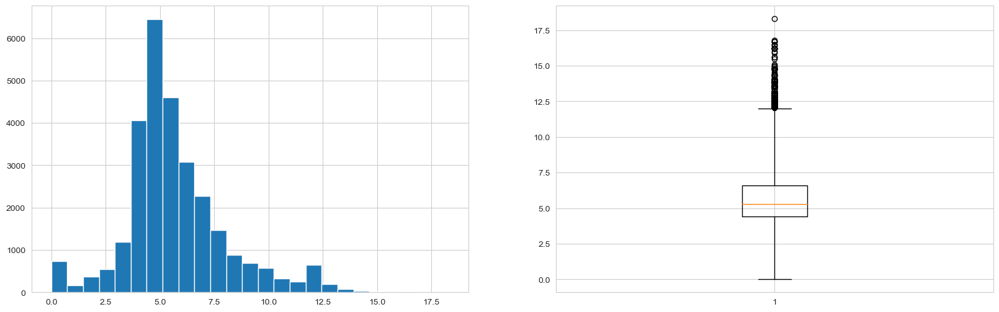

In [133]:
plt.figure(figsize = (20, 6))

plt.subplot(121)
plt.hist(df.cons_avg, bins = 25)

plt.subplot(122)
plt.boxplot(df.cons_avg, whis=2.5)

plt.show()

## previous_owner

Being able to trace the car back to the original owner is important to some buyers, as you are able to directly find out about any faults with the vehicle. Having lots of previous_owners can be off-putting as it looks like the vehicle has lots of issues.

In [134]:
first_looking("previous_owner")

COLUMN NAME    :  previous_owner
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  13
--------------------------------
1.000     18696
2.000      7196
3.000      1756
4.000       498
5.000       205
6.000       100
8.000        71
7.000        57
9.000        25
12.000        6
10.000        2
14.000        1
13.000        1
Name: previous_owner, dtype: int64


In [135]:
df["previous_owner"].describe()

count   28614.000
mean        1.513
std         0.940
min         1.000
25%         1.000
50%         1.000
75%         2.000
max        14.000
Name: previous_owner, dtype: float64

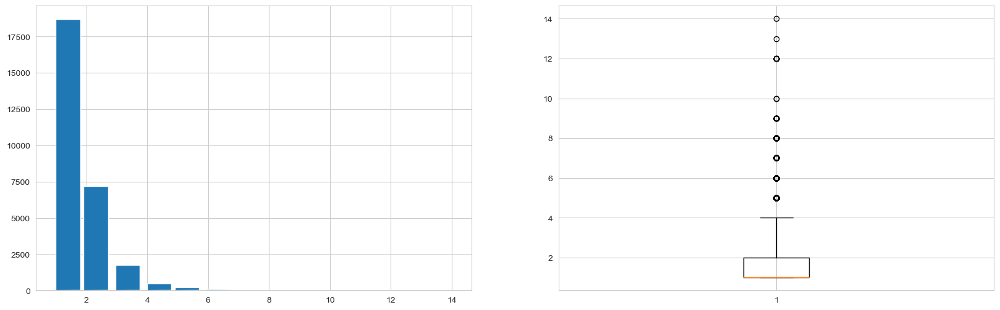

In [136]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["previous_owner"], bins=100, width=0.8)

plt.subplot(122)
plt.boxplot(df["previous_owner"], whis=2.5)

plt.show()

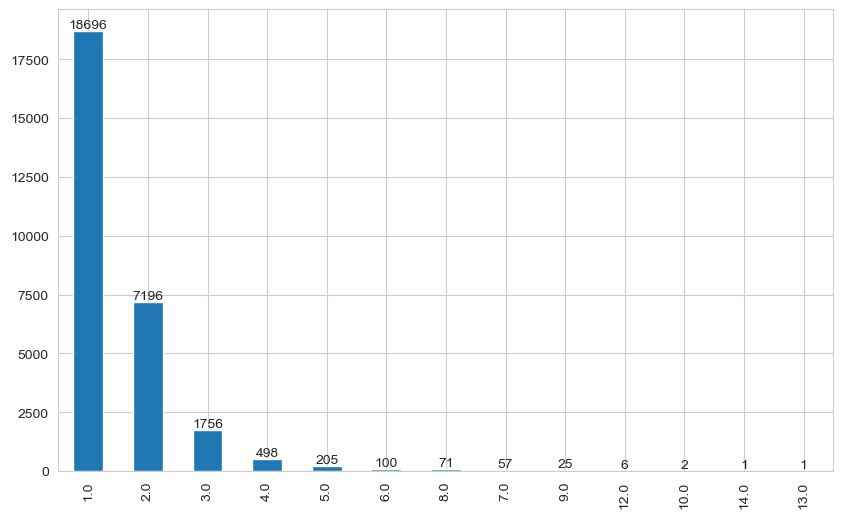

In [137]:
fig, ax = plt.subplots()

df["previous_owner"].value_counts(dropna = False).plot.bar()

for container in ax.containers:
    ax.bar_label(container);

In [138]:
df.sort_values(by=["previous_owner"], ascending=True)["previous_owner"].head(20)

# df["previous_owner"].sort_values(ascending=False).head(20)

14309   1.000
23062   1.000
13598   1.000
13596   1.000
23064   1.000
13594   1.000
13593   1.000
13592   1.000
13591   1.000
13590   1.000
13589   1.000
13588   1.000
13587   1.000
13586   1.000
13585   1.000
13584   1.000
23061   1.000
13582   1.000
13601   1.000
13603   1.000
Name: previous_owner, dtype: float64

In [139]:
df.sort_values(by=["previous_owner"], ascending=False)["previous_owner"].head(20)

# df["previous_owner"].sort_values(ascending=False).head(20)

7554    14.000
7828    13.000
27850   12.000
28401   12.000
19405   12.000
27820   12.000
28230   12.000
28200   12.000
17535   10.000
7259    10.000
26554    9.000
7571     9.000
3177     9.000
26176    9.000
25751    9.000
26067    9.000
26670    9.000
10385    9.000
26391    9.000
26621    9.000
Name: previous_owner, dtype: float64

In [140]:
df.groupby(["make_model", "body_type", "type", "previous_owner"]).age.describe()

count   mean  \
make_model  body_type        type           previous_owner                 
Dacia       Compact          Demonstration  1.000           1.000  1.000   
                             Pre-registered 1.000           2.000  0.000   
            Sedan            Used           1.000           1.000 47.000   
            Station wagon    Demonstration  1.000           1.000  0.000   
Dacia Break Station wagon    Demonstration  1.000           1.000  0.000   
...                                                           ...    ...   
Volvo XC90  Off-Road/Pick-up Used           3.000           7.000 14.571   
                                            8.000           1.000  8.000   
            Sedan            Used           1.000           2.000  2.000   
                                            2.000           1.000  4.000   
            Station wagon    Used           1.000           4.000  6.000   

                                                             std    min  \
make_model  body_type        type           previous_owner                
Dacia       Compact          Demonstration  1.000            NaN  1.000   
                             Pre-registered 1.000          0.000  0.000   
            Sedan            Used           1.000            NaN 47.000   
            Station wagon    Demonstration  1.000            NaN  0.000   
Dacia Break Station wagon    Demonstration  1.000            NaN  0.000   
...                                                          ...    ...   
Volvo XC90  Off-Road/Pick-up Used           3.000          0.976 14.000   
                                            8.000            NaN  8.000   
            Sedan            Used           1.000          1.414  1.000   
                                            2.000            NaN  4.000   
            Station wagon    Used           1.000          0.000  6.000   

                                                              25%    50%  \
make_model  body_type        type           previous_owner                 
Dacia       Compact          Demonstration  1.000           1.000  1.000   
                             Pre-registered 1.000           0.000  0.000   
            Sedan            Used           1.000          47.000 47.000   
            Station wagon    Demonstration  1.000           0.000  0.000   
Dacia Break Station wagon    Demonstration  1.000           0.000  0.000   
...                                                           ...    ...   
Volvo XC90  Off-Road/Pick-up Used           3.000          14.000 14.000   
                                            8.000           8.000  8.000   
            Sedan            Used           1.000           1.500  2.000   
                                            2.000           4.000  4.000   
            Station wagon    Used           1.000           6.000  6.000   

                                                              75%    max  
make_model  body_type        type           previous_owner                
Dacia       Compact          Demonstration  1.000           1.000  1.000  
                             Pre-registered 1.000           0.000  0.000  
            Sedan            Used           1.000          47.000 47.000  
            Station wagon    Demonstration  1.000           0.000  0.000  
Dacia Break Station wagon    Demonstration  1.000           0.000  0.000  
...                                                           ...    ...  
Volvo XC90  Off-Road/Pick-up Used           3.000          15.000 16.000  
                                            8.000           8.000  8.000  
            Sedan            Used           1.000           2.500  3.000  
                                            2.000           4.000  4.000  
            Station wagon    Used           1.000           6.000  6.000  

[3239 rows x 8 columns]

In [141]:
df.loc[df["previous_owner"] >= 10][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg", "previous_owner"]]\
                                 .sort_values(by=["previous_owner"], ascending=False)

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight,co_emissions,cons_avg,previous_owner
7554,Peugeot 207,15.000,Convertible,Manual,Front,5.000,1598.000,Benzine,1327.000,155.000,6.500,14.000
7828,Peugeot 306,25.000,Convertible,Manual,Front,5.000,1998.000,Benzine,1245.000,0.000,7.600,13.000
19405,Nissan 370Z,12.000,Coupe,Automatic,Rear,6.000,3696.000,Benzine,1483.000,245.000,10.500,12.000
27820,Volvo V70,25.000,Station wagon,Automatic,4WD,5.000,2319.000,Benzine,1651.000,0.000,10.750,12.000
27850,Volvo 945,25.000,Station wagon,Manual,Rear,5.000,1986.000,Liquid/Natural Gas,1320.000,124.000,10.200,12.000
28200,Volvo V70,25.000,Station wagon,Automatic,4WD,5.000,2319.000,Benzine,1651.000,0.000,10.750,12.000
28230,Volvo 945,25.000,Station wagon,Manual,Rear,5.000,1986.000,Liquid/Natural Gas,1320.000,124.000,10.200,12.000
28401,Volvo S70,25.000,Sedan,Manual,Front,5.000,2435.000,Benzine,1370.000,168.000,10.000,12.000
7259,Peugeot 206,18.000,Compact,Automatic,Front,4.000,1587.000,Benzine,1039.000,171.000,7.100,10.000
17535,Toyota MR 2,29.000,Coupe,Manual,Rear,5.000,1998.000,Benzine,1290.000,0.000,7.400,10.000


In [142]:
drop_pre_owner_index = df[df["previous_owner"] >= 10].index
drop_pre_owner_index

Int64Index([7259, 7554, 7828, 17535, 19405, 27820, 27850, 28200, 28230, 28401], dtype='int64')

In [143]:
print(df.shape)
df.drop(drop_pre_owner_index, inplace=True)
print(df.shape)

(28614, 29)
(28604, 29)


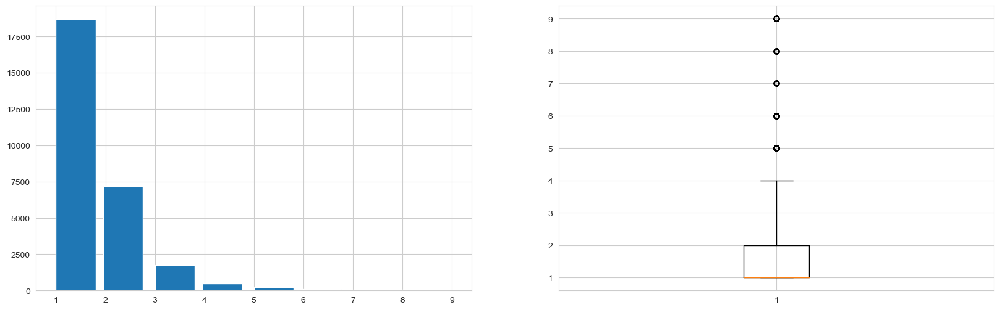

In [144]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["previous_owner"], bins=100, width=0.8)

plt.subplot(122)
plt.boxplot(df["previous_owner"], whis=2.5)

plt.show()

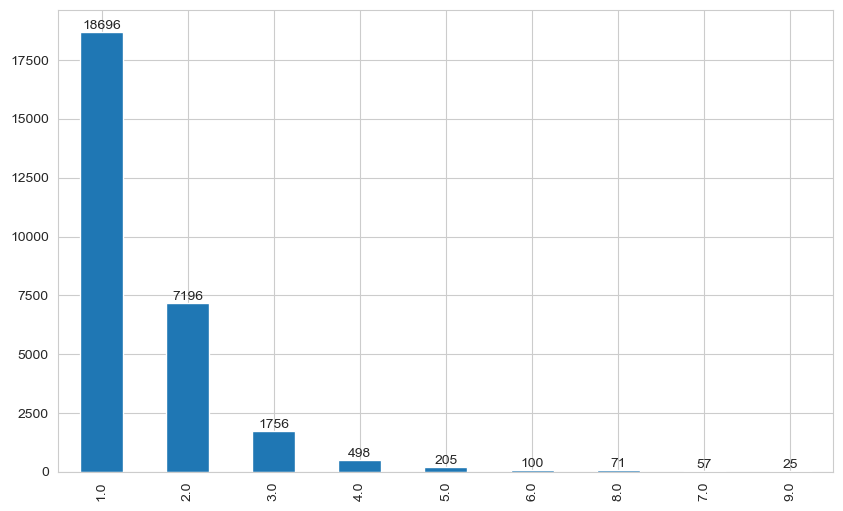

In [145]:
fig, ax = plt.subplots()

df["previous_owner"].value_counts(dropna = False).plot.bar()

for container in ax.containers:
    ax.bar_label(container);

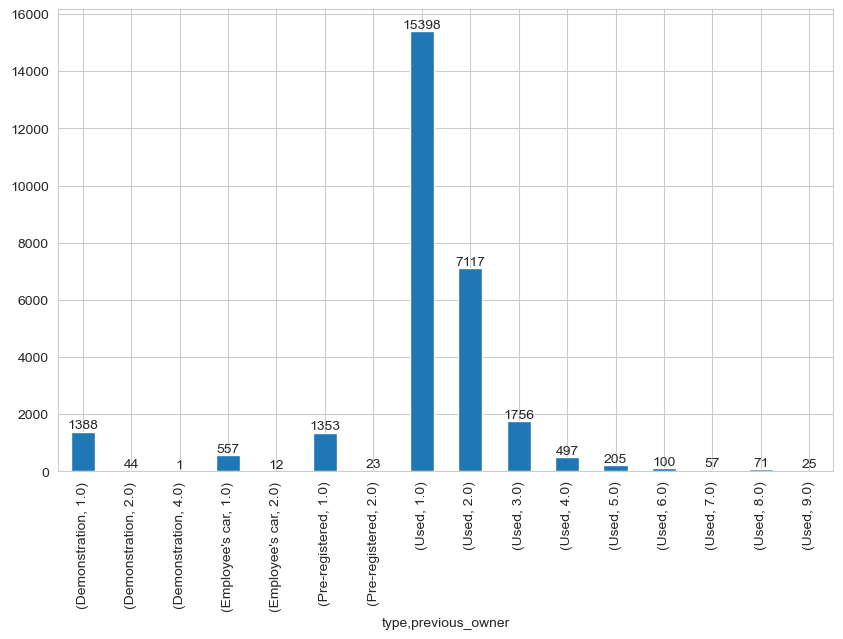

In [146]:
fig, ax = plt.subplots()

df.groupby(["type", "previous_owner"])["previous_owner"].count().plot.bar()

for container in ax.containers:
    ax.bar_label(container);

## age

Probably one of the most obvious factors. The older the car, the more worn it will be and therefore the less desirable it will become. Classics are the exception to this rule, but typically a 15 year old car will hold significantly less value than a five year old model.

In [147]:
first_looking("age")

COLUMN NAME    :  age
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  83
--------------------------------
3.000       3666
4.000       3489
0.000       3087
1.000       2870
2.000       2473
5.000       2426
6.000       1486
7.000       1237
8.000        936
9.000        703
10.000       655
11.000       641
12.000       558
15.000       491
14.000       441
13.000       424
16.000       395
17.000       287
18.000       246
19.000       211
21.000       191
20.000       187
22.000       158
23.000       143
24.000        91
28.000        80
27.000        78
25.000        75
26.000        71
30.000        60
31.000        60
32.000        54
29.000        54
56.000        41
55.000        34
34.000        33
57.000        32
50.000        29
49.000        29
54.000        27
35.000        26
44.000        23
36.000        21
33.000        20
51.000        18
52.000        18
37.000        18
43.000        17
53.000        17
39.000        

In [148]:
df["age"].describe()

count   28604.000
mean        6.821
std         8.735
min      -180.000
25%         2.000
50%         4.000
75%         8.000
max       122.000
Name: age, dtype: float64

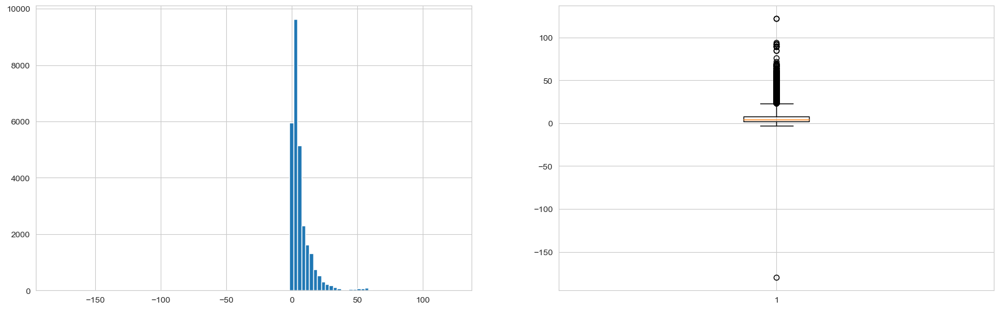

In [149]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["age"], bins=100)

plt.subplot(122)
plt.boxplot(df["age"], whis=2.5)

plt.show()

In [150]:
df.sort_values(by=["age"], ascending=True)["age"].head(20)

# df["age"].sort_values(ascending=False).head(20)

7011    -180.000
9764      -3.000
19213     -1.000
9250       0.000
10677      0.000
27461      0.000
10674      0.000
21979      0.000
21980      0.000
21990      0.000
21994      0.000
10634      0.000
21997      0.000
21998      0.000
10630      0.000
10625      0.000
22004      0.000
22008      0.000
22028      0.000
27440      0.000
Name: age, dtype: float64

In [151]:
df.sort_values(by=["age"], ascending=False)["age"].head(20)

# df["age"].sort_values(ascending=False).head(20)

24783   122.000
22058   122.000
21372    94.000
21200    93.000
21317    92.000
8043     92.000
21386    90.000
21461    90.000
21338    90.000
10009    89.000
21454    85.000
21349    85.000
9258     76.000
3358     72.000
5300     70.000
771      70.000
26698    69.000
26523    69.000
26668    68.000
26493    68.000
Name: age, dtype: float64

In [152]:
df.groupby(["make_model", "body_type", "type", "previous_owner"]).age.describe()

count   mean  \
make_model  body_type        type           previous_owner                 
Dacia       Compact          Demonstration  1.000           1.000  1.000   
                             Pre-registered 1.000           2.000  0.000   
            Sedan            Used           1.000           1.000 47.000   
            Station wagon    Demonstration  1.000           1.000  0.000   
Dacia Break Station wagon    Demonstration  1.000           1.000  0.000   
...                                                           ...    ...   
Volvo XC90  Off-Road/Pick-up Used           3.000           7.000 14.571   
                                            8.000           1.000  8.000   
            Sedan            Used           1.000           2.000  2.000   
                                            2.000           1.000  4.000   
            Station wagon    Used           1.000           4.000  6.000   

                                                             std    min  \
make_model  body_type        type           previous_owner                
Dacia       Compact          Demonstration  1.000            NaN  1.000   
                             Pre-registered 1.000          0.000  0.000   
            Sedan            Used           1.000            NaN 47.000   
            Station wagon    Demonstration  1.000            NaN  0.000   
Dacia Break Station wagon    Demonstration  1.000            NaN  0.000   
...                                                          ...    ...   
Volvo XC90  Off-Road/Pick-up Used           3.000          0.976 14.000   
                                            8.000            NaN  8.000   
            Sedan            Used           1.000          1.414  1.000   
                                            2.000            NaN  4.000   
            Station wagon    Used           1.000          0.000  6.000   

                                                              25%    50%  \
make_model  body_type        type           previous_owner                 
Dacia       Compact          Demonstration  1.000           1.000  1.000   
                             Pre-registered 1.000           0.000  0.000   
            Sedan            Used           1.000          47.000 47.000   
            Station wagon    Demonstration  1.000           0.000  0.000   
Dacia Break Station wagon    Demonstration  1.000           0.000  0.000   
...                                                           ...    ...   
Volvo XC90  Off-Road/Pick-up Used           3.000          14.000 14.000   
                                            8.000           8.000  8.000   
            Sedan            Used           1.000           1.500  2.000   
                                            2.000           4.000  4.000   
            Station wagon    Used           1.000           6.000  6.000   

                                                              75%    max  
make_model  body_type        type           previous_owner                
Dacia       Compact          Demonstration  1.000           1.000  1.000  
                             Pre-registered 1.000           0.000  0.000  
            Sedan            Used           1.000          47.000 47.000  
            Station wagon    Demonstration  1.000           0.000  0.000  
Dacia Break Station wagon    Demonstration  1.000           0.000  0.000  
...                                                           ...    ...  
Volvo XC90  Off-Road/Pick-up Used           3.000          15.000 16.000  
                                            8.000           8.000  8.000  
            Sedan            Used           1.000           2.500  3.000  
                                            2.000           4.000  4.000  
            Station wagon    Used           1.000           6.000  6.000  

[3231 rows x 8 columns]

### Domain Knowledge About Age:


**🧐 [When does a car become a classic?](https://www.axa.ie/articles/driving/when-does-a-car-become-a-classic/#:~:text=Many%20insurance%20companies%20say%20a,used%20as%20a%20second%20car.)**

This is one of those question that produces a different answer depending on who you ask. Some people immediately think of James Bond’s Aston Martin DB5. Others will fondly mention the burgundy Mark II Jaguar Inspector Morse drove in the TV series of the same name.

UK motor tax laws define a vintage car as one that’s 30 or more years old. UK Revenue, however, specifies that a car is a classic if it is older than 15 years and has a value of more than £15,000, which would include cars such as Jaguars, Mercedes, Porsches and Triumphs. If you’re looking for classic car insurance, you’ll also find that each insurer has its own criteria. Many insurance companies say a classic car is one that’s more than 25 years old. It should be in excellent condition, driven 10,000 kilometres or less a year, and used as a second car. So, on that basis, it’s not all about Aston Martins and Porsches. In the US, they are much clearer on the subject. Their definition of a classic car comes from the Classic Car Club of America, which says that classic cars are ‘fine or unusual motor cars that were built between and including the years 1915 to 1948’. So, this would include the Aston Martin, Bentley and Austin - as well as the Jaguar, Rolls Royce, MG and Morris.

**🧐 [Understanding the Difference Between Classic, Antique, and Vintage Cars](https://americancollectors.com/articles/vintage-vs-classic-vs-antique-cars/)**

Many people classify vintage, antique and classic cars as the same thing. However, there are a few unique things that classify a car as “antique”, “classic”, or “vintage.” It is important to have a comprehensive understanding of your vehicle’s status. The key differences between vintage, classic and antique cars include:

- Price
- Historic Status
- Age

**Age**

The first key difference between the three types of collectors vehicles is their age. Classic, vintage and antique cars typically vary in age. Depending on your car’s classification, the age can interfere with the overall value and condition of your car. Older cars will need more work and care to remain in good condition. 

Here is how you can tell if your car is **``antique``**, **``classic``** or **``vintage``** by the year it was manufactured:

- **Vintage Car**: Manufactured between 1919 and 1930. Either a “survivor” or restored in conformance to the original manufacturer specifications
- **Antique Car**: Manufactured 1975 or earlier (>45 years old). Either a “survivor” or restored in conformance to the original manufacturer specifications
- **Classic Car**: Manufactured 2000 or earlier (>20 years old)



In [153]:
df.loc[df["age"] > 20][["make_model", "age", "previous_owner", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "cons_avg"]]\
                                 .sort_values(by=["age"], ascending=False)

,make_model,age,previous_owner,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,cons_avg
22058,Ford Bronco,122.000,1.000,Off-Road/Pick-up,Automatic,4WD,8.000,2000.000,Benzine,8.300
24783,Hyundai IONIQ,122.000,1.000,Sedan,Automatic,Front,6.000,1580.000,Benzine,1.100
21372,Ford,94.000,1.000,Convertible,Automatic,Rear,3.000,3600.000,Benzine,12.000
21200,Ford M,93.000,1.000,Convertible,Manual,Front,6.000,2043.000,Benzine,5.300
21317,Ford,92.000,3.000,Convertible,Automatic,Rear,3.000,5700.000,Benzine,12.000
8043,Peugeot,92.000,3.000,Coupe,Manual,Rear,3.000,1122.000,Benzine,0.000
21338,Ford,90.000,1.000,Convertible,Manual,Front,3.000,3600.000,Benzine,12.000
21386,Ford,90.000,1.000,Convertible,Automatic,Rear,3.000,5300.000,Benzine,12.000
21461,Ford,90.000,2.000,Convertible,Automatic,Rear,3.000,3600.000,Benzine,12.000
10009,Fiat,89.000,1.000,Convertible,Manual,Rear,4.000,2518.000,Benzine,6.400


**If you want,** **``Vintage Cars``**, **``Antique Cars``** **and** **``Classic Cars``** **might be excluded from this analysis due to the lack of their counts**

In [154]:
# Get the count of each value

car_counts = df['age'].value_counts()
car_counts

3.000       3666
4.000       3489
0.000       3087
1.000       2870
2.000       2473
5.000       2426
6.000       1486
7.000       1237
8.000        936
9.000        703
10.000       655
11.000       641
12.000       558
15.000       491
14.000       441
13.000       424
16.000       395
17.000       287
18.000       246
19.000       211
21.000       191
20.000       187
22.000       158
23.000       143
24.000        91
28.000        80
27.000        78
25.000        75
26.000        71
30.000        60
31.000        60
32.000        54
29.000        54
56.000        41
55.000        34
34.000        33
57.000        32
50.000        29
49.000        29
54.000        27
35.000        26
44.000        23
36.000        21
33.000        20
51.000        18
52.000        18
37.000        18
43.000        17
53.000        17
39.000        16
47.000        14
45.000        13
58.000        11
46.000        11
38.000        10
48.000         9
41.000         9
59.000         9
40.000        

In [155]:
drop_old_cars_index = df.loc[(df["age"] > 20) | (df["age"] < 0)].index
drop_old_cars_index

Int64Index([   88,   282,   402,   442,   443,   452,   487,   516,   529,
              538,
            ...
            28463, 28496, 28504, 28511, 28560, 28564, 28573, 28602, 28614,
            28615],
           dtype='int64', length=1695)

In [156]:
print(df.shape)
df.drop(drop_old_cars_index, axis=0, inplace=True)
print(df.shape)

(28604, 29)
(26909, 29)


In [157]:
# Get the count of each value
car_age_counts = df['age'].value_counts()
car_age_counts

# # Select the values where the count is less than 10 (or whatever you desire)
# drop_age_cars_index = car_age_counts[car_age_counts < 10].index

# df.drop(drop_age_cars_index, axis=0, inplace=True)

# OR

# # Keep rows where the age column is not in to_remove
# # df = df[~df.age.isin(drop_age_cars_index)]

3.000     3666
4.000     3489
0.000     3087
1.000     2870
2.000     2473
5.000     2426
6.000     1486
7.000     1237
8.000      936
9.000      703
10.000     655
11.000     641
12.000     558
15.000     491
14.000     441
13.000     424
16.000     395
17.000     287
18.000     246
19.000     211
20.000     187
Name: age, dtype: int64

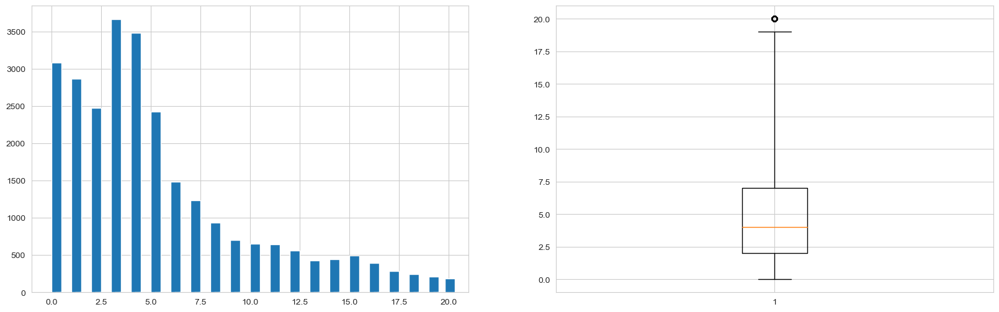

In [158]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["age"], bins=100, width=0.5)

plt.subplot(122)
plt.boxplot(df["age"], whis=2.5)

plt.show()

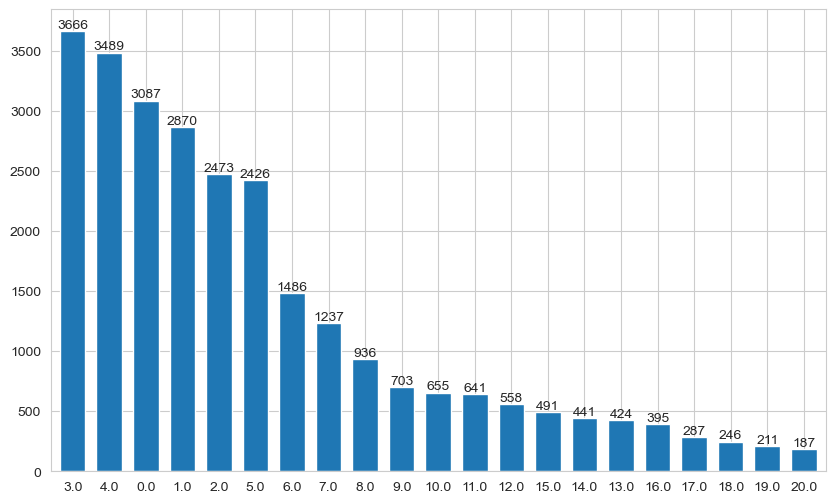

In [159]:
fig, ax = plt.subplots()

df["age"].value_counts(dropna=False).plot.bar(width=0.7)

plt.xticks(rotation=0)

for container in ax.containers:
    ax.bar_label(container);

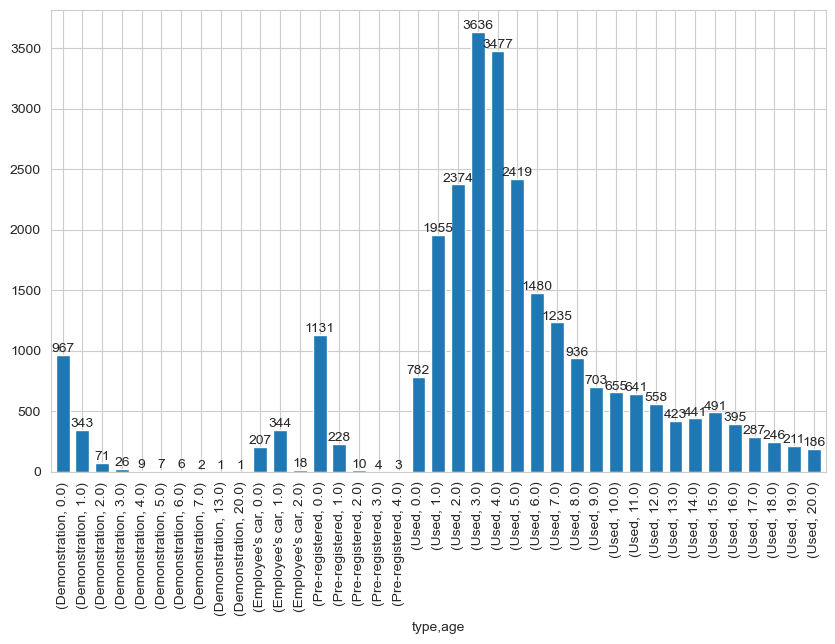

In [160]:
fig, ax = plt.subplots()

df.groupby(["type", "age"])["age"].count().plot.bar(width=0.7)

for container in ax.containers:
    ax.bar_label(container);

## power_kW

In [161]:
first_looking("power_kW")

COLUMN NAME    :  power_kW
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  321
--------------------------------
110.000    1987
96.000     1353
88.000     1181
81.000     1156
66.000     1087
85.000     1000
103.000     987
74.000      891
140.000     753
51.000      703
70.000      685
100.000     672
55.000      507
92.000      464
147.000     428
125.000     397
120.000     366
80.000      339
132.000     330
90.000      311
135.000     311
118.000     247
130.000     245
173.000     241
84.000      228
221.000     221
115.000     216
77.000      213
67.000      211
82.000      206
206.000     205
145.000     204
150.000     204
63.000      187
53.000      184
97.000      180
104.000     163
288.000     155
59.000      146
73.000      137
60.000      132
180.000     129
202.000     129
68.000      129
331.000     124
44.000      123
143.000     123
87.000      123
107.000     122
121.000     122
190.000     119
184.000     118
54.000   

In [162]:
df["power_kW"].describe()

count   26909.000
mean      119.474
std        68.503
min         1.000
25%        80.000
50%       100.000
75%       135.000
max       883.000
Name: power_kW, dtype: float64

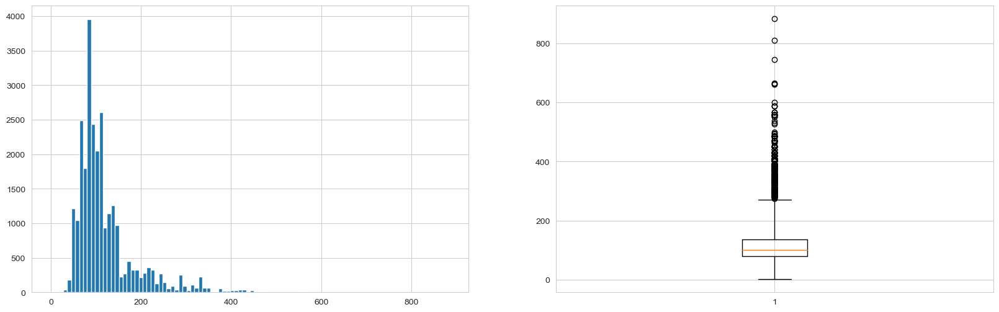

In [163]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
plt.hist(df["power_kW"], bins=100)

plt.subplot(122)
plt.boxplot(df["power_kW"], whis=2.5)

plt.show()

In [164]:
df.sort_values(by=["power_kW"], ascending=False)["power_kW"].head(20)

# df["kW"].sort_values(ascending=False).head(20)

19469   883.000
19499   810.000
19288   746.000
19473   665.000
19584   664.000
21772   662.000
19534   600.000
1076    588.000
1451    588.000
19483   588.000
21569   567.000
21541   567.000
21662   567.000
21818   559.000
21801   559.000
21781   559.000
21780   559.000
21821   559.000
21777   559.000
21794   559.000
Name: power_kW, dtype: float64

In [165]:
# df.sort_values(by=["kW"], ascending=True)["kW"].head(20)

df["power_kW"].sort_values(ascending=True).head(20)

5173     1.000
5430     1.000
22101    3.000
5786     4.000
6205     4.000
5748     4.000
6166     4.000
5936     4.000
24429    6.000
5545     7.000
5919     8.000
5952     8.000
5816     8.000
5140     9.000
5836    12.000
4838    12.000
4886    13.000
16416   18.000
16471   18.000
16405   19.000
Name: power_kW, dtype: float64

In [166]:
df.groupby(["make_model", "body_type", "fuel_type"]).power_kW.describe()

count    mean  \
make_model               body_type        fuel_type                            
Dacia                    Compact          Benzine              3.000  33.000   
                         Station wagon    Benzine              1.000  81.000   
Dacia Break              Station wagon    Benzine              1.000 110.000   
Dacia Dokker             Compact          Diesel               1.000  66.000   
                         Off-Road/Pick-up Benzine              1.000  75.000   
                                          Liquid/Natural Gas   1.000  75.000   
                         Sedan            Diesel               1.000  55.000   
                         Station wagon    Benzine             17.000  82.176   
                                          Diesel              29.000  63.207   
                                          Liquid/Natural Gas   6.000  72.000   
Dacia Duster             Convertible      Liquid/Natural Gas   1.000  84.000   
                         Off-Road/Pick-up Benzine            129.000  91.729   
                                          Diesel             165.000  81.800   
                                          Liquid/Natural Gas  27.000  77.556   
                         Sedan            Benzine              1.000  92.000   
                                          Diesel               2.000  80.000   
                                          Liquid/Natural Gas   1.000  74.000   
                         Station wagon    Benzine              5.000  91.800   
                                          Diesel              17.000  80.412   
                                          Liquid/Natural Gas   1.000  67.000   
Dacia Jogger             Off-Road/Pick-up Liquid/Natural Gas   1.000  74.000   
                         Sedan            Benzine              1.000  81.000   
                         Station wagon    Benzine             79.000  80.911   
                                          Liquid/Natural Gas   5.000  74.000   
Dacia Lodgy              Compact          Diesel               1.000  85.000   
                         Sedan            Diesel               1.000  85.000   
                                          Liquid/Natural Gas   1.000  75.000   
                         Station wagon    Benzine             34.000  83.382   
                                          Diesel              33.000  80.636   
                                          Liquid/Natural Gas   2.000  70.500   
Dacia Logan              Compact          Benzine              8.000  54.875   
                                          Diesel               4.000  63.250   
                                          Liquid/Natural Gas   1.000  66.000   
                         Sedan            Benzine             29.000  55.759   
                                          Diesel               3.000  61.333   
                                          Liquid/Natural Gas   3.000  71.333   
                         Station wagon    Benzine            104.000  62.394   
                                          Diesel              35.000  64.400   
                                          Liquid/Natural Gas  12.000  67.333   
Dacia Sandero            Compact          Benzine            252.000  64.508   
                                          Diesel              77.000  65.636   
                                          Liquid/Natural Gas  11.000  72.636   
                         Convertible      Benzine              1.000  66.000   
                         Coupe            Benzine              2.000  60.500   
                         Off-Road/Pick-up Benzine             41.000  66.634   
                                          Diesel               2.000  62.500   
                                          Liquid/Natural Gas   7.000  73.000   
                         Sedan            Benzine            256.000  64.035   
                                          Diesel              5

In [167]:
df.loc[(df["power_kW"] == 9) | (df["power_kW"] == 12)][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg", "power_kW"]]\
                                 .sort_values(by=["power_kW"], ascending=False)

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight,co_emissions,cons_avg,power_kW
4838,Renault Twizy,10.000,Compact,Automatic,Rear,1.000,1598.000,Electric,473.000,0.000,2.359,12.000
5836,Renault Megane,9.000,Coupe,Manual,Front,6.000,1998.000,Benzine,1387.000,178.000,7.600,12.000
5140,Renault Twizy,0.000,Compact,Automatic,Rear,1.000,1598.000,Electric,562.000,0.000,2.359,9.000


In [168]:
# df.loc[df.make_model == "Renault Twizy"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg", "power_kW"]]
df.loc[df.make_model == "Renault Megane"][["make_model", "age", "body_type", "gearbox", "drivetrain", "gears", "engine_size", "fuel_type", "empty_weight", "co_emissions", "cons_avg", "power_kW"]]

,make_model,age,body_type,gearbox,drivetrain,gears,engine_size,fuel_type,empty_weight,co_emissions,cons_avg,power_kW
4783,Renault Megane,1.000,Compact,Manual,Front,6.000,1332.000,Benzine,1180.000,126.000,5.500,103.000
4786,Renault Megane,1.000,Compact,Automatic,Front,6.000,1798.000,Benzine,1381.000,133.500,0.000,221.000
4789,Renault Megane,4.000,Compact,Automatic,Front,6.000,1500.000,Diesel,1180.000,104.000,3.950,81.000
4791,Renault Megane,7.000,Compact,Manual,Front,6.000,1461.000,Diesel,1215.000,104.000,3.500,81.000
4793,Renault Megane,8.000,Compact,Manual,Front,6.000,1461.000,Diesel,1190.000,90.000,3.400,81.000
4794,Renault Megane,18.000,Compact,Automatic,Front,4.000,1598.000,Benzine,1180.000,184.000,7.700,83.000
4796,Renault Megane,4.000,Compact,Automatic,Front,6.000,1500.000,Diesel,1180.000,104.000,3.950,81.000
4798,Renault Megane,6.000,Compact,Automatic,Rear,7.000,1618.000,Benzine,1467.000,138.000,6.000,151.000
4800,Renault Megane,14.000,Compact,Manual,Front,6.000,1870.000,Diesel,1270.000,104.000,5.400,96.000
4801,Renault Megane,4.000,Compact,Automatic,Front,6.000,1500.000,Diesel,1180.000,104.000,3.950,81.000


### Domain Knowledge on kW of Some Cars:

- Nissan Leaf - 110kW
- Hyundai Kona Electric – 150kW
- Mercedes-Benz EQC - 300kW
- Porsche Taycan Turbo S – 560kW
- Tesla Model S Performance – 595kW

**🧐 [List of production cars by power output](https://en.wikipedia.org/wiki/List_of_production_cars_by_power_output)**

In [169]:
# Get the count of each value
car_kW_counts = df['power_kW'].value_counts()
car_kW_counts

110.000    1987
96.000     1353
88.000     1181
81.000     1156
66.000     1087
85.000     1000
103.000     987
74.000      891
140.000     753
51.000      703
70.000      685
100.000     672
55.000      507
92.000      464
147.000     428
125.000     397
120.000     366
80.000      339
132.000     330
90.000      311
135.000     311
118.000     247
130.000     245
173.000     241
84.000      228
221.000     221
115.000     216
77.000      213
67.000      211
82.000      206
206.000     205
145.000     204
150.000     204
63.000      187
53.000      184
97.000      180
104.000     163
288.000     155
59.000      146
73.000      137
60.000      132
180.000     129
202.000     129
68.000      129
331.000     124
44.000      123
143.000     123
87.000      123
107.000     122
121.000     122
190.000     119
184.000     118
54.000      117
241.000     116
75.000      113
165.000     112
52.000      111
228.000     105
310.000      99
169.000      99
133.000      98
112.000      98
99.000  

In [170]:
car_kW_counts[car_kW_counts < 10]

559.000    9
123.000    9
127.000    9
239.000    9
343.000    8
324.000    8
198.000    8
188.000    8
131.000    8
153.000    8
166.000    8
47.000     8
385.000    8
69.000     8
178.000    7
370.000    7
380.000    7
207.000    7
470.000    7
345.000    7
299.000    7
271.000    6
40.000     6
295.000    6
111.000    6
353.000    6
149.000    6
368.000    6
174.000    6
203.000    6
392.000    6
307.000    6
148.000    5
4.000      5
286.000    5
126.000    5
193.000    5
357.000    5
230.000    5
248.000    5
420.000    4
106.000    4
109.000    4
309.000    4
339.000    4
487.000    4
214.000    4
167.000    4
146.000    4
360.000    4
240.000    4
94.000     4
400.000    4
196.000    4
340.000    4
229.000    3
266.000    3
387.000    3
216.000    3
8.000      3
293.000    3
58.000     3
567.000    3
441.000    3
484.000    3
313.000    3
588.000    3
222.000    2
354.000    2
463.000    2
312.000    2
358.000    2
311.000    2
279.000    2
189.000    2
1.000      2
552.000    2

In [171]:
# run the command %pprint. This turns pretty printing off. The list will now display horizontally.
%pprint

less_freq_kW = car_kW_counts[car_kW_counts < 10].index.to_list()
less_freq_kW

Pretty printing has been turned OFF


[559.0, 123.0, 127.0, 239.0, 343.0, 324.0, 198.0, 188.0, 131.0, 153.0, 166.0, 47.0, 385.0, 69.0, 178.0, 370.0, 380.0, 207.0, 470.0, 345.0, 299.0, 271.0, 40.0, 295.0, 111.0, 353.0, 149.0, 368.0, 174.0, 203.0, 392.0, 307.0, 148.0, 4.0, 286.0, 126.0, 193.0, 357.0, 230.0, 248.0, 420.0, 106.0, 109.0, 309.0, 339.0, 487.0, 214.0, 167.0, 146.0, 360.0, 240.0, 94.0, 400.0, 196.0, 340.0, 229.0, 266.0, 387.0, 216.0, 8.0, 293.0, 58.0, 567.0, 441.0, 484.0, 313.0, 588.0, 222.0, 354.0, 463.0, 312.0, 358.0, 311.0, 279.0, 189.0, 1.0, 552.0, 292.0, 18.0, 244.0, 346.0, 12.0, 209.0, 35.0, 274.0, 124.0, 267.0, 493.0, 372.0, 3.0, 499.0, 46.0, 144.0, 234.0, 365.0, 316.0, 255.0, 6.0, 341.0, 485.0, 39.0, 551.0, 662.0, 530.0, 328.0, 332.0, 41.0, 303.0, 32.0, 236.0, 242.0, 254.0, 13.0, 384.0, 373.0, 19.0, 34.0, 342.0, 45.0, 217.0, 24.0, 409.0, 7.0, 537.0, 31.0, 284.0, 179.0, 89.0, 471.0, 403.0, 527.0, 237.0, 325.0, 378.0, 183.0, 496.0, 664.0, 600.0, 478.0, 810.0, 665.0, 883.0, 246.0, 9.0, 746.0]

In [172]:
# If you wish them drop from dataset, use the following code:

# # Select the values where the count is less than 10 (or whatever you desire)
# drop_kW_index = car_kW_counts[car_kW_counts < 10].index

# df.drop(drop_kW_index, axis=0, inplace=True)

# OR

# # Keep rows where the kW column is not in to_remove
# # df = df[~df.kW.isin(drop_kW_index)]

**Let us assign the values of observations whose frequencies are less than 10 to NaN:** 

In [173]:
df["power_kW"].replace(less_freq_kW, np.nan, inplace=True)

In [174]:
df["power_kW"].isnull().sum()

464

In [175]:
fill(df, "make_model", "body_type", "power_kW", "median")

COLUMN NAME    :  power_kW
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  186
--------------------------------
110.000    2005
96.000     1369
88.000     1185
81.000     1157
66.000     1094
85.000     1001
103.000     990
74.000      900
140.000     756
100.000     716
51.000      706
70.000      689
55.000      508
92.000      467
147.000     434
125.000     404
120.000     366
80.000      340
132.000     340
90.000      312
135.000     311
173.000     268
130.000     251
118.000     248
84.000      229
221.000     221
206.000     217
115.000     217
67.000      216
145.000     215
77.000      213
150.000     207
82.000      206
63.000      187
53.000      185
97.000      182
331.000     177
104.000     163
59.000      157
288.000     155
73.000      137
310.000     132
60.000      132
68.000      130
180.000     129
202.000     129
121.000     124
143.000     123
87.000      123
107.000     123
44.000      123
241.000     121
54.000   

In [176]:
df.shape

(26909, 29)

## Final_Step

In [177]:
df.head(3).T

,0,1,2
make_model,Mercedes-Benz A 160,Mercedes-Benz EQE 350,Mercedes-Benz A 45 AMG
make,Mercedes-Benz,Mercedes-Benz,Mercedes-Benz
location,"P.I. EL PALMAR C/FORJA 6, 11500 PUERTO DE SAN...","APARTADO DE CORREOS 1032, 26140 LOGROÑO, ES","PORT. TARRACO, MOLL DE LLEVANT, Nº 5, LOC. 6-8..."
price,16950.000,80900.000,69900.000
body_type,Compact,Compact,Compact
type,Used,Pre-registered,Used
warranty,Yes,Yes,Yes
mileage,120200.000,5000.000,18900.000
gearbox,Manual,Automatic,Automatic
fuel_type,Diesel,Electric,Benzine


In [178]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26909 entries, 0 to 28629
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   make_model               26909 non-null  object 
 1   make                     26909 non-null  object 
 2   location                 26909 non-null  object 
 3   price                    26909 non-null  float64
 4   body_type                26909 non-null  object 
 5   type                     26909 non-null  object 
 6   warranty                 26909 non-null  object 
 7   mileage                  26909 non-null  float64
 8   gearbox                  26909 non-null  object 
 9   fuel_type                26909 non-null  object 
 10  seller                   26909 non-null  object 
 11  engine_size              26909 non-null  float64
 12  gears                    26909 non-null  float64
 13  co_emissions             26909 non-null  float64
 14  drivetrain            

In [179]:
numeric_col.head()

,price,doors,mileage,seats,engine_size,gears,co_emissions,empty_weight,previous_owner,age,power_kW,cons_avg
0,16950.000,5.000,120200.000,5.000,1595.000,5.000,98.000,1270.000,2.000,6.000,75.000,3.800
1,80900.000,4.000,5000.000,5.000,1.000,9.000,0.000,2355.000,1.000,0.000,215.000,2.359
2,69900.000,5.000,18900.000,5.000,1991.000,8.000,162.000,1555.000,2.000,2.000,310.000,8.400
3,46990.000,5.000,18995.000,5.000,1991.000,7.000,169.000,1455.000,2.000,2.000,225.000,7.300
4,16800.000,5.000,197000.000,5.000,2143.000,7.000,162.000,1545.000,2.000,7.000,100.000,4.900


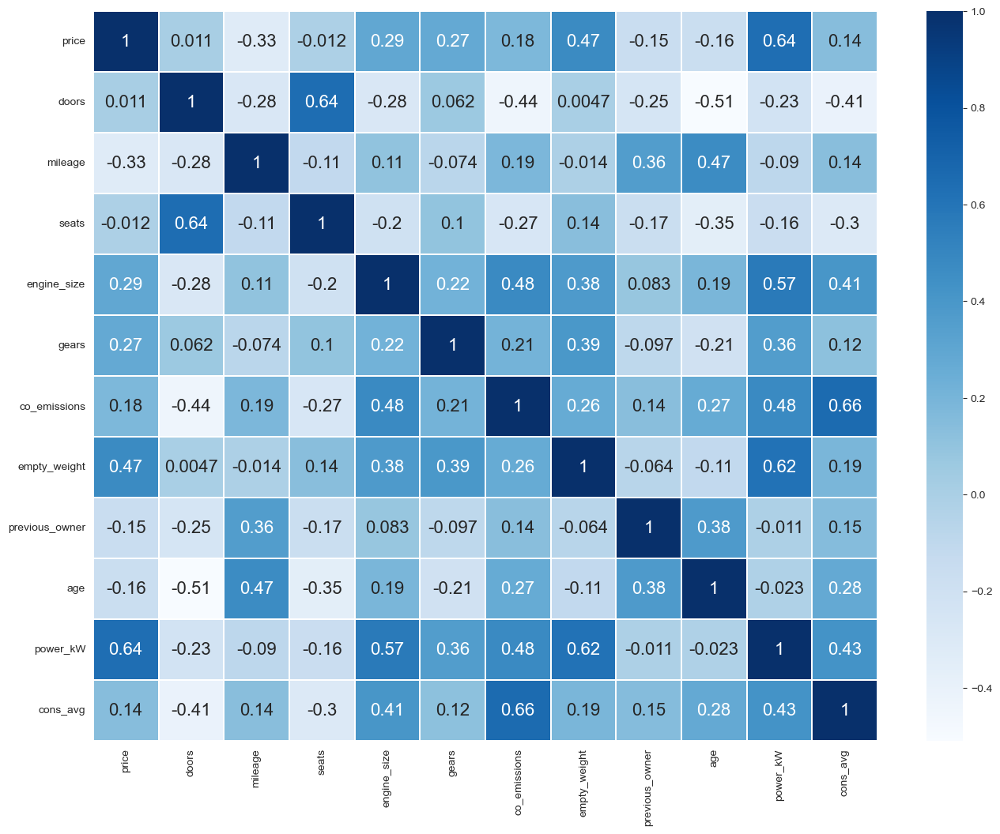

In [180]:
plt.figure(figsize=(16, 12))

sns.heatmap(numeric_col.corr(), annot=True, cmap="Blues", linewidths=0.2, annot_kws={"size": 16});

In [181]:
# function for set text color of correlation values in Dataframes

def color_correlation(val):
    """
    Takes a scalar and returns a string with
    the css property in a variety of color scales 
    for different correlations.
    """
    if val >= 0.6 and val < 0.99999 or val <= -0.6 and val > -0.99999:
        color = 'red'
    elif val < 0.6 and val >= 0.3 or val > -0.6 and val <= -0.3:
        color = 'blue'
    elif val == 1:
        color = 'cyan'    
    else:
        color = 'black'
    return 'color: %s' % color
 
numeric_col.corr().style.applymap(color_correlation)

,price,doors,mileage,seats,engine_size,gears,co_emissions,empty_weight,previous_owner,age,power_kW,cons_avg
price,1.000000,0.010924,-0.326521,-0.012043,0.288914,0.274832,0.177149,0.469819,-0.153524,-0.163697,0.637681,0.141557
doors,0.010924,1.000000,-0.275260,0.641343,-0.278144,0.062424,-0.437697,0.004659,-0.246056,-0.509599,-0.226294,-0.409312
mileage,-0.326521,-0.275260,1.000000,-0.112290,0.107828,-0.073832,0.185879,-0.014000,0.359346,0.468608,-0.090270,0.138096
seats,-0.012043,0.641343,-0.112290,1.000000,-0.197151,0.102901,-0.267478,0.135834,-0.166477,-0.352069,-0.160814,-0.297741
engine_size,0.288914,-0.278144,0.107828,-0.197151,1.000000,0.216216,0.480966,0.375618,0.082693,0.187713,0.574683,0.406609
gears,0.274832,0.062424,-0.073832,0.102901,0.216216,1.000000,0.214430,0.393709,-0.096695,-0.208434,0.360962,0.120434
co_emissions,0.177149,-0.437697,0.185879,-0.267478,0.480966,0.214430,1.000000,0.264183,0.135857,0.266228,0.476388,0.656617
empty_weight,0.469819,0.004659,-0.014000,0.135834,0.375618,0.393709,0.264183,1.000000,-0.063775,-0.110257,0.616131,0.187495
previous_owner,-0.153524,-0.246056,0.359346,-0.166477,0.082693,-0.096695,0.135857,-0.063775,1.000000,0.379135,-0.011411,0.147947
age,-0.163697,-0.509599,0.468608,-0.352069,0.187713,-0.208434,0.266228,-0.110257,0.379135,1.000000,-0.023097,0.277526


### The Examination of Multicolineraty

If there is a strong correlation between the independent variables, this situation is called **multicolineraty**.
 
**Multicolineraty** prevents my model from detecting important features.

The problem of multicollinearity can be overcome by several different methods. However, each method has its own cons and prons. To get the best trade off in terms of cons and pros, you need domain knowledge and a good understanding of the problem at hand.

To overcome multicollinearity;

- Remove some of the highly correlated independent variables,

- Linearly combine the independent variables, such as adding them together,

- Perform an analysis designed for highly correlated variables, such as principal components analysis or partial least squares regression.

- Use regularization models like Lasso and Ridge.

Depending on the situation, it may not be a problem for your model if only slight or moderate collinearity issue occurs. However, it is strongly advised to solve the issue if severe collinearity issue exists(e.g. correlation >0.8 between 2 variables or Variance inflation factor(VIF) >20 )

**🧐 [Multi-Collinearity in Regression](https://towardsdatascience.com/multi-collinearity-in-regression-fe7a2c1467ea)**

In [182]:
from termcolor import cprint

def multicolinearity_control(df):                    
    df_temp = df.corr()
    count = 'Done'
    feature =[]
    collinear= []
    for col in df_temp.columns:
        for i in df_temp.index:
            if abs(df_temp[col][i] > .6 and df_temp[col][i] < 1):
                    feature.append(col)
                    collinear.append(i)
                    cprint(f"Multicolinearity alert in between --> {col} - {i} --> {round(df_temp[col][i], 6)}", "red", attrs=["bold"])
    else:
#         cprint(f"There is NO multicollinearity problem.", "blue", attrs=["bold"])
        pass

In [183]:
multicolinearity_control(numeric_col)

Multicolinearity alert in between --> price - power_kW --> 0.637681
Multicolinearity alert in between --> doors - seats --> 0.641343
Multicolinearity alert in between --> seats - doors --> 0.641343
Multicolinearity alert in between --> co_emissions - cons_avg --> 0.656617
Multicolinearity alert in between --> empty_weight - power_kW --> 0.616131
Multicolinearity alert in between --> power_kW - price --> 0.637681
Multicolinearity alert in between --> power_kW - empty_weight --> 0.616131
Multicolinearity alert in between --> cons_avg - co_emissions --> 0.656617


In [184]:
target = 'price'

corr_by_target = df.corr()[target].sort_values()
corr_by_target

age              -0.406
mileage          -0.397
previous_owner   -0.191
co_emissions      0.216
gears             0.219
cons_avg          0.225
engine_size       0.436
empty_weight      0.581
power_kW          0.710
price             1.000
Name: price, dtype: float64

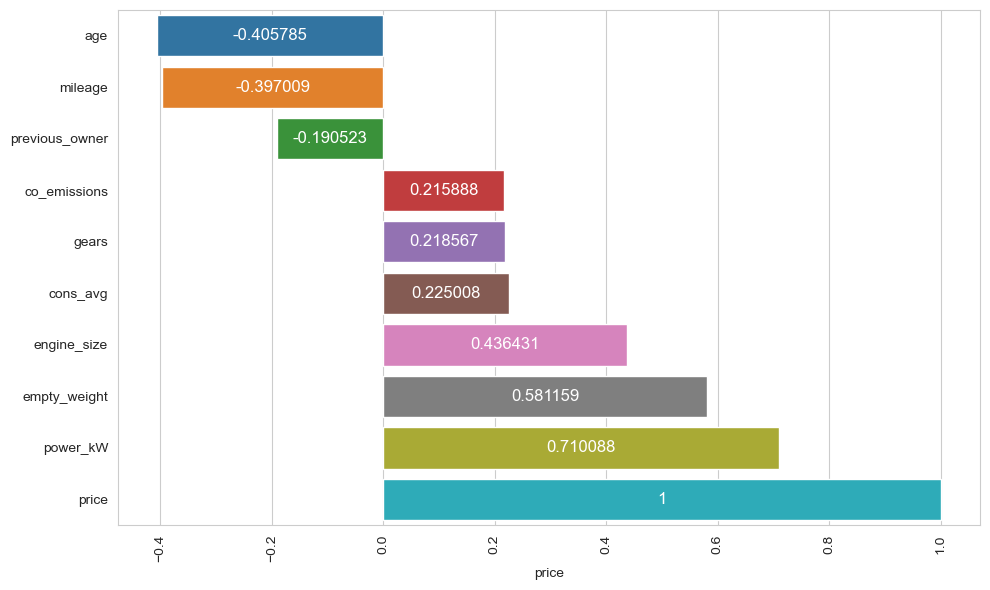

In [185]:
ax = sns.barplot(y = corr_by_target.index, x = corr_by_target)
plt.xticks(rotation=90)
plt.tight_layout()

for container in ax.containers:
    ax.bar_label(container, fontsize=12, rotation=0, label_type='center', color="white")

In [186]:
# def check_dist(numeric_col, var):
#     plt.figure(figsize=(15,6))
#     plt.subplot(1, 2, 1)
#     sns.histplot(x=var, data=numeric_col)
#     plt.subplot(1, 2, 2)
#     stats.probplot(numeric_col[var], dist="norm", plot=plt)
#     plt.show()

In [187]:
# for col in numeric_col.drop("price", axis=1).columns:
#     check_dist(numeric_col, col)

In [188]:
# sns.pairplot(df_num, size=2.5);

In [189]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26909 entries, 0 to 28629
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   make_model               26909 non-null  object 
 1   make                     26909 non-null  object 
 2   location                 26909 non-null  object 
 3   price                    26909 non-null  float64
 4   body_type                26909 non-null  object 
 5   type                     26909 non-null  object 
 6   warranty                 26909 non-null  object 
 7   mileage                  26909 non-null  float64
 8   gearbox                  26909 non-null  object 
 9   fuel_type                26909 non-null  object 
 10  seller                   26909 non-null  object 
 11  engine_size              26909 non-null  float64
 12  gears                    26909 non-null  float64
 13  co_emissions             26909 non-null  float64
 14  drivetrain            

In [190]:
df.duplicated(keep=False).sum()

3548

In [191]:
print(df.shape)
df.drop_duplicates(inplace=True)
print(df.shape)

(26909, 29)
(25070, 29)


### ⚠️ Should we remove duplicates from a dataset❓


There has been a hot debate on this issue: While some people claim that "Yes. You ALWAYS remove duplicate values, regardless of the model used. The cleaner the data, the better the results." and others mention that "No. The duplicates indicate frequency which is important, especially in Bayesian based methods. Ordinates that are more frequent in the training data should be more likely to come up in testing". On the other haand, some are inclined to the situation stating that "It...depends. Mostly it depends on what your goals are and what your dataset looks like" or "Like all things it depends on the end goal. In fact, sometimes we put in duplicates!"

Our approach is that: Yes and No according to the results models (metrics, such as RMSE or R2, accuracy scores etc.).

 - Removing duplicates is recommended if you find out they are just–duplicated records. This is because duplicates can add the weights of samples and can cause bias. They can also make training longer as they’d increase data size.

 - No, because the duplicates could be the actual nature of the dataset. Also, some datasets can have oversampled samples intentionally. So it's important first to figure that out.
 
**🧐 [Should we remove duplicates from a data-set while training a Machine Learning algorithm (shallow and/or deep methods)?](https://www.quora.com/Should-we-remove-duplicates-from-a-data-set-while-training-a-Machine-Learning-algorithm-shallow-and-or-deep-methods)**

**🧐 [Should I remove duplicates from a data set in machine learning?](https://www.quora.com/Should-I-remove-duplicates-from-a-data-set-in-machine-learning)**

**Summary:**

Keeping duplicate features in your dataset introduces the problem of multicollinearity.
 - In the case of linear models, weights distribution between the two features will be problematic.
 - If you are using tree-based modes, it won’t matter unless you are looking at feature importance.
 - In the case of distance-based models, it will make that feature count more in the distance.

**🧐 [2 Types of Duplicate Features in Machine Learning](https://towardsdatascience.com/2-types-of-duplicate-features-in-machine-learning-2931de6c949b)**

<img src=https://i.ibb.co/KFV30q0/models-with-duplicates.png width="900" height="100"><br>
## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:#060108; font-size:150%; text-align:center; border-radius:10px 10px;">Models with Duplicates</p>
<img src=https://i.ibb.co/024brch/models-without-duplicates.png width="900" height="100"><br>
## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:#060108; font-size:150%; text-align:center; border-radius:10px 10px;">Models without Duplicates</p>

**When the results above are evaluated it looks like continuing without duplicates would be more suitable for further analysis**

## <p style="background-color:#9d4f8c; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">Some Specific Questions on Analysis</p>

<a id="3"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

### 1. What is the`` average`` ``Mileage`` of the vehicles according to their ``body types``?

In [192]:
# Average mileage of Vehicles by body_type

avg_mileage = df.groupby(["make_model", "body_type"]).mileage.mean()
avg_mileage

make_model                body_type       
Dacia                     Compact               865.333
                          Station wagon        2000.000
Dacia Break               Station wagon         999.000
Dacia Dokker              Compact            141100.000
                          Off-Road/Pick-up   100000.000
                          Sedan              149000.000
                          Station wagon       74782.846
Dacia Duster              Convertible         18783.000
                          Off-Road/Pick-up    53132.766
                          Sedan               58823.250
                          Station wagon       69168.143
Dacia Jogger              Off-Road/Pick-up       10.000
                          Sedan                   8.000
                          Station wagon        1194.852
Dacia Lodgy               Compact             84140.000
                          Sedan               53030.500
                          Station wagon       83650.261
Dacia

In [193]:
# Average mileage of body_type

avg_mileage_body = df.groupby("body_type").mileage.mean()
avg_mileage_body

body_type
Compact            67843.959
Convertible        96148.019
Coupe              87175.594
Off-Road/Pick-up   50302.722
Sedan              51683.574
Station wagon      73880.107
Name: mileage, dtype: float64

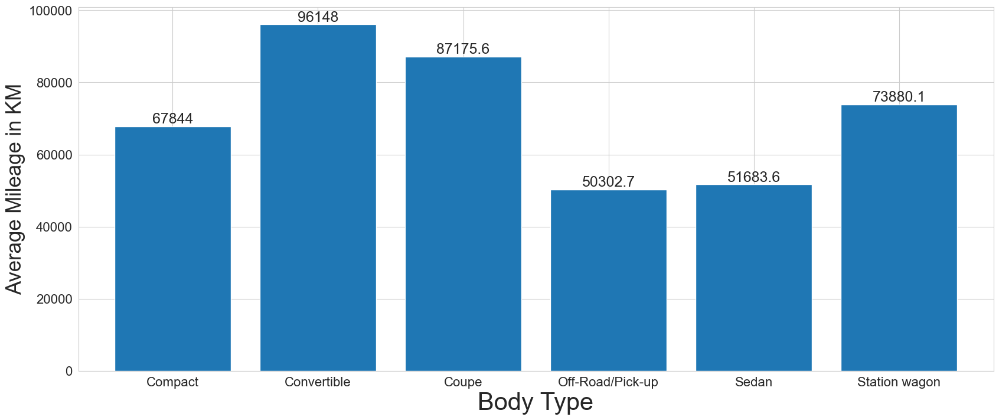

In [194]:
ax = avg_mileage_body.plot.bar(figsize=(20, 8), fontsize=16, width=0.8, rot=0)

for container in ax.containers:
    ax.bar_label(container, fontsize=18, rotation=0)
    
ax.set_xlabel('Body Type', fontsize=30)
ax.set_ylabel('Average Mileage in KM', fontsize=25);
# plt.legend(title="body_type", title_fontsize=14, prop={'size': 14}, bbox_to_anchor=(0.72, 0.9));

### 2. What is the ``average`` ``price`` of the vehicles according to the ``gearbox`` they have?

In [195]:
# Average Price of Vehicles by gearbox and make_model

avg_price1 = df.groupby(["make_model", "gearbox"]).price.mean()
avg_price1

make_model                gearbox       
Dacia                     Automatic         21431.000
                          Manual            21799.000
Dacia Break               Manual            20500.000
Dacia Dokker              Manual            13209.000
Dacia Duster              Automatic         18861.200
                          Manual            16429.059
Dacia Jogger              Manual            23215.828
Dacia Lodgy               Manual            13068.583
Dacia Logan               Automatic         11258.900
                          Manual             8932.211
                          Semi-automatic     8000.000
Dacia Sandero             Automatic         16586.121
                          Manual            11688.832
Dacia Spring              Automatic         21986.455
                          Manual            27044.000
Fiat                      Automatic         25288.000
                          Manual            16965.800
Fiat 124 Spider           Automatic      

In [196]:
# Average Price of body_type

avg_price_body = df.groupby("body_type").price.mean().sort_values(ascending=False)
avg_price_body

body_type
Coupe              30359.028
Off-Road/Pick-up   29424.147
Sedan              22670.445
Station wagon      22249.663
Convertible        21122.606
Compact            15993.079
Name: price, dtype: float64

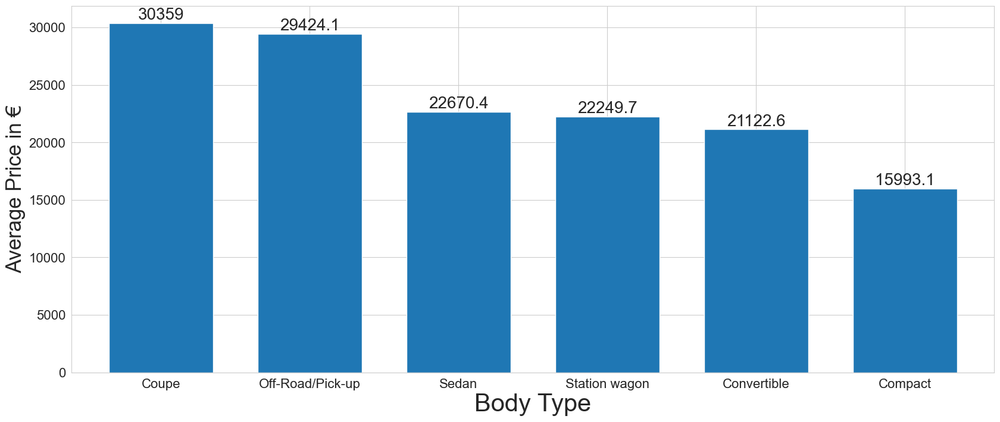

In [197]:
ax = avg_price_body.plot.bar(figsize=(20, 8), fontsize=16, width=0.7, rot=0)

for container in ax.containers:
    ax.bar_label(container, fontsize=20, rotation=0)
    
ax.set_xlabel('Body Type', fontsize=30)
ax.set_ylabel('Average Price in €', fontsize=25);
# plt.legend(title="body_type", title_fontsize=14, prop={'size': 14}, bbox_to_anchor=(0.23, 0.92));

In [198]:
# Average Price of make

avg_price_make = df.groupby("make").price.mean().sort_values(ascending=False)
avg_price_make

make
Mercedes-Benz   52409.722
Ford            30089.800
Volvo           27203.222
Skoda           23440.236
Toyota          22860.635
Nissan          21326.728
Hyundai         19700.102
SEAT            19341.164
Opel            17545.677
Renault         17041.355
Peugeot         16814.243
Fiat            15723.964
Dacia           13336.349
Name: price, dtype: float64

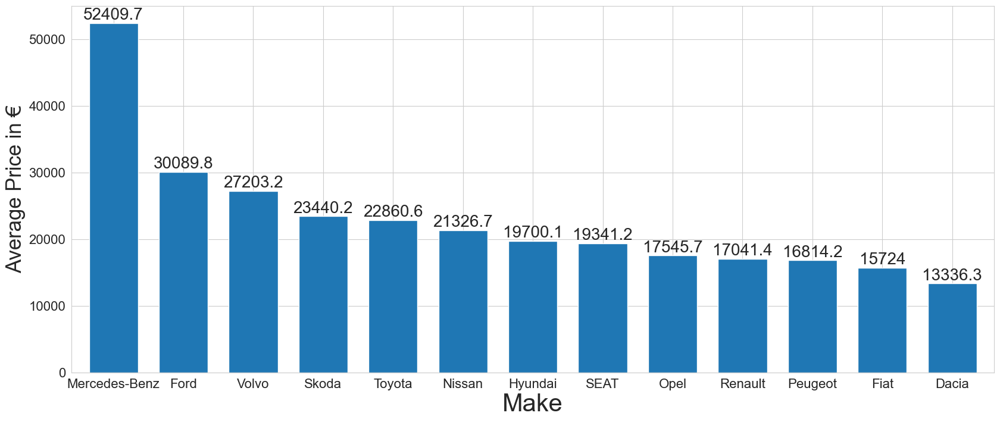

In [199]:
ax = avg_price_make.plot.bar(figsize=(20, 8), fontsize=16, width=0.7, rot=0)

for container in ax.containers:
    ax.bar_label(container, fontsize=20, rotation=0)
    
ax.set_xlabel('Make', fontsize=30)
ax.set_ylabel('Average Price in €', fontsize=25);

### 3. What is the ``average`` ``price`` of the vehicles according to the ``fuel types`` they use?

In [200]:
# Average Price of Vehicles by fuel_type & make_model

avg_price2 = df.groupby(["make_model", "fuel_type"]).price.mean()
avg_price2

make_model                fuel_type         
Dacia                     Benzine               21523.000
Dacia Break               Benzine               20500.000
Dacia Dokker              Benzine               14114.667
                          Diesel                12864.516
                          Liquid/Natural Gas    12405.714
Dacia Duster              Benzine               17169.985
                          Diesel                16015.642
                          Liquid/Natural Gas    17234.586
Dacia Jogger              Benzine               23393.435
                          Liquid/Natural Gas    22535.000
Dacia Lodgy               Benzine               13380.588
                          Diesel                12888.543
                          Liquid/Natural Gas    11633.000
Dacia Logan               Benzine                9064.601
                          Diesel                 8219.476
                          Liquid/Natural Gas    11057.188
Dacia Sandero             B

In [201]:
# Average Price of fuel_type by body_type

avg_price_fuel_type1 = df.groupby(["body_type", "fuel_type"]).price.mean().sort_values(ascending=False)
avg_price_fuel_type1

body_type         fuel_type         
Off-Road/Pick-up  Electric             56601.366
Station wagon     Electric             50525.235
Sedan             Electric             45247.361
Coupe             Benzine              32942.687
Off-Road/Pick-up  Benzine              29880.584
Convertible       Electric             29242.235
Off-Road/Pick-up  Diesel               28200.557
Compact           Electric             25375.550
Coupe             Electric             23225.538
Station wagon     Benzine              23152.090
Convertible       Benzine              22697.609
Sedan             Benzine              22474.592
Station wagon     Diesel               21487.590
Sedan             Diesel               21166.104
Coupe             Diesel               18273.951
Off-Road/Pick-up  Liquid/Natural Gas   17739.986
Sedan             Liquid/Natural Gas   16306.568
Compact           Benzine              16191.149
                  Diesel               14437.004
Station wagon     Liquid/Natural

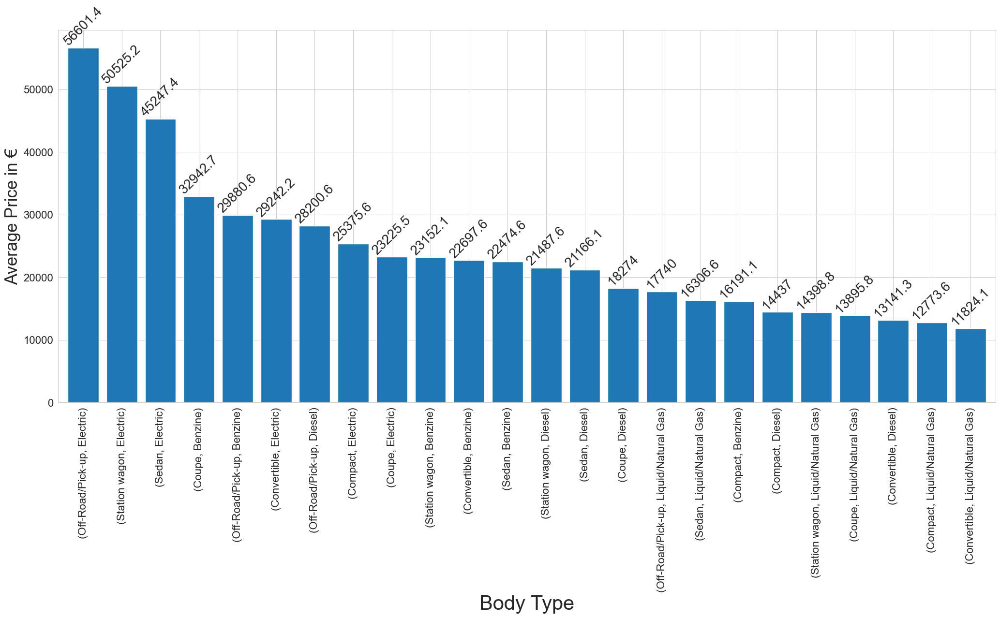

In [202]:
ax = avg_price_fuel_type1.plot.bar(figsize=(25, 10), fontsize=16, width=0.8, rot=90)

for container in ax.containers:
    ax.bar_label(container, fontsize=20, rotation=45)
    
ax.set_xlabel('Body Type', fontsize=30)
ax.set_ylabel('Average Price in €', fontsize=25);
# plt.legend(title="fuel_type", title_fontsize=16, prop={'size': 16}, loc='best');

In [203]:
# Average Price of fuel_type by make

avg_price_fuel_type2 = df.groupby(["make", "fuel_type"]).price.mean().sort_values(ascending=False)
avg_price_fuel_type2

make           fuel_type         
Mercedes-Benz  Electric             100173.354
Ford           Electric              62985.652
Skoda          Electric              59448.438
Mercedes-Benz  Benzine               58950.723
Volvo          Electric              58150.000
Toyota         Electric              45599.800
Mercedes-Benz  Diesel                38822.481
Toyota         Liquid/Natural Gas    34738.900
Hyundai        Electric              33213.333
Ford           Benzine               31159.587
               Liquid/Natural Gas    30630.000
Volvo          Benzine               29852.469
Peugeot        Electric              29648.562
Fiat           Electric              28934.522
Opel           Electric              26750.000
Volvo          Diesel                25673.118
Toyota         Diesel                25224.856
Ford           Diesel                25065.556
Skoda          Diesel                24644.484
Nissan         Benzine               23910.912
               Electric   

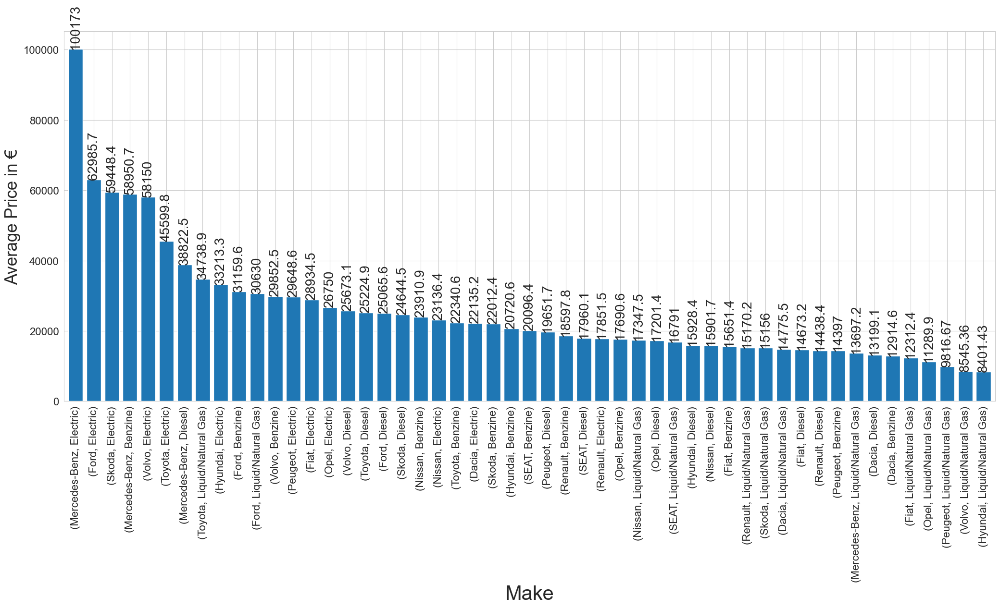

In [204]:
ax = avg_price_fuel_type2.plot.bar(figsize=(25, 10), fontsize=16, width=0.8, rot=90)

for container in ax.containers:
    ax.bar_label(container, fontsize=20, rotation=90)
    
ax.set_xlabel('Make', fontsize=30)
ax.set_ylabel('Average Price in €', fontsize=25);
# plt.legend(title="fuel_type", title_fontsize=16, prop={'size': 16}, loc='best');

### 4. Which ``make & model`` has the ``highest`` number of vehicles for sale?

In [205]:
df["make_model"].value_counts().nlargest(1)

Renault Megane    825
Name: make_model, dtype: int64

In [206]:
num_sale = df["make_model"].value_counts()
num_sale_df = pd.DataFrame(num_sale).rename(columns={"make_model": "No of Sales"})
num_sale_df

,No of Sales
Renault Megane,825
SEAT Leon,756
Dacia Sandero,721
Hyundai i30,699
Opel Astra,634
Ford Mustang,572
Peugeot 308,536
Nissan Qashqai,484
Ford Focus,483
SEAT Ibiza,432


In [207]:
# Let us test the PARETO RULE which you have learned in your training

num_sale /= num_sale.sum()/100
category_classes = pd.qcut(num_sale, q=[0, .20, 0.80, 1.], 
                 labels=['Bottom 20%', 'Mid 60%', 'Top 20%'])
prob_groups = num_sale.groupby(category_classes).sum().sort_values(ascending=False)

display(prob_groups)
display(category_classes)

make_model
Top 20%      82.381
Mid 60%      16.909
Bottom 20%    0.710
Name: make_model, dtype: float64

Renault Megane                 Top 20%
SEAT Leon                      Top 20%
Dacia Sandero                  Top 20%
Hyundai i30                    Top 20%
Opel Astra                     Top 20%
Ford Mustang                   Top 20%
Peugeot 308                    Top 20%
Nissan Qashqai                 Top 20%
Ford Focus                     Top 20%
SEAT Ibiza                     Top 20%
Volvo V40                      Top 20%
Fiat Tipo                      Top 20%
Fiat 500                       Top 20%
Renault Clio                   Top 20%
Ford Fiesta                    Top 20%
Nissan Micra                   Top 20%
Fiat 500X                      Top 20%
Skoda Octavia                  Top 20%
Opel Corsa                     Top 20%
Dacia Duster                   Top 20%
Toyota Yaris                   Top 20%
Opel Insignia                  Top 20%
Volvo C70                      Top 20%
Peugeot 208                    Top 20%
Skoda Fabia                    Top 20%
Fiat 500C                

In [208]:
PARETO_category = pd.DataFrame(category_classes).rename(columns={0: "PARETO_category"})
PARETO_Rule = pd.merge(num_sale_df, PARETO_category, left_index=True, right_index=True).reset_index()\
                                            .rename(columns={"index": "make_model", "make_model": "Pareto_category"})

PARETO_Rule

# top20 = pd.DataFrame(category_classes[category_classes == "Top 20%"]).rename(columns={0: "Top 20%"})
# top20

,make_model,No of Sales,Pareto_category
0,Renault Megane,825,Top 20%
1,SEAT Leon,756,Top 20%
2,Dacia Sandero,721,Top 20%
3,Hyundai i30,699,Top 20%
4,Opel Astra,634,Top 20%
5,Ford Mustang,572,Top 20%
6,Peugeot 308,536,Top 20%
7,Nissan Qashqai,484,Top 20%
8,Ford Focus,483,Top 20%
9,SEAT Ibiza,432,Top 20%


In [209]:
top20 = PARETO_Rule[PARETO_Rule["Pareto_category"] == "Top 20%"]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100
make_model,Renault Megane,SEAT Leon,Dacia Sandero,Hyundai i30,Opel Astra,Ford Mustang,Peugeot 308,Nissan Qashqai,Ford Focus,SEAT Ibiza,Volvo V40,Fiat Tipo,Fiat 500,Renault Clio,Ford Fiesta,Nissan Micra,Fiat 500X,Skoda Octavia,Opel Corsa,Dacia Duster,Toyota Yaris,Opel Insignia,Volvo C70,Peugeot 208,Skoda Fabia,Fiat 500C,Toyota Auris,Peugeot RCZ,Hyundai TUCSON,Peugeot 3008,Ford Kuga,Dacia Logan,Peugeot 508,Volvo XC60,Toyota Corolla,Skoda Superb,Skoda Scala,SEAT Ateca,SEAT Arona,Hyundai i20,Renault Captur,Volvo V60,Ford Mondeo,Nissan 370Z,Skoda Kodiaq,Toyota C-HR,Peugeot 207,Peugeot 2008,Skoda Karoq,Renault Talisman,Opel Grandland X,Renault Kadjar,Peugeot 206,Opel Cascada,Toyota Aygo,Volvo S60,Mercedes-Benz A 180,Nissan X-Trail,Volvo C30,Nissan 350Z,Opel Adam,Fiat Panda,Volvo XC90,Nissan Pulsar,Volvo S90,Toyota RAV 4,Volvo V90,Volvo XC40,Hyundai IONIQ,Opel,Nissan Juke,Hyundai i10,Peugeot 307,Fiat 124 Spider,Renault Twingo,Opel Crossland X,Fiat 500L,Renault Laguna,Renault ZOE,Mercedes-Benz A 200,Skoda Kamiq,Mercedes-Benz C 200,Toyota GT86,Mercedes-Benz C 220,Hyundai i40,Toyota Land Cruiser,Nissan GT-R,Hyundai KONA,Peugeot 5008,Peugeot 407,Toyota Avensis,Opel Mokka,Skoda Rapid/Spaceback,Dacia Lodgy,Mercedes-Benz A 45 AMG,Mercedes-Benz AMG GT,Peugeot 108,Renault Arkana,Toyota Supra,Nissan Leaf,Mercedes-Benz E 220
No of Sales,825,756,721,699,634,572,536,484,483,432,430,415,408,403,391,380,373,359,356,342,322,288,281,261,246,237,231,220,216,215,207,196,194,193,190,189,188,181,166,163,156,155,154,153,146,144,143,143,142,137,137,128,126,125,124,123,123,122,121,121,114,111,111,110,110,107,105,105,103,101,101,96,94,92,91,89,89,88,88,86,85,84,84,83,82,80,79,78,78,78,77,73,72,72,71,68,67,62,61,61,61
Pareto_category,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%,Top 20%


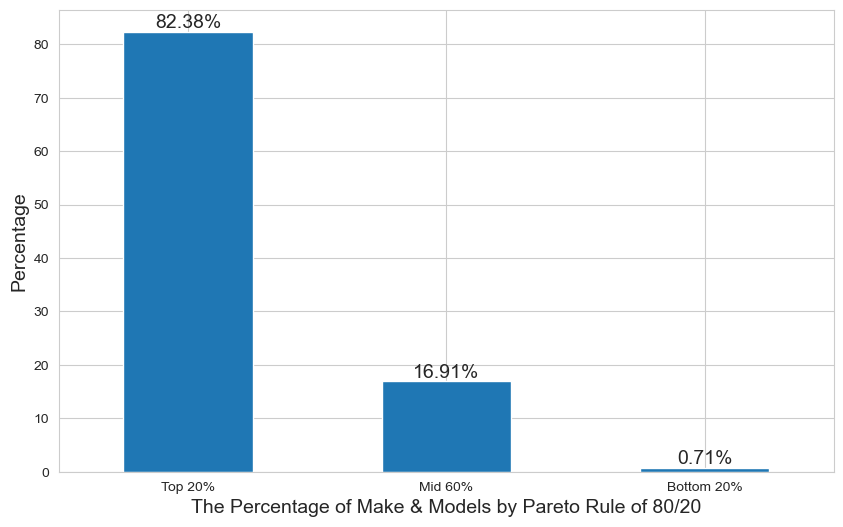

In [210]:
ax = prob_groups.plot(kind='bar')

display(top20.T)

for container in ax.containers:
    ax.bar_label(container, fontsize=14, rotation=0, fmt='%.2f%%')
    
ax.set_xlabel('The Percentage of Make & Models by Pareto Rule of 80/20', fontsize=14)
ax.set_ylabel('Percentage', fontsize=14)

plt.xticks(rotation=0)
plt.show()

### 5. Which vehicle ``make & models`` has the ``lowest`` ``average`` ``fuel consumption`` ``by body_type`` and What are their ``fuel_types``?

In [211]:
# Minimum Fuel Consumption of Vehicles by body_type & make_model

cons_avg = df.groupby(["make_model", "body_type", "fuel_type"]).cons_avg.min()
cons_avg

make_model                body_type         fuel_type         
Dacia                     Compact           Benzine               5.600
                          Station wagon     Benzine               5.600
Dacia Break               Station wagon     Benzine               5.300
Dacia Dokker              Compact           Diesel                4.200
                          Off-Road/Pick-up  Benzine               6.300
                                            Liquid/Natural Gas    6.300
                          Sedan             Diesel                4.500
                          Station wagon     Benzine               5.700
                                            Diesel                4.100
                                            Liquid/Natural Gas    5.700
Dacia Duster              Convertible       Liquid/Natural Gas    0.000
                          Off-Road/Pick-up  Benzine               0.000
                                            Diesel                0.000
 

In [212]:
# Average Price by make & fuel_type

avg_price_fuel_type = df.groupby(["make", "fuel_type"]).price.mean().sort_values(ascending=False)
avg_price_fuel_type

make           fuel_type         
Mercedes-Benz  Electric             100173.354
Ford           Electric              62985.652
Skoda          Electric              59448.438
Mercedes-Benz  Benzine               58950.723
Volvo          Electric              58150.000
Toyota         Electric              45599.800
Mercedes-Benz  Diesel                38822.481
Toyota         Liquid/Natural Gas    34738.900
Hyundai        Electric              33213.333
Ford           Benzine               31159.587
               Liquid/Natural Gas    30630.000
Volvo          Benzine               29852.469
Peugeot        Electric              29648.562
Fiat           Electric              28934.522
Opel           Electric              26750.000
Volvo          Diesel                25673.118
Toyota         Diesel                25224.856
Ford           Diesel                25065.556
Skoda          Diesel                24644.484
Nissan         Benzine               23910.912
               Electric   

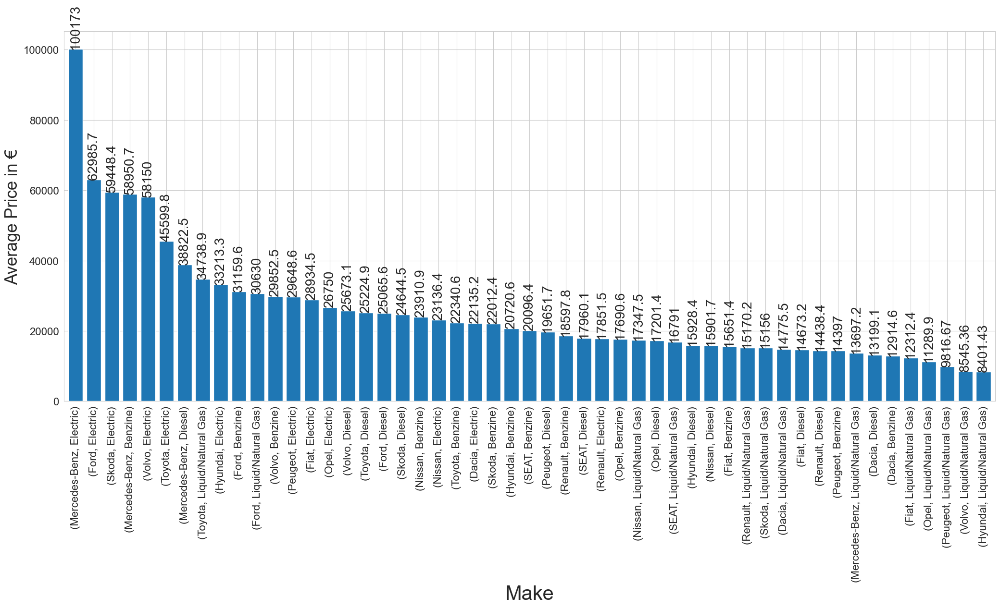

In [213]:
ax = avg_price_fuel_type.plot.bar(figsize=(25, 10), fontsize=16, width=0.8, rot=90)

for container in ax.containers:
    ax.bar_label(container, fontsize=20, rotation=90)
    
ax.set_xlabel('Make', fontsize=30);
ax.set_ylabel('Average Price in €', fontsize=25);

In [214]:
# Average fuel_consumption by make & fuel_type

avg_fuel_cons = df.groupby(["make", "fuel_type"]).cons_avg.mean().sort_values(ascending=True)
avg_fuel_cons

make           fuel_type         
Toyota         Liquid/Natural Gas    1.700
Hyundai        Electric              2.359
Peugeot        Electric              2.359
Nissan         Electric              2.359
Skoda          Electric              2.359
Ford           Electric              2.359
Renault        Electric              2.359
Volvo          Electric              2.359
Fiat           Electric              2.359
Opel           Electric              2.359
Dacia          Electric              2.359
Toyota         Electric              2.359
Mercedes-Benz  Electric              2.359
Skoda          Liquid/Natural Gas    3.940
Dacia          Diesel                4.149
SEAT           Liquid/Natural Gas    4.178
Fiat           Diesel                4.214
Peugeot        Diesel                4.217
SEAT           Diesel                4.434
Renault        Diesel                4.455
Skoda          Diesel                4.604
Volvo          Diesel                4.668
Opel           Diese

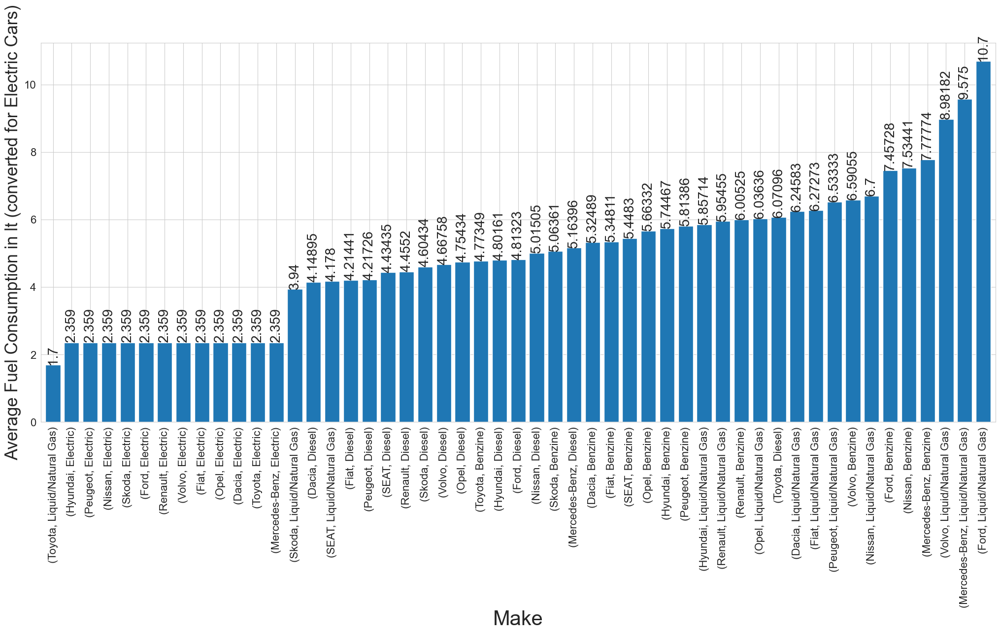

In [215]:
ax = avg_fuel_cons.plot.bar(figsize=(25, 10), fontsize=16, width=0.8, rot=90)

for container in ax.containers:
    ax.bar_label(container, fontsize=20, rotation=90)
    
ax.set_xlabel('Make', fontsize=30);
ax.set_ylabel('Average Fuel Consumption in lt (converted for Electric Cars)', fontsize=25);

In [216]:
# ax = cons_avg.unstack(level=0).plot.bar(figsize=(20, 8), fontsize=14, width=0.9, rot=60)

# for container in ax.containers:
#     ax.bar_label(container, fontsize=12, rotation=90)
    
# ax.set_xlabel('Body & fuel_type', fontsize=30)
# ax.set_ylabel('Average Consumption', fontsize=30)
# plt.legend(title="Make & Model", title_fontsize=12, prop={'size': 10}, bbox_to_anchor=(0.2, 0.7));

In [217]:
# ax = cons_avg.unstack(level=2).plot.bar(figsize=(20, 8), fontsize=14, width=0.9, rot=90)

# for container in ax.containers:
#     ax.bar_label(container, fontsize=12, rotation=90)
    
# ax.set_xlabel('Make-Model & Body Type', fontsize=30)
# ax.set_ylabel('Average Consumption', fontsize=30)
# plt.legend(title="fuel_type", title_fontsize=16, prop={'size': 14});

### 6. What are the ``lowest`` and ``highest`` sales ``prices`` of the vehicles according to the ``make & model``? And find the ``selling price`` ``difference`` for each ``make & model`` group. Which vehicle group has the ``biggest price difference``?

In [218]:
df.groupby(["make_model"]).price.min()

make_model
Dacia                       19515.000
Dacia Break                 20500.000
Dacia Dokker                 3890.000
Dacia Duster                 4800.000
Dacia Jogger                18160.000
Dacia Lodgy                  4999.000
Dacia Logan                  1490.000
Dacia Sandero                2300.000
Dacia Spring                16499.000
Fiat                         5990.000
Fiat 124 Spider             16121.000
Fiat 500                     4700.000
Fiat 500 Abarth             12490.000
Fiat 500C                    6290.000
Fiat 500L                    8499.000
Fiat 500X                    9990.000
Fiat 500e                   14900.000
Fiat 595 Abarth             12900.000
Fiat Barchetta               7600.000
Fiat Bravo                   1490.000
Fiat Croma                   1990.000
Fiat Doblo                   9990.000
Fiat Fiorino                 8490.000
Fiat Freemont                7900.000
Fiat Fullback               18999.000
Fiat Grande Punto            1695.000
F

In [219]:
df.groupby(["make_model"]).price.max()

make_model
Dacia                       22479.000
Dacia Break                 20500.000
Dacia Dokker                19997.000
Dacia Duster                29950.000
Dacia Jogger                26298.000
Dacia Lodgy                 24900.000
Dacia Logan                 17990.000
Dacia Sandero               21990.000
Dacia Spring                27044.000
Fiat                        27975.000
Fiat 124 Spider             38970.000
Fiat 500                    38970.000
Fiat 500 Abarth             29899.000
Fiat 500C                   39900.000
Fiat 500L                   24450.000
Fiat 500X                   41570.000
Fiat 500e                   37900.000
Fiat 595 Abarth             29990.000
Fiat Barchetta              18500.000
Fiat Bravo                   6500.000
Fiat Croma                   5900.000
Fiat Doblo                   9990.000
Fiat Fiorino                 9800.000
Fiat Freemont               16900.000
Fiat Fullback               29990.000
Fiat Grande Punto            5950.000
F

In [220]:
min_max_price = df.groupby(["make"]).agg({'price': ['max', 'min']}).sort_values(by=("price", 'max'), ascending=False)
min_max_price

price         
                     max      min
make                             
Ford          549000.000 1075.000
Mercedes-Benz 375900.000 1790.000
Nissan        237500.000 1000.000
Volvo          97450.000 1600.000
Renault        81980.000  490.000
Toyota         80490.000 1200.000
Hyundai        75991.000  700.000
Skoda          74490.000 1400.000
Peugeot        64290.000  790.000
Opel           59990.000  800.000
SEAT           51990.000  999.000
Fiat           41570.000 1199.000
Dacia          29950.000 1490.000

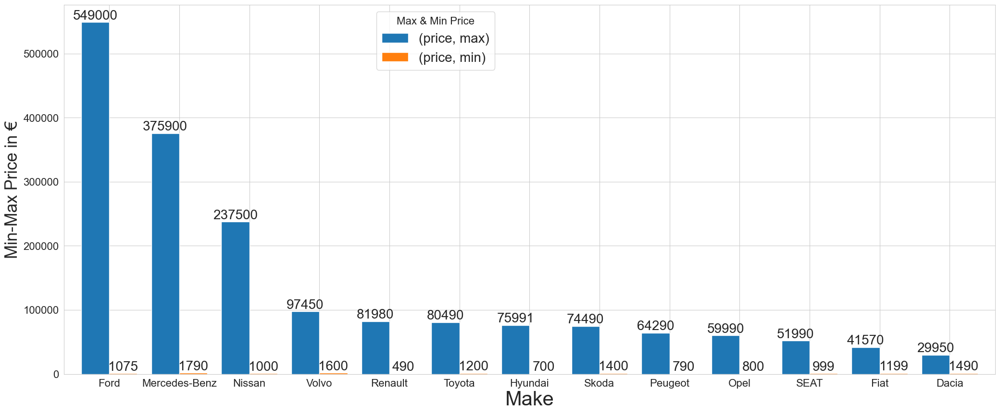

In [221]:
ax = min_max_price.plot.bar(figsize=(25, 10), fontsize=16, width=0.8, rot=0)

for container in ax.containers:
    ax.bar_label(container, fontsize=20, rotation=0)
    
ax.set_xlabel('Make', fontsize=30);
ax.set_ylabel('Min-Max Price in €', fontsize=25)

plt.legend(title="Max & Min Price", title_fontsize=16, prop={'size': 20}, bbox_to_anchor=(0.47, 1));

**Let us also see the Price differences for each Make & Model in the plot.**

In [222]:
min_max_price.columns

MultiIndex([('price', 'max'),
            ('price', 'min')],
           )

In [223]:
min_max_price['price', 'difference'] = min_max_price['price', 'max'] - min_max_price['price', 'min']
min_max_price.sort_values(by=('price', 'difference'), ascending=False)

price                    
                     max      min difference
make                                        
Ford          549000.000 1075.000 547925.000
Mercedes-Benz 375900.000 1790.000 374110.000
Nissan        237500.000 1000.000 236500.000
Volvo          97450.000 1600.000  95850.000
Renault        81980.000  490.000  81490.000
Toyota         80490.000 1200.000  79290.000
Hyundai        75991.000  700.000  75291.000
Skoda          74490.000 1400.000  73090.000
Peugeot        64290.000  790.000  63500.000
Opel           59990.000  800.000  59190.000
SEAT           51990.000  999.000  50991.000
Fiat           41570.000 1199.000  40371.000
Dacia          29950.000 1490.000  28460.000

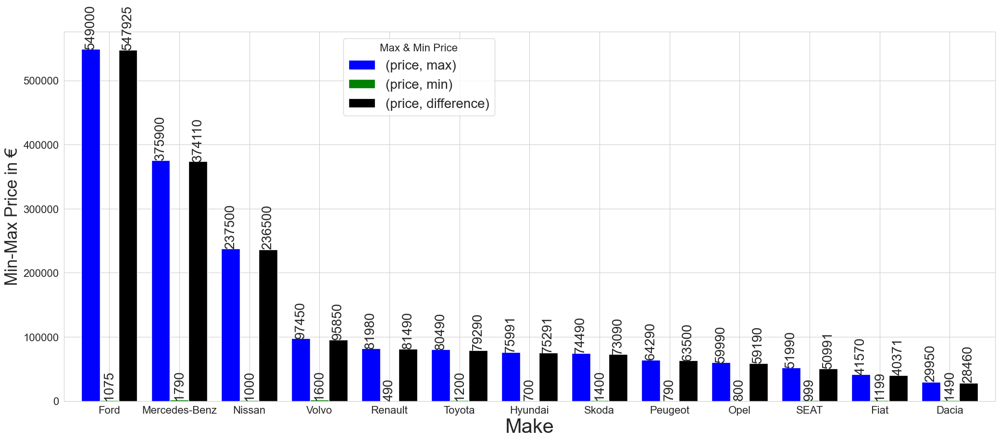

In [224]:
from itertools import cycle, islice

# Make a list by cycling through the colors we care about to match the length of our data.
my_colors = list(islice(cycle(['b', 'g', 'k']), None, len(min_max_price)))

ax = min_max_price.plot.bar(figsize=(25, 10), fontsize=16, width=0.8, rot=0, color=my_colors)

for container in ax.containers:
    ax.bar_label(container, fontsize=20, rotation=90)
    
ax.set_xlabel('Make', fontsize=30);
ax.set_ylabel('Min-Max Price in €', fontsize=25)

plt.legend(title="Max & Min Price", title_fontsize=16, prop={'size': 20}, bbox_to_anchor=(0.47, 1));

### 7. What is the ``average`` selling ``price`` of vehicles whose ``make & model`` is ``Ford Fiesta`` and ``body_type`` is ``Sedan``?

In [225]:
df[(df["make_model"] == "Ford Fiesta") & (df["body_type"] == "Sedan")].price.mean()

17379.878205128207

### 8. What are the ``average``, ``minimum`` and ``maximum`` selling ``prices`` of vehicles by ``body_type``?

In [226]:
# Average, minimum, and maximum price for sale by make_maodel & body_type

df.groupby(['make_model', 'body_type']).agg({'price': ['mean', 'min', 'max']})

price                      
                                                mean        min        max
make_model               body_type                                        
Dacia                    Compact           21431.000  19515.000  22479.000
                         Station wagon     21799.000  21799.000  21799.000
Dacia Break              Station wagon     20500.000  20500.000  20500.000
Dacia Dokker             Compact           11930.000  11930.000  11930.000
                         Off-Road/Pick-up  12490.000  12490.000  12490.000
                         Sedan              8900.000   8900.000   8900.000
                         Station wagon     13344.115   3890.000  19997.000
Dacia Duster             Convertible       16900.000  16900.000  16900.000
                         Off-Road/Pick-up  16645.035   5700.000  29950.000
                         Sedan             15835.000  14950.000  16900.000
                         Station wagon     15586.190   4800.000  27960.000
Dacia Jogger             Off-Road/Pick-up  24280.000  24280.000  24280.000
                         Sedan             22140.000  22140.000  22140.000
                         Station wagon     23216.259  18160.000  26298.000
Dacia Lodgy              Compact           16500.000  16500.000  16500.000
                         Sedan             19400.000  13900.000  24900.000
                         Station wagon     12835.333   4999.000  24900.000
Dacia Logan              Compact            9634.769   6250.000  11950.000
                         Sedan              8772.206   1650.000  17685.000
                         Station wagon      9057.322   1490.000  17990.000
Dacia Sandero            Compact           11936.170   2300.000  21990.000
                         Convertible       12900.000  12900.000  12900.000
                         Coupe             11400.000   9900.000  12900.000
                         Off-Road/Pick-up  16517.542   7000.000  18990.000
                         Sedan             11736.124   2400.000  19990.000
                         Station wagon      9763.250   6990.000  11565.000
Dacia Spring             Compact           22735.160  19269.000  23090.000
                         Off-Road/Pick-up  19323.000  16499.000  22980.000
                         Sedan             21041.500  18099.000  27044.000
Fiat                     Compact           27975.000  27975.000  27975.000
                         Convertible       21626.000  19989.000  22999.000
                         Coupe             25445.000  22990.000  27900.000
                         Station wagon      8475.000   5990.000  10960.000
Fiat 124 Spider          Convertible       23489.418  18488.000  38970.000
                         Coupe             16981.622  16121.000  27900.000
Fiat 500                 Compact           13810.335   5444.000  38970.000
                         Convertible       16602.816   6490.000  33900.000
                         Coupe             13122.837   5500.000  37500.000
                         Off-Road/Pick-up  22861.250  12500.000  29985.000
                         Sedan             13398.124   4700.000  33500.000
                         Station wagon     12828.333  11900.000  13595.000
Fiat 500 Abarth          Compact           21894.125  13595.000  29899.000
                         Convertible       17163.333  12490.000  24900.000
                         Coupe             24815.000  22945.000  28500.000
                         Sedan             16920.000  15990.000  17850.000
Fiat 500C                Compact           14239.000   9500.000  19900.000
                         Convertible       15590.485   6290.000  39900.000
                         Coupe              9970.000   9970.000   9970.000
                         Sedan             20990.000  20990.000  20990.000
Fiat 500L                Off-Road/Pick-up  17393.750  14680.000  20380.000
                         Sedan             14450.643   8900.000  24450.0

In [227]:
# Average, minimum, and maximum price for sale by body_type

min_max_avg_price = df.groupby(['body_type']).agg({'price': ['max', 'min', 'mean']}).sort_values(by=('price', 'max'), ascending=False)
min_max_avg_price

price                   
                        max      min      mean
body_type                                     
Coupe            549000.000  490.000 30359.028
Off-Road/Pick-up 375900.000 3295.000 29424.147
Convertible      283900.000  699.000 21122.606
Sedan            188008.000  999.000 22670.445
Compact          184900.000  950.000 15993.079
Station wagon    177879.000  790.000 22249.663

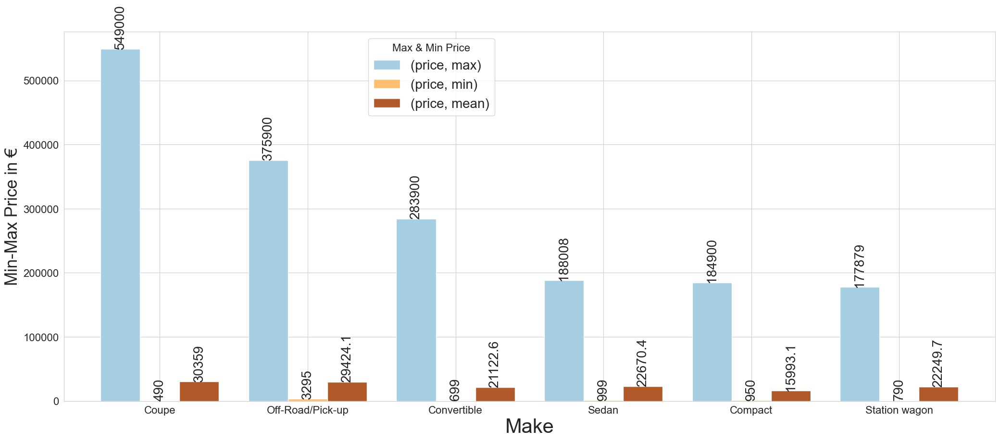

In [228]:
ax = min_max_avg_price.plot.bar(figsize=(25, 10), fontsize=16, width=0.8, rot=0, colormap='Paired')

for container in ax.containers:
    ax.bar_label(container, fontsize=20, rotation=90)
    
ax.set_xlabel('Make', fontsize=30);
ax.set_ylabel('Min-Max Price in €', fontsize=25)

plt.legend(title="Max & Min Price", title_fontsize=16, prop={'size': 20}, bbox_to_anchor=(0.47, 1));

### 9. What is the ``make_model`` of the vehicles whose sales ``price`` is ``between 59000 and 60000`` in € (inclusive)?

In [229]:
df[(df.price >= 59000) & (df.price <= 60000)]["make_model"].unique()

array(['Mercedes-Benz A 35 AMG', 'Mercedes-Benz C 43 AMG',
       'Mercedes-Benz C 400', 'Mercedes-Benz E 220',
       'Mercedes-Benz E 300', 'Mercedes-Benz E 400',
       'Mercedes-Benz E 53 AMG', 'Mercedes-Benz GLE 300',
       'Mercedes-Benz GLC 300', 'Mercedes-Benz GLA 45 AMG',
       'Mercedes-Benz C 63 AMG', 'Mercedes-Benz C 220',
       'Mercedes-Benz S 450', 'Mercedes-Benz A 45 AMG',
       'Mercedes-Benz S 350', 'Mercedes-Benz S 400',
       'Mercedes-Benz S 63 AMG', 'Opel Movano', 'Renault Alpine A110',
       'Renault Clio', 'Peugeot Traveller', 'Peugeot 508', 'Toyota Supra',
       'Toyota Highlander', 'Toyota RAV 4', 'Toyota Proace',
       'Nissan GT-R', 'Ford Mustang', 'Ford Ranger', 'Hyundai IONIQ 5',
       'Volvo XC90', 'Volvo XC60', 'Volvo V60', 'Volvo V90', 'Volvo S60',
       'Volvo S90'], dtype=object)

### 10. What is the most common ``gearbox`` type among the vehicles for sale whose ``make & model`` is ``Peugeot 508`` and ``body`` is ``Sedan``?

In [230]:
df[(df["make_model"] == "Peugeot 508") & (df["body_type"] == "Sedan")].gearbox.mode()

0    Automatic
Name: gearbox, dtype: object

## <p style="background-color:#9d4f8c; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">An Analysis of Inferential Statistics/Hypothesis Testing on Some Specific Features</p>

<a id="4"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

Statistics is one of the essential subject matters in data science, which provides tools and methods to give more in-depth insights into data. Besides, Statistical Analysis of data is important because it saves time and optimizes the problem. It is carried out efficiently in python. Python libraries are used to take every analysis of data. Python libraries can smartly handle small issues like the scaling of data while analyzing statistical properties. Python replaces a complex mathematical expression with the functions that are present in its libraries. It is fast and provides accurate knowledge about data which can be used to process further for predictions or classifications like problems. Statistical analysis is important to good decisions on data. Statistical analysis of data helps us to access effective data only with good efficiency. It helps us to decide an optimal path for data accessing and processing.

**Descriptive Statistics:**

Descriptive statistics are used to identifying hidden patterns in the data. It just describes the data through statistics. It doesn’t make any predictions about the data. Several methods are used to analyze descriptive statistics of data such as mean, median, mode, variance, and standard deviation. Descriptive statistics frequently use the following statistical measures to describe groups: 
 - Central tendency : Use the mean or the median to locate the center of the dataset. This measure tells you where most values fall.
 - Dispersion: How far out from the center do the data extend? You can use the range or standard deviation to measure the dispersion. A low dispersion indicates that the values cluster more tightly around the center. Higher dispersion signifies that data points fall further away from the center. We can also graph the frequency distribution.

 - Skewness: The measure tells you whether the distribution of values is symmetric or skewed.

**Inferential Statistics:**

This type of statistical analysis is intended to extract inferences or hypotheses from a sample of large data. Prediction about the population is carried out from random samples of data. The prediction of the dependent variable based on the independent variable is carried out in inferential statistics. 

**🧐 [Difference between Descriptive and Inferential Statistics](https://statisticsbyjim.com/basics/descriptive-inferential-statistics/)**<br>
**🧐 [Introduction to Statistical Analysis in Python](https://www.educba.com/statistical-analysis-in-python/)**

<img src=https://i.ibb.co/ZMyccvG/statistical-tests.png width="500" height="100">

**🧐 [Measure the correlation between numerical and categorical variables and the correlation between two categorical variables in Python: Chi-Square and ANOVA](http://www.sefidian.com/2021/07/02/measure-the-correlation-between-numerical-and-categorical-variables-and-the-correlation-between-two-categorical-variables-in-python-chi-square-and-anova/)**<br>
**🧐 [Inferential Statistics: Data Analysis](https://towardsdatascience.com/inferential-statistics-data-analysis-e59adc75c6eb)**<br>
**🧐 [Statistical Inference in Python using Pandas, NumPy](https://towardsdatascience.com/statistical-inference-in-pyhton-using-pandas-numpy-part-i-c2ac0320dffe)**

<img src=https://i.ibb.co/mJCKMTw/rejection-area.png width="500" height="100">

In [231]:
df0.select_dtypes(exclude=["number","bool_"]).head(3)

,make_model,make,location,body_type,type,warranty,gearbox,fuel_type,seller,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,energy_efficiency_class
0,Mercedes-Benz A 160,Mercedes-Benz,"P.I. EL PALMAR C/FORJA 6, 11500 PUERTO DE SAN...",Compact,Used,Yes,Manual,Diesel,Dealer,Front,Standard,Standard,Safety Premium Package,New,No,No,Euro 6,Cloth,efficient
1,Mercedes-Benz EQE 350,Mercedes-Benz,"APARTADO DE CORREOS 1032, 26140 LOGROÑO, ES",Compact,Pre-registered,Yes,Automatic,Electric,Dealer,4WD,Premium,Plus,Safety Premium Package,New,No,No,Euro 6,Part/Full Leather,efficient
2,Mercedes-Benz A 45 AMG,Mercedes-Benz,"PORT. TARRACO, MOLL DE LLEVANT, Nº 5, LOC. 6-8...",Compact,Used,Yes,Automatic,Benzine,Dealer,4WD,Standard,Standard,Safety Premium Plus Package,Not_passed,No,No,Euro 6,Part/Full Leather,unefficient


As seen above, there are many categorical features in the dataset such as ``"make_model"``, ``"make"``, ``"body_type"``, ``"type"``, ``"warranty"``, ``"gearbox"``, ``"fuel_type"``, ``"seller"``, etc. We will be using some of these features and check whether one feature effect affects other features using several tests i.e ``Z-Test``, ``correlation test``, ``ANOVA test``, and ``Chi-square test``.

### ANOVA:

ANOVA stands for Analysis Of Variance. Actually, this test measures if there are any significant differences between the means of the values of the numeric variable for each categorical value. This is something that you can visualize using a box plot as well.

In the below example, we are trying to measure if there is any correlation between fuel types on car prices. Here **``fuel_type``** is a categorical predictor and **``price`**` is the numeric target/label variable.

In [232]:
# f_oneway() function takes the group data as input and returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between price and fuel_type
# Assumption(H0) is that fuel_type and price are NOT correlated
# H0: μ1 = μ2 = μ3 ... = μk (Means are all equal)

print(f"Null Hypothesis: There is NO significant difference between the mean price among different groups of dependents.")
print(f"Alternate  Hypothesis: There is significant difference between the mean price among different groups of dependents.")
print("*"*120)
 
# Finds out the price for each fuel_type as a list
CategoryGroupLists = df0.groupby('fuel_type')['price'].apply(list)
 
# Performing the ANOVA test
# We accept/fail to reject the Assumption(H0) only when P-Value > 0.05
AnovaResults = f_oneway(*CategoryGroupLists)

print('F-Value for Anova is: ', AnovaResults[0], '\nP-Value for Anova is: ', AnovaResults[1])
print("*"*45)

# Defining significance level
alpha = 0.05

if AnovaResults[1] <= alpha:
    print(f"Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is rejected.\nCONCLUSION:\nThere is a statistically significant difference between the groups and their effects on price F={AnovaResults[0]}, p-value={AnovaResults[1]}")
else:
    print(f"Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is failed to reject/accepted.\nCONCLUSION:\nThere is NO a statistically significant difference between the groups and their effects on price F={AnovaResults[0]}, p-value={AnovaResults[1]}")     

Null Hypothesis: There is NO significant difference between the mean price among different groups of dependents.
Alternate  Hypothesis: There is significant difference between the mean price among different groups of dependents.
************************************************************************************************************************
F-Value for Anova is:  97.72203200189021 
P-Value for Anova is:  6.285388473498683e-63
*********************************************
Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is rejected.
CONCLUSION:
There is a statistically significant difference between the groups and their effects on price F=97.72203200189021, p-value=6.285388473498683e-63


In [233]:
AnovaResults

F_onewayResult(statistic=97.72203200189021, pvalue=6.285388473498683e-63)

The Null hypothesis in the ANOVA test is; **Ho: Two variables are NOT correlated.**<br>
Hence, if the p-value comes as 0, we will reject H0 and say the variables are correlated with each other.

**As the output of the P-value is almost zero, hence, we reject H0. Which means the variables are correlated with each other.**

🔥 👉 P-Value of 6.285388473498683e-63 means 6.285388473498683×10−63. For example; e-5 just means x 10^(-5), i.e. divided by 100000.

**[How to measure the correlation between a numeric and a categorical variable in Python](https://thinkingneuron.com/how-to-measure-the-correlation-between-a-numeric-and-a-categorical-variable-in-python/)**

Now in the below example, we are trying to measure if there is any correlation between fuel types on car prices. Here **``bodyl_type``** is a categorical predictor and **``price`**` is the numeric target/label variable.

In [234]:
# f_oneway() function takes the group data as input and returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between price and body_type
# Assumption(H0) is that body_type and price are NOT correlated
# H0: μ1 = μ2 = μ3 ... = μk (Means are all equal)

print(f"Null Hypothesis: There is NO significant difference between the mean price among different groups of dependents.")
print(f"Alternate  Hypothesis: There is significant difference between the mean price among different groups of dependents.")
print("*"*120)
 
# Finds out the price for each fuel_type as a list
CategoryGroupLists = df0.groupby('body_type')['price'].apply(list)
 
# Performing the ANOVA test
# We accept/fail to reject the Assumption(H0) only when P-Value > 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('F-Value for Anova is: ', AnovaResults[0], '\nP-Value for Anova is: ', AnovaResults[1])
print("*"*45)

# Defining significance level
alpha = 0.05

if AnovaResults[1] <= alpha:
    print(f"Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is rejected.\nCONCLUSION:\nThere is a statistically significant difference between the groups and their effects on price F={AnovaResults[0]}, p-value={AnovaResults[1]}")
else:
    print(f"Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is failed to reject/accepted.\nCONCLUSION:\nThere is NO a statistically significant difference between the groups and their effects on price F={AnovaResults[0]}, p-value={AnovaResults[1]}")     

Null Hypothesis: There is NO significant difference between the mean price among different groups of dependents.
Alternate  Hypothesis: There is significant difference between the mean price among different groups of dependents.
************************************************************************************************************************
F-Value for Anova is:  253.62130822126625 
P-Value for Anova is:  4.091167952928636e-266
*********************************************
Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is rejected.
CONCLUSION:
There is a statistically significant difference between the groups and their effects on price F=253.62130822126625, p-value=4.091167952928636e-266


**As the output of the P-value is almost zero, hence, we reject H0. Which means the variables are correlated with each other.**

In [235]:
df0['make'].unique()

array(['Mercedes-Benz', 'Opel', 'Renault', 'Peugeot', 'Fiat', 'SEAT',
       'Skoda', 'Dacia', 'Toyota', 'Nissan', 'Ford', 'Hyundai', 'Volvo'],
      dtype=object)

In [236]:
# f_oneway() function takes the group data as input and returns F-statistic and P-value
from scipy.stats import f_oneway

# derive the groups (i.e. types of makes)
groups = pd.unique(df0.make.values)

# Create a dictionary to hold respective price of the types of make groups
statData = {grp: df0['price'][df0['make'] == grp] for grp in groups}
F, p = stats.f_oneway(statData['Mercedes-Benz'], statData['Opel'], statData['Volvo'])

print('F-Value for Anova is: ', F, '\nP-Value for Anova is: ', p)
print("*"*45)

# Defining significance level
alpha = 0.05

if AnovaResults[1] <= alpha:
    print(f"Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is rejected.\nCONCLUSION:\nThere is a statistically significant difference between the groups and their effects on price F={F}, p-value={p}")
else:
    print(f"Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is failed to reject/accepted.\nCONCLUSION:\nThere is NO a statistically significant difference between the groups and their effects on price F={F}, p-value={p}")     

F-Value for Anova is:  871.4043839940206 
P-Value for Anova is:  0.0
*********************************************
Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is rejected.
CONCLUSION:
There is a statistically significant difference between the groups and their effects on price F=871.4043839940206, p-value=0.0


**Interpretation of results:**

The null hypothesis is rejected, with a p-value less than 0.05. There is a significant difference between the price of the analyzed groups of make.

**[Navigating Statistical Tests](https://towardsdatascience.com/levels-of-measurement-statistics-and-python-implementations-8ff8e7867d0b)**

### z-test & t-test

**``Z-test``** is the statistical test, used to analyze whether two population means are different or not when the variances are known and the sample size is large. This test statistic is assumed to have a normal distribution, and **standard deviation** must be **known** to perform an accurate z-test.

A z-statistic, or z-score, is a number representing the value’s relationship to the mean of a group of values, it is measured with population parameters such as population standard deviation and used to validate a hypothesis. For example, the null hypothesis is “sample mean is the same as the population mean”, and alternative hypothesis is “the sample mean  is not the same as the population mean”. Z-test is not prefered to be implemented when the sample size is less than 30.

In order to know how significant the difference between two groups are, **``T-test``** is used, basically it tells that difference (measured in means) between two separate groups could have occurred by chance. This test assumes to have a normal distribution while based on t-distribution, and **population parameters such as mean, or standard deviation** are **unknown**.

The ratio between the difference between two groups and the difference within the group is known as T-score. Greater is the t-score, more is the difference between groups, and smaller is the t-score, more similarities are there among groups. For example, a t-score value of 2 indicates that the groups are two times as different from each other as they are with each other.

**Key Differences between t-test and z-test can be drawn clearly on the following grounds:**
 - The t-test can be understood as a statistical test which is used to compare and analyse whether the means of the two population is different from one another or not when the standard deviation is not known. As against, Z-test is a parametric test, which is applied when the standard deviation is known, to determine, if the means of the two datasets differ from each other.
 - The t-test is based on Student’s t-distribution. On the contrary, z-test relies on the assumption that the distribution of sample means is normal. Both student’s t-distribution and normal distribution appear alike, as both are symmetrical and bell-shaped. However, they differ in the sense that in a t-distribution, there is less space in the centre and more in the tails.
 - One of the important conditions for adopting t-test is that population variance is unknown. Conversely, population variance should be known or assumed to be known in case of a z-test.
 - Z-test is used to when the sample size is large, i.e. n > 30, and t-test is appropriate when the size of the sample is small, in the sense that n < 30.

<img src=https://i.ibb.co/vhms6Jr/parametric-test.png width="500" height="100">
 
**🧐 [What are the Differences Between Z-test and T-test?](https://www.analyticssteps.com/blogs/what-are-differences-between-z-test-and-t-test)**<br>
**🧐 [Difference Between T-test and Z-test](https://keydifferences.com/difference-between-t-test-and-z-test.html)**<br>
**🧐 [Statistics for Analytics and Data Science: Hypothesis Testing and Z-Test vs. T-Test](https://www.analyticsvidhya.com/blog/2020/06/statistics-analytics-hypothesis-testing-z-test-t-test/)**<br>
**🧐 [What Is the Difference Between a T-Test and a Z-Test?](https://knowledgehound.com/data/what-is-the-difference-between-a-t-test-and-a-z-test/)**<br>
**🧐 [Z-test](https://www.geeksforgeeks.org/z-test/)**
**🧐 [Feature Selection using Statistical Tests](https://www.analyticsvidhya.com/blog/2021/06/feature-selection-using-statistical-tests/)**

In [237]:
df0.make.unique()

array(['Mercedes-Benz', 'Opel', 'Renault', 'Peugeot', 'Fiat', 'SEAT',
       'Skoda', 'Dacia', 'Toyota', 'Nissan', 'Ford', 'Hyundai', 'Volvo'],
      dtype=object)

**Let us calculate the ``mean`` of each make for price:**

In [238]:
Mercedes_mean = df0.loc[df0['make'] == 'Mercedes-Benz', 'price'].mean()
Opel_mean = df0.loc[df0['make'] == 'Opel', 'price'].mean()
Renault_mean = df0.loc[df0['make'] == 'Renault', 'price'].mean()
Peugeot_mean = df0.loc[df0['make'] == 'Peugeot', 'price'].mean()
Fiat_mean = df0.loc[df0['make'] == 'Fiat', 'price'].mean()
SEAT_mean = df0.loc[df0['make'] == 'SEAT', 'price'].mean()
Skoda_mean = df0.loc[df0['make'] == 'Skoda', 'price'].mean()
Dacia_mean = df0.loc[df0['make'] == 'Dacia', 'price'].mean()
Toyota_mean = df0.loc[df0['make'] == 'Toyota', 'price'].mean()
Nissan_mean = df0.loc[df0['make'] == 'Nissan', 'price'].mean()
Ford_mean = df0.loc[df0['make'] == 'Ford', 'price'].mean()
Hyundai_mean = df0.loc[df0['make'] == 'Hyundai', 'price'].mean()
Volvo_mean = df0.loc[df0['make'] == 'Volvo', 'price'].mean()

In [239]:
# print("The Price Mean of Mercedes-Benz make is", Mercedes_mean, "€")
# print("The Price Mean of Opel make is", Opel_mean, "€")
# print("The Price Mean of Renault make is", Renault_mean, "€")
# print("The Price Mean of Peugeot make is", Peugeot_mean, "€")
# print("The Price Mean of Fiat make is", Fiat_mean, "€")
# print("The Price Mean of SEAT make is", SEAT_mean, "€")
# print("The Price Mean of Skoda make is", Skoda_mean, "€")
# print("The Price Mean of Dacia make is", Dacia_mean, "€")
# print("The Price Mean of Toyota make is", Toyota_mean, "€")
# print("The Price Mean of Nissan make is", Nissan_mean, "€")
# print("The Price Mean of Ford make is", Ford_mean, "€")
# print("The Price Mean of Hyundai make is", Hyundai_mean, "€")
# print("The Price Mean of Volvo make is", Volvo_mean, "€")

def displaymean(df, group_col, target_col):
    mean_lst = []
    for group in df[group_col].unique():
        cond = df[group_col] == group
        unique_mean = df[cond][target_col].mean()
        mean_lst.append(unique_mean)
#     print(mean_lst)
        print("The Price Mean of", group, "is", unique_mean)
        
displaymean(df0, "make", "price") 

The Price Mean of Mercedes-Benz is 52398.824020016684
The Price Mean of Opel is 17063.384905660376
The Price Mean of Renault is 17411.98766482348
The Price Mean of Peugeot is 16469.12118644068
The Price Mean of Fiat is 15896.91745081266
The Price Mean of SEAT is 19427.01835915089
The Price Mean of Skoda is 23650.35312899106
The Price Mean of Dacia is 13874.427456083278
The Price Mean of Toyota is 22166.600098135426
The Price Mean of Nissan is 21946.21511627907
The Price Mean of Ford is 31213.901462994836
The Price Mean of Hyundai is 19541.789501874664
The Price Mean of Volvo is 26489.72806777808


**Let us calculate the ``standard deviation`` of each make for price:**

In [240]:
Mercedes_std = df0.loc[df0['make'] == 'Mercedes-Benz', 'price'].std()
Opel_std = df0.loc[df0['make'] == 'Opel', 'price'].std()
Renault_std = df0.loc[df0['make'] == 'Renault', 'price'].std()
Peugeot_std = df0.loc[df0['make'] == 'Peugeot', 'price'].std()
Fiat_std = df0.loc[df0['make'] == 'Fiat', 'price'].std()
SEAT_std = df0.loc[df0['make'] == 'SEAT', 'price'].std()
Skoda_std = df0.loc[df0['make'] == 'Skoda', 'price'].std()
Dacia_std = df0.loc[df0['make'] == 'Dacia', 'price'].std()
Toyota_std = df0.loc[df0['make'] == 'Toyota', 'price'].std()
Nissan_std = df0.loc[df0['make'] == 'Nissan', 'price'].std()
Ford_std = df0.loc[df0['make'] == 'Ford', 'price'].std()
Hyundai_std = df0.loc[df0['make'] == 'Hyundai', 'price'].std()
Volvo_std = df0.loc[df0['make'] == 'Volvo', 'price'].std()

# for make in df0.make.unique():
#     make_std = df0.loc[df0['make'] == make, 'price'].std()
#     print("The Standard Deviation of", make, "make is", make_std)

def displaystd(df, group_col, target_col):
    for group in df[group_col].unique():
        cond = df[group_col] == group
        unique_std = df[cond][target_col].std()
#         print(unique_std)
        print("The Standard Deviation of", group, "is", unique_std)
        
displaystd(df0, "make", "price")        

The Standard Deviation of Mercedes-Benz is 43613.08953245111
The Standard Deviation of Opel is 9570.483993783982
The Standard Deviation of Renault is 14143.09994766475
The Standard Deviation of Peugeot is 11323.723310440806
The Standard Deviation of Fiat is 10103.102471321787
The Standard Deviation of SEAT is 9049.450614002883
The Standard Deviation of Skoda is 11118.462028292477
The Standard Deviation of Dacia is 5409.182169690417
The Standard Deviation of Toyota is 14390.282528682923
The Standard Deviation of Nissan is 22990.80995135525
The Standard Deviation of Ford is 33265.92155995493
The Standard Deviation of Hyundai is 10649.16087114497
The Standard Deviation of Volvo is 29304.985281584126


**Let us calculate the ``number`` of each make:**

In [241]:
Mercedes_num = df0.loc[df0['make'] == 'Mercedes-Benz', 'price'].count()
Opel_num = df0.loc[df0['make'] == 'Opel', 'price'].count()
Renault_num = df0.loc[df0['make'] == 'Renault', 'price'].count()
Peugeot_num = df0.loc[df0['make'] == 'Peugeot', 'price'].count()
Fiat_num = df0.loc[df0['make'] == 'Fiat', 'price'].count()
SEAT_num = df0.loc[df0['make'] == 'SEAT', 'price'].count()
Skoda_num = df0.loc[df0['make'] == 'Skoda', 'price'].count()
Dacia_num = df0.loc[df0['make'] == 'Dacia', 'price'].count()
Toyota_num = df0.loc[df0['make'] == 'Toyota', 'price'].count()
Nissan_num = df0.loc[df0['make'] == 'Nissan', 'price'].count()
Ford_num = df0.loc[df0['make'] == 'Ford', 'price'].count()
Hyundai_num = df0.loc[df0['make'] == 'Hyundai', 'price'].count()
Volvo_num = df0.loc[df0['make'] == 'Volvo', 'price'].count()

# for make in df0.make.unique():
#     make_num = df0.loc[df0['make'] == make, 'price'].count()
#     print("The number of", make, "make is", make_num)
    
def displaystd(df, group_col, target_col):
    for group in df[group_col].unique():
        cond = df[group_col] == group
        unique_count = df[cond][target_col].count()
#         print(unique_count)
        print("The number of", group, "is", unique_count)
        
displaystd(df0, "make", "price")     

The number of Mercedes-Benz is 2398
The number of Opel is 2385
The number of Renault is 2351
The number of Peugeot is 2360
The number of Fiat is 2338
The number of SEAT is 1743
The number of Skoda is 1566
The number of Dacia is 1537
The number of Toyota is 2038
The number of Nissan is 2064
The number of Ford is 2324
The number of Hyundai is 1867
The number of Volvo is 3659


**The above code is calculating the ``means`` of car prices for each make, their ``standard deviations``, and the ``number`` of samples of each make.**

**``twoSampZ``** **function belove will calculate the z-statistic and p-value bypassing the input parameters calculated above.**

In [242]:
from numpy import sqrt, abs, round
import scipy.stats as stats
from scipy.stats import norm
from  scipy.stats import zscore

def twoSampZ(X1, X2, mudiff, sd1, sd2, n1, n2):
    pooledSE = sqrt(sd1**2/n1 + sd2**2/n2)
    z = ((X1 - X2) - mudiff)/pooledSE
    pval = 2*(1 - norm.cdf(abs(z)))
    return round(z, 3), pval

z, p = twoSampZ(Skoda_mean, Opel_mean, 0, Skoda_std, Opel_std, Skoda_num, Opel_num)
print('The Z-score of z-test is', z, '\nThe P-Value of z-test is', p)
print("*"*45)
    
# Defining significance level
alpha = 0.05

if AnovaResults[1] <= alpha:
    print(f"Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is rejected.\nCONCLUSION:\nThere is a statistically significant difference between the groups and their effects on price z-score={z}, p-value={p}")
else:
    print(f"Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is failed to reject/accepted.\nCONCLUSION:\nThere is NO a statistically significant difference between the groups and their effects on price z-score={z}, p-value={p}")         

The Z-score of z-test is 19.229 
The P-Value of z-test is 0.0
*********************************************
Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is rejected.
CONCLUSION:
There is a statistically significant difference between the groups and their effects on price z-score=19.229, p-value=0.0


**Interpretation of results:**

Since value p is less than 0.5 we reject the null hypothesis. Therefore, it can be concluded that there is significant difference in price among make groups.

### Mann-Whitney U:

Also known as Mann Whitney Wilcoxon Test or Wilcoxon Rank Sum Test.

Compares differences between two variables when the dependent variable is either ordinal or continuous & not normally distributed.
independent variable should consist of two categorical, independent groups.

In [243]:
# mann-whitney u test
stats.mannwhitneyu(x=df0['warranty'].map({"No": 0, "Yes": 1}),
                   y=df0['price'])

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

**Interpretation of results:**

With a p-value less than 0.05, we can **reject the null hypothesis** assuming that there is statistically difference between warranty, Yes & No, and car prices.

### Point-biserial correlation:

 - Used to measure the strength and direction of the association
 - Between continuous & categorical variable

In [244]:
# point-biserial correlation
# output is a tuple

X = df0['warranty'].map({"No": 0, "Yes": 1})
y = df0['price']
                        
result = stats.pointbiserialr(X, y)
print(f'correlation between X and y: {result[0]:.2f}')
print(f'p-value: {result[1]:.2g}')

correlation between X and y: 0.16
p-value: 2.2e-159


**Interpretation of results:**

With a p-value less than 0.05, we reject the null hypothesis. X ``('warranty')`` and y ``('price')`` are dependent; with a strong association between them.

### The Chi-Square Test:

The chi-square test is a hypothesis test designed to test for a statistically significant relationship between nominal and ordinal variables organized in a bivariate table. In other words, it tells us whether two variables are independent of one another. so when the target variable and the predictors are categorical, then the strength of the relationship between them can be measured using a Chi-square test.

🔥 👉 **SPECIAL NOTE:** Even if our target variable, "price", is NOT categorical, we will test some of other categorical variables in our DataFrame to practice Chi-Square Testing

**🧐 [A beginner’s guide to Chi-square test in python from scratch](https://analyticsindiamag.com/a-beginners-guide-to-chi-square-test-in-python-from-scratch/)**

**🧐 [Measure the correlation between numerical and categorical variables and the correlation between two categorical variables in Python: Chi-Square and ANOVA](http://www.sefidian.com/2021/07/02/measure-the-correlation-between-numerical-and-categorical-variables-and-the-correlation-between-two-categorical-variables-in-python-chi-square-and-anova/)**

In [245]:
# Cross tabulation between "gearbox" and "body_type"
CrosstabResult = pd.crosstab(index=df0['gearbox'], columns=df0['body_type'])
print(CrosstabResult)
 
# Importing the required function
from scipy.stats import chi2_contingency
 
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
 
# P-Value is the Probability of H0 being True
# If P-Value>0.05 then only we Accept (Fail to reject) the assumption(H0)
 
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])

body_type       Compact  Convertible  Coupe  Off-Road/Pick-up  Sedan  \
gearbox                                                                
Automatic          1415         1188   1177              3017   1992   
Manual             3964         2120   2812              2393   3043   
Semi-automatic        8           20     20                 5      8   

body_type       Station wagon  
gearbox                        
Automatic                2580  
Manual                   2857  
Semi-automatic             11  
The P-Value of the ChiSq Test is: 2.9004934517017165e-284


Chi-square test between two categorical variables to find the correlation

We now define the null hypothesis and alternate hypothesis:

 - H₀ (Null Hypothesis) — that the 2 categorical variables being compared are independent of each other.
 - H₁ (Alternate Hypothesis) — that the 2 categorical variables being compared are dependent on each other.
 
 And we draw conclusions based on the following p-value conditions:

 - p < 0.05 — this means the two categorical variables are correlated.
 - p > 0.05 — this means the two categorical variables are not correlated.

**Interpretation of results:**

In the above example, the p-value came ``less than 0.05`` with a value of ``2.4978488898651774e-284``. Hence H0 will be rejected. This means the variables are correlated with each other. This means that if two variables are correlated, then the p-value is expected to come very close to zero, which is the case above.

In [246]:
def chi2_by_hand(df, col1, col2):   
    # Creating the contingency table
    print('---Crosstab Contingency Table---')
    df_cont = pd.crosstab(index=df[col1], columns=df[col2])
    
    # Calculating degree of freedom
    degree_f = (df_cont.shape[0]-1) * (df_cont.shape[1]-1)
    #  Note: The degrees of freedom for a test of independence equals the product of the number of categories 
    #  in each variable minus 1. In this case we have a 4×2 table, so degrees of freedom = 3×1 = 3.

    display(df_cont)    
    
    # Summing up the totals for row and columns
    print('---Observed (O) Contingency Table---')
    df_cont.loc[:, 'Row Totals'] = df_cont.sum(axis=1)
    df_cont.loc['Column Totals'] = df_cont.sum()
    display(df_cont)    
  
    # Creating the expected value dataframe
    print('---Expected (E) Contingency Table---')
    df_exp = df_cont.copy()   
    df_exp.iloc[:,:] = np.multiply.outer(df_cont.sum(1).values, df_cont.sum().values) / df_cont.sum().sum()           
    display(df_exp)    
    
    # Calculating chi-square values
    print('---Chi-Square---')
    df_chi2 = ((df_cont - df_exp)**2) / df_exp   
    df_chi2.loc[:, 'Row Totals'] = df_chi2.sum(axis=1)
    df_chi2.loc['Column Totals'] = df_chi2.sum()
    display(df_chi2)  
    
    # Getting the chi-square score  
    chi_square_score = df_chi2.iloc[:-1, :-1].sum().sum()

    #  Calculating the p-value
    from scipy import stats
    p = stats.distributions.chi2.sf(chi_square_score, degree_f)   
    return chi_square_score, degree_f, p

chi_score, degree_f, p = chi2_by_hand(df,'type','warranty')
print(f'Chi2_score: {chi_score}, Degrees of freedom: {degree_f}, p-value: {p}')

print("*"*85)
# Defining significance level
alpha = 0.05

if p <= alpha:
    conclusion1 = "Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is rejected."
    print(conclusion1)
else:
    conclusion2 = "Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is failed to reject (accepted)."
    print(conclusion2) 

---Crosstab Contingency Table---


warranty,No,Yes
type,,
Demonstration,23,1312
Employee's car,0,521
Pre-registered,4,1235
Used,7400,14575


---Observed (O) Contingency Table---


warranty,No,Yes,Row Totals
type,,,
Demonstration,23,1312,1335
Employee's car,0,521,521
Pre-registered,4,1235,1239
Used,7400,14575,21975
Column Totals,7427,17643,25070


---Expected (E) Contingency Table---


warranty,No,Yes,Row Totals
type,,,
Demonstration,395.494,939.506,1335.000
Employee's car,154.347,366.653,521.000
Pre-registered,367.054,871.946,1239.000
Used,6510.105,15464.895,21975.000
Column Totals,7427.000,17643.000,25070.000


---Chi-Square---


warranty,No,Yes,Row Totals
type,,,
Demonstration,350.832,147.686,498.518
Employee's car,154.347,64.974,219.320
Pre-registered,359.098,151.166,510.264
Used,121.644,51.207,172.851
Column Totals,985.920,415.033,1400.953


Chi2_score: 1400.953337231573, Degrees of freedom: 3, p-value: 1.8294042460263193e-303
*************************************************************************************
Null Hypothesis, H0: μ1 = μ2 = μ3 ... = μk (Means are all equal), is rejected.


In the above example, as the calculated chi-square score of ``62.4196182391055`` is greater than ``7.81`` found in the chi-square Distribution Table at ``α = 0.05`` significance level and ``degrees of freedom = 3``, it, therefore, falls in the rejection region, and hence the null hypothesis is rejected and the alternate hypothesis is accepted (Fail to reject).

<img src=https://i.ibb.co/VVdn8Fd/chi-square.png width="600" height="100">

Recalling our alternate hypothesis as H₁ (Alternate Hypothesis) — that the 2 categorical variables being compared are dependent on each other. So we can either accept or reject the hypotheses and form the conclusion based on the following p-value conditions:

 - p < 0.05 — this means the two categorical variables are correlated.
 - p > 0.05 — this means the two categorical variables are not correlated.

**Interpretation of results:**

In this sense, since the p-value came less than 0.05, p < 0.05, — this means the two categorical variables, ``"warranty"`` and ``"type"``, are correlated and dependent on each other. 

### Pearson Correlation Coefficient:

It is used to measure the linear correlation between 2 variables. Its values lie between -1 and 1.

If the value of r is 0, it means there is no relationship between variables X and Y.

If the value of r is between 0 and 1, it means there is a positive relation between X and Y, and their strength increases from 0 to 1. Positive relation means if the value of X increases, the value of Y also increases.

If the value of r is between -1 and 0, it means there is a negative relation between X and Y, and their strength decreases from -1 to 0. Negative relation means if the value of X increases, the value of Y decreases.

In [247]:
df0.select_dtypes(include="number").head(3)

,price,doors,mileage,seats,engine_size,gears,co_emissions,empty_weight,previous_owner,age,power_kW,cons_avg
0,16950.000,5.000,120200.000,5.000,1595.000,5.000,98.000,1270.000,2.000,6.000,75.000,3.800
1,80900.000,4.000,5000.000,5.000,1.000,9.000,0.000,2355.000,1.000,0.000,215.000,2.359
2,69900.000,5.000,18900.000,5.000,1991.000,8.000,162.000,1555.000,2.000,2.000,310.000,8.400


**Numpy makes it easy to calculate the correlation matrix between different variables. The library has a function named ``.corrcoef()``. We can pass in two columns from a Pandas Dataframe to calculate the correlation matrix between them.**

In [248]:
pearson = np.corrcoef(df0.price, df0.mileage)
print(pearson)

[[ 1.        -0.3265212]
 [-0.3265212  1.       ]]


The values on the diagonals indicate the correlation of features with themselves. -0.3265212 represent that there is some negative correlation between the two features.

**While numpy makes it easy to calculate the correlation coefficient, we can also make use of the popular SciPy library. We can use the ``scipy.stats.pearsonr()`` function to calculate Pearson’s r. The function takes two parameters, an x and a y value.**

In [249]:
import scipy.stats as stats

stats.pearsonr(df0['price'], df0['age'])

PearsonRResult(statistic=-0.16369656116490303, pvalue=4.0342451647764396e-171)

**We can also simply call the ``.corr()`` method on the dataframe of interest. The method returns a correlation matrix that shows the coefficient of correlation between different variables.**

In [250]:
df0.corr()

,price,doors,mileage,seats,engine_size,gears,co_emissions,empty_weight,previous_owner,age,power_kW,cons_avg
price,1.000,0.011,-0.327,-0.012,0.289,0.275,0.177,0.470,-0.154,-0.164,0.638,0.142
doors,0.011,1.000,-0.275,0.641,-0.278,0.062,-0.438,0.005,-0.246,-0.510,-0.226,-0.409
mileage,-0.327,-0.275,1.000,-0.112,0.108,-0.074,0.186,-0.014,0.359,0.469,-0.090,0.138
seats,-0.012,0.641,-0.112,1.000,-0.197,0.103,-0.267,0.136,-0.166,-0.352,-0.161,-0.298
engine_size,0.289,-0.278,0.108,-0.197,1.000,0.216,0.481,0.376,0.083,0.188,0.575,0.407
gears,0.275,0.062,-0.074,0.103,0.216,1.000,0.214,0.394,-0.097,-0.208,0.361,0.120
co_emissions,0.177,-0.438,0.186,-0.267,0.481,0.214,1.000,0.264,0.136,0.266,0.476,0.657
empty_weight,0.470,0.005,-0.014,0.136,0.376,0.394,0.264,1.000,-0.064,-0.110,0.616,0.187
previous_owner,-0.154,-0.246,0.359,-0.166,0.083,-0.097,0.136,-0.064,1.000,0.379,-0.011,0.148
age,-0.164,-0.510,0.469,-0.352,0.188,-0.208,0.266,-0.110,0.379,1.000,-0.023,0.278


**What does this matrix tell us?** You’ll notice that the columns of our dataframe are represented using both rows and columns. The row-column intersection represents the coefficient of correlation between two variables. Because of this, the diagonal line will always be 1 (since it compares a variable to itself). Similarly, the matrix will be a mirror along the diagonal line.

Many people take these matrices and visualize them using heat maps which we did above before. 

## <p style="background-color:#9d4f8c; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">Dummy Operation</p>

<a id="5"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

A typical data scientist spends 70 – 80% of his time cleaning and preparing the data. And converting categorical data is an unavoidable activity. It not only elevates the model quality but also helps in better feature engineering. Now the question is, how do we proceed? Which categorical data encoding method should we use? In this part of our study, we will be explaining various types of categorical data encoding methods with implementation in Python.

🧐 **[Here’s All you Need to Know About Encoding Categorical Data (with Python code)](https://www.analyticsvidhya.com/blog/2020/08/types-of-categorical-data-encoding/)**

**What is a dummy variable?** 

A dummy variable is a variable that takes values of 0 and 1, where the values indicate the presence or absence of something (e.g., a 0 may indicate a placebo and 1 may indicate a drug). Where a categorical variable has more than two categories, it can be represented by a set of dummy variables, with one variable for each category. Dummy variables are also known as indicator variables, design variables, contrasts, one-hot coding, and binary basis variables. Dummy data is kind a safety mechanism for data integrity.

In [251]:
# Before going further for Encoding process, let us save the dateset

df.to_csv("final_scout_not_dummy2022.csv", index=False)
pd.read_csv("final_scout_not_dummy2022.csv")

,make_model,make,location,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,empty_weight,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg
0,Mercedes-Benz A 160,Mercedes-Benz,"P.I. EL PALMAR C/FORJA 6, 11500 PUERTO DE SAN...",16950.000,Compact,Used,Yes,120200.000,Manual,Diesel,Dealer,1595.000,5.000,98.000,Front,Standard,Standard,Safety Premium Package,1270.000,New,No,No,Euro 6,Cloth,2.000,efficient,6.000,75.000,3.800
1,Mercedes-Benz EQE 350,Mercedes-Benz,"APARTADO DE CORREOS 1032, 26140 LOGROÑO, ES",80900.000,Compact,Pre-registered,Yes,5000.000,Automatic,Electric,Dealer,1.000,1.000,0.000,4WD,Premium,Plus,Safety Premium Package,2355.000,New,No,No,Euro 6,Part/Full Leather,1.000,efficient,0.000,215.000,2.359
2,Mercedes-Benz A 45 AMG,Mercedes-Benz,"PORT. TARRACO, MOLL DE LLEVANT, Nº 5, LOC. 6-8...",69900.000,Compact,Used,Yes,18900.000,Automatic,Benzine,Dealer,1991.000,8.000,162.000,4WD,Standard,Standard,Safety Premium Plus Package,1555.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400
3,Mercedes-Benz A 35 AMG,Mercedes-Benz,"Carrer de Provença, 31 Local, 8029 BARCELONA, ES",46990.000,Compact,Used,Yes,18995.000,Automatic,Benzine,Dealer,1991.000,7.000,169.000,4WD,Standard,Standard,Safety Premium Package,1455.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300
4,Mercedes-Benz A 45 AMG,Mercedes-Benz,"CARRIL ARAGONES 4, 30007 CASILLAS, ES",16800.000,Compact,Used,Yes,197000.000,Automatic,Diesel,Dealer,2143.000,7.000,162.000,4WD,Standard,Standard,Safety Premium Plus Package,1545.000,New,No,No,Euro 6,Part/Full Leather,2.000,unefficient,7.000,100.000,4.900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25065,Volvo S90,Volvo,"HERMANOS LUMIERE Nº16, 29004 MALAGA, ES",37600.000,Sedan,Used,Yes,40345.000,Automatic,Diesel,Dealer,1969.000,8.000,127.000,4WD,Standard,Standard,Safety Premium Plus Package,2077.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,efficient,3.000,288.000,2.000
25066,Volvo S40,Volvo,"Stobbeweg 6, 2461 EX TER AAR, NL",5499.000,Sedan,Used,No,145000.000,Automatic,Benzine,Dealer,2435.000,5.000,217.000,Front,Standard,Standard,Safety Standard Package,1357.000,New,Yes,No,Euro 4,Cloth,3.000,efficient,18.000,125.000,9.100
25067,Volvo C30,Volvo,"Sur rendez-vous, 5060 Sambreville, BE",7300.000,Sedan,Used,Yes,96000.000,Manual,Diesel,Dealer,1560.000,6.000,99.000,Front,Standard,Standard,Safety Premium Package,1356.000,New,Yes,No,Euro 5,Cloth,1.000,unefficient,11.000,84.000,3.800
25068,Volvo S90,Volvo,"Bergambachterstraat 5, 2871 JB SCHOONHOVEN, NL",29900.000,Sedan,Used,Yes,94343.000,Automatic,Benzine,Dealer,1969.000,8.000,149.000,4WD,Standard,Standard,Safety Premium Package,1617.000,New,Yes,No,Euro 6,Part/Full Leather,1.000,efficient,5.000,187.000,6.500


In [252]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25070 entries, 0 to 28629
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   make_model               25070 non-null  object 
 1   make                     25070 non-null  object 
 2   location                 25070 non-null  object 
 3   price                    25070 non-null  float64
 4   body_type                25070 non-null  object 
 5   type                     25070 non-null  object 
 6   warranty                 25070 non-null  object 
 7   mileage                  25070 non-null  float64
 8   gearbox                  25070 non-null  object 
 9   fuel_type                25070 non-null  object 
 10  seller                   25070 non-null  object 
 11  engine_size              25070 non-null  float64
 12  gears                    25070 non-null  float64
 13  co_emissions             25070 non-null  float64
 14  drivetrain            

In [253]:
print(df.shape)
# df.drop(["location", "full_location", "zip_country", "latitude", "longitude"], axis=1, inplace=True)
df.drop(["location"], axis=1, inplace=True)
print(df.shape)

(25070, 29)
(25070, 28)


In [254]:
categoric_col = df.select_dtypes(include="object")
display(categoric_col.columns)

Index(['make_model', 'make', 'body_type', 'type', 'warranty', 'gearbox',
       'fuel_type', 'seller', 'drivetrain', 'comfort_&_convenience',
       'entertainment_&_media', 'safety_&_security', 'general_inspection',
       'full_service_history', 'non_smoker_vehicle', 'emission_class',
       'upholstery', 'energy_efficiency_class'],
      dtype='object')

In [255]:
from termcolor import colored

print(colored("Number of Uniques:\n", 'blue', attrs=['bold']),
      colored("****"*10, "green"),'\n',
      categoric_col.nunique())

Number of Uniques:
 **************************************** 
 make_model                 503
make                        13
body_type                    6
type                         4
warranty                     2
gearbox                      3
fuel_type                    4
seller                       2
drivetrain                   3
comfort_&_convenience        3
entertainment_&_media        2
safety_&_security            3
general_inspection           3
full_service_history         2
non_smoker_vehicle           2
emission_class               6
upholstery                   2
energy_efficiency_class      2
dtype: int64


## Aproach 1: Using factorize() method for some categorical features:

Pandas is the best python module for manipulating dataframes. It has many useful functions. The pandas ``factorize()`` method is one of them. So what does it do? It finds out the uniques values in the array and returns it as a numerical value. This method is useful for obtaining a numeric representation of an array when all that matters is identifying distinct values.

**🧐 [Pandas: How to Use factorize() to Encode Strings as Numbers](https://www.statology.org/pandas-factorize/)**<br>
**🧐 [Pandas factorize: a fast track from text to numbers](https://towardsdatascience.com/pandas-factorize-a-fast-track-from-text-to-numbers-2a343d91b1f9)**<br>
**🧐 [Pandas Factorize Implementation in Python with Examples](https://www.datasciencelearner.com/pandas-factorize-python-examples/)**<br>

**Let us examine how Pandas factorize() method works on our DataFrame:**

In [256]:
# Encoding the object as an enumerated type or categorical variable.

pd.factorize(df["make_model"])

(array([  0,   1,   2, ..., 488, 493, 484], dtype=int64), Index(['Mercedes-Benz A 160', 'Mercedes-Benz EQE 350',
       'Mercedes-Benz A 45 AMG', 'Mercedes-Benz A 35 AMG',
       'Mercedes-Benz C 160', 'Mercedes-Benz CLA 180', 'Mercedes-Benz A 220',
       'Mercedes-Benz A 200', 'Mercedes-Benz A 250', 'Mercedes-Benz A 180',
       ...
       'Volvo S90', 'Volvo C40', 'Volvo V90 Cross Country', 'Volvo XC40',
       'Volvo V60 Cross Country', 'Volvo XC70', 'Volvo V90', 'Volvo V50',
       'Volvo V60', 'Volvo V70'],
      dtype='object', length=503))

In [257]:
df["make_model"].apply(lambda x: pd.factorize(x))

0        ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...
1        ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...
2        ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...
3        ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...
4        ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...
                               ...                        
28625           ([0, 0, 0, 0, 0, 0, 0, 0, 0], [Volvo S90])
28626           ([0, 0, 0, 0, 0, 0, 0, 0, 0], [Volvo S40])
28627           ([0, 0, 0, 0, 0, 0, 0, 0, 0], [Volvo C30])
28628           ([0, 0, 0, 0, 0, 0, 0, 0, 0], [Volvo S90])
28629           ([0, 0, 0, 0, 0, 0, 0, 0, 0], [Volvo S80])
Name: make_model, Length: 25070, dtype: object

In [258]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25070 entries, 0 to 28629
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   make_model               25070 non-null  object 
 1   make                     25070 non-null  object 
 2   price                    25070 non-null  float64
 3   body_type                25070 non-null  object 
 4   type                     25070 non-null  object 
 5   warranty                 25070 non-null  object 
 6   mileage                  25070 non-null  float64
 7   gearbox                  25070 non-null  object 
 8   fuel_type                25070 non-null  object 
 9   seller                   25070 non-null  object 
 10  engine_size              25070 non-null  float64
 11  gears                    25070 non-null  float64
 12  co_emissions             25070 non-null  float64
 13  drivetrain               25070 non-null  object 
 14  comfort_&_convenience 

In [259]:
# Encoding all categorical variable (except for "make", "body_type", "fuel_type", seller", drivetrain", "extras", "full_service_history", "upholstery", "energy_efficiency_class", "comfort_convenience_package", "entertainment_media_package", "safety_security_package") in our DataFrame.

df[["make_model_ordinal", "type_ordinal", "warranty_ordinal", "gearbox_ordinal"]] = df[["make_model", "type", "warranty", "gearbox"]].apply(lambda x: pd.factorize(x)[0])
df.head()

,make_model,make,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,empty_weight,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,make_model_ordinal,type_ordinal,warranty_ordinal,gearbox_ordinal
0,Mercedes-Benz A 160,Mercedes-Benz,16950.000,Compact,Used,Yes,120200.000,Manual,Diesel,Dealer,1595.000,5.000,98.000,Front,Standard,Standard,Safety Premium Package,1270.000,New,No,No,Euro 6,Cloth,2.000,efficient,6.000,75.000,3.800,0,0,0,0
1,Mercedes-Benz EQE 350,Mercedes-Benz,80900.000,Compact,Pre-registered,Yes,5000.000,Automatic,Electric,Dealer,1.000,1.000,0.000,4WD,Premium,Plus,Safety Premium Package,2355.000,New,No,No,Euro 6,Part/Full Leather,1.000,efficient,0.000,215.000,2.359,1,1,0,1
2,Mercedes-Benz A 45 AMG,Mercedes-Benz,69900.000,Compact,Used,Yes,18900.000,Automatic,Benzine,Dealer,1991.000,8.000,162.000,4WD,Standard,Standard,Safety Premium Plus Package,1555.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400,2,0,0,1
3,Mercedes-Benz A 35 AMG,Mercedes-Benz,46990.000,Compact,Used,Yes,18995.000,Automatic,Benzine,Dealer,1991.000,7.000,169.000,4WD,Standard,Standard,Safety Premium Package,1455.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300,3,0,0,1
4,Mercedes-Benz A 45 AMG,Mercedes-Benz,16800.000,Compact,Used,Yes,197000.000,Automatic,Diesel,Dealer,2143.000,7.000,162.000,4WD,Standard,Standard,Safety Premium Plus Package,1545.000,New,No,No,Euro 6,Part/Full Leather,2.000,unefficient,7.000,100.000,4.900,2,0,0,1


In [260]:
make_model_ordinal = df.pop("make_model_ordinal")
df.insert(1, 'make_model_ordinal', make_model_ordinal)
df.head()

,make_model,make_model_ordinal,make,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,empty_weight,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,type_ordinal,warranty_ordinal,gearbox_ordinal
0,Mercedes-Benz A 160,0,Mercedes-Benz,16950.000,Compact,Used,Yes,120200.000,Manual,Diesel,Dealer,1595.000,5.000,98.000,Front,Standard,Standard,Safety Premium Package,1270.000,New,No,No,Euro 6,Cloth,2.000,efficient,6.000,75.000,3.800,0,0,0
1,Mercedes-Benz EQE 350,1,Mercedes-Benz,80900.000,Compact,Pre-registered,Yes,5000.000,Automatic,Electric,Dealer,1.000,1.000,0.000,4WD,Premium,Plus,Safety Premium Package,2355.000,New,No,No,Euro 6,Part/Full Leather,1.000,efficient,0.000,215.000,2.359,1,0,1
2,Mercedes-Benz A 45 AMG,2,Mercedes-Benz,69900.000,Compact,Used,Yes,18900.000,Automatic,Benzine,Dealer,1991.000,8.000,162.000,4WD,Standard,Standard,Safety Premium Plus Package,1555.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400,0,0,1
3,Mercedes-Benz A 35 AMG,3,Mercedes-Benz,46990.000,Compact,Used,Yes,18995.000,Automatic,Benzine,Dealer,1991.000,7.000,169.000,4WD,Standard,Standard,Safety Premium Package,1455.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300,0,0,1
4,Mercedes-Benz A 45 AMG,2,Mercedes-Benz,16800.000,Compact,Used,Yes,197000.000,Automatic,Diesel,Dealer,2143.000,7.000,162.000,4WD,Standard,Standard,Safety Premium Plus Package,1545.000,New,No,No,Euro 6,Part/Full Leather,2.000,unefficient,7.000,100.000,4.900,0,0,1


**Since this is the first time, let us check how factorize() method made changes on the DataFrame:** 

In [261]:
df["make_model"].unique()

array(['Mercedes-Benz A 160', 'Mercedes-Benz EQE 350',
       'Mercedes-Benz A 45 AMG', 'Mercedes-Benz A 35 AMG',
       'Mercedes-Benz C 160', 'Mercedes-Benz CLA 180',
       'Mercedes-Benz A 220', 'Mercedes-Benz A 200',
       'Mercedes-Benz A 250', 'Mercedes-Benz A 180',
       'Mercedes-Benz GLC 220', 'Mercedes-Benz E 220',
       'Mercedes-Benz B 200', 'Mercedes-Benz A 150',
       'Mercedes-Benz V 220', 'Mercedes-Benz AMG GT', 'Mercedes-Benz EQS',
       'Mercedes-Benz A 140', 'Mercedes-Benz ', 'Mercedes-Benz CL',
       'Mercedes-Benz B 180', 'Mercedes-Benz GLB 200',
       'Mercedes-Benz E 350', 'Mercedes-Benz CLA 200',
       'Mercedes-Benz GLA 180', 'Mercedes-Benz Viano',
       'Mercedes-Benz E 53 AMG', 'Mercedes-Benz SLK 200',
       'Mercedes-Benz GLE 350', 'Mercedes-Benz 220',
       'Mercedes-Benz E 400', 'Mercedes-Benz SLC 43 AMG',
       'Mercedes-Benz SL 350', 'Mercedes-Benz SLC 250',
       'Mercedes-Benz SLK 350', 'Mercedes-Benz SLS',
       'Mercedes-Benz CLK 200',

In [262]:
display(df[df["make_model"] == "Mercedes-Benz A 160"][["make_model", "make_model_ordinal"]].sample(5))
display(df[df["make_model"] == "Opel Insignia"][["make_model", "make_model_ordinal"]].sample(5))
display(df[df["make_model"] == "Renault Megane"][["make_model", "make_model_ordinal"]].sample(5))
display(df[df["make_model"] == "Peugeot 5008"][["make_model", "make_model_ordinal"]].sample(5))
display(df[df["make_model"] == "Fiat Panda"][["make_model", "make_model_ordinal"]].sample(5))
display(df[df["make_model"] == "SEAT Ibiza"][["make_model", "make_model_ordinal"]].sample(5))
display(df[df["make_model"] == "Skoda Superb"][["make_model", "make_model_ordinal"]].sample(5))
display(df[df["make_model"] == "Toyota Camry"][["make_model", "make_model_ordinal"]].sample(5))
display(df[df["make_model"] == "Nissan Qashqai"][["make_model", "make_model_ordinal"]].sample(5))
display(df[df["make_model"] == "Volvo C70"][["make_model", "make_model_ordinal"]].sample(5))
display(df[df["make_model"] == "Hyundai Genesis"][["make_model", "make_model_ordinal"]].sample(5))

,make_model,make_model_ordinal
188,Mercedes-Benz A 160,0
2297,Mercedes-Benz A 160,0
199,Mercedes-Benz A 160,0
218,Mercedes-Benz A 160,0
203,Mercedes-Benz A 160,0


,make_model,make_model_ordinal
4389,Opel Insignia,193
4451,Opel Insignia,193
4266,Opel Insignia,193
4030,Opel Insignia,193
4511,Opel Insignia,193


,make_model,make_model_ordinal
5185,Renault Megane,216
5335,Renault Megane,216
5484,Renault Megane,216
5698,Renault Megane,216
6426,Renault Megane,216


,make_model,make_model_ordinal
8508,Peugeot 5008,272
8462,Peugeot 5008,272
8545,Peugeot 5008,272
8505,Peugeot 5008,272
8350,Peugeot 5008,272


,make_model,make_model_ordinal
11671,Fiat Panda,288
9676,Fiat Panda,288
11784,Fiat Panda,288
9760,Fiat Panda,288
9738,Fiat Panda,288


,make_model,make_model_ordinal
12290,SEAT Ibiza,311
11899,SEAT Ibiza,311
13528,SEAT Ibiza,311
12024,SEAT Ibiza,311
13307,SEAT Ibiza,311


,make_model,make_model_ordinal
14681,Skoda Superb,331
15083,Skoda Superb,331
14563,Skoda Superb,331
14405,Skoda Superb,331
13698,Skoda Superb,331


,make_model,make_model_ordinal
18558,Toyota Camry,378
18363,Toyota Camry,378
18548,Toyota Camry,378
18700,Toyota Camry,378
18559,Toyota Camry,378


,make_model,make_model_ordinal
20766,Nissan Qashqai,382
19882,Nissan Qashqai,382
19821,Nissan Qashqai,382
19766,Nissan Qashqai,382
20056,Nissan Qashqai,382


,make_model,make_model_ordinal
25767,Volvo C70,490
25750,Volvo C70,490
25870,Volvo C70,490
25915,Volvo C70,490
25914,Volvo C70,490


,make_model,make_model_ordinal
24583,Hyundai Genesis,467
24582,Hyundai Genesis,467
23535,Hyundai Genesis,467
23544,Hyundai Genesis,467
24959,Hyundai Genesis,467


**It's time to change the location of all features factorized:**

In [263]:
# list_of_ordinal_features = ["type_ordinal", "Fuel_ordinal", "Paint_type_ordinal", "upholstery_type_ordinal", "Gearing_type_ordinal", "Drive_chain_ordinal", "comfort_convenience_package_ordinal", "entertainment_media_package_ordinal", "safety_security_package_ordinal"]

# pop() method works for a single column and returns a Series

type_ordinal = df.pop("type_ordinal")
warranty_ordinal = df.pop("warranty_ordinal")
gearbox_ordinal = df.pop("gearbox_ordinal")

# Let's insert the columns we have popp

df.insert(6, "type_ordinal", type_ordinal)
df.insert( 8, "warranty_ordinal", warranty_ordinal)
df.insert(11, "gearbox_ordinal", gearbox_ordinal)

df.head()

,make_model,make_model_ordinal,make,price,body_type,type,type_ordinal,warranty,warranty_ordinal,mileage,gearbox,gearbox_ordinal,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,empty_weight,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg
0,Mercedes-Benz A 160,0,Mercedes-Benz,16950.000,Compact,Used,0,Yes,0,120200.000,Manual,0,Diesel,Dealer,1595.000,5.000,98.000,Front,Standard,Standard,Safety Premium Package,1270.000,New,No,No,Euro 6,Cloth,2.000,efficient,6.000,75.000,3.800
1,Mercedes-Benz EQE 350,1,Mercedes-Benz,80900.000,Compact,Pre-registered,1,Yes,0,5000.000,Automatic,1,Electric,Dealer,1.000,1.000,0.000,4WD,Premium,Plus,Safety Premium Package,2355.000,New,No,No,Euro 6,Part/Full Leather,1.000,efficient,0.000,215.000,2.359
2,Mercedes-Benz A 45 AMG,2,Mercedes-Benz,69900.000,Compact,Used,0,Yes,0,18900.000,Automatic,1,Benzine,Dealer,1991.000,8.000,162.000,4WD,Standard,Standard,Safety Premium Plus Package,1555.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400
3,Mercedes-Benz A 35 AMG,3,Mercedes-Benz,46990.000,Compact,Used,0,Yes,0,18995.000,Automatic,1,Benzine,Dealer,1991.000,7.000,169.000,4WD,Standard,Standard,Safety Premium Package,1455.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300
4,Mercedes-Benz A 45 AMG,2,Mercedes-Benz,16800.000,Compact,Used,0,Yes,0,197000.000,Automatic,1,Diesel,Dealer,2143.000,7.000,162.000,4WD,Standard,Standard,Safety Premium Plus Package,1545.000,New,No,No,Euro 6,Part/Full Leather,2.000,unefficient,7.000,100.000,4.900


**Let us drop unnecassary features from our DataFrame.**

In [264]:
# İLAVE

print(df.shape)
df.drop(["make_model", "type", "warranty", "gearbox"], axis=1, inplace=True)
print(df.shape)

df.head()

(25070, 32)
(25070, 28)


,make_model_ordinal,make,price,body_type,type_ordinal,warranty_ordinal,mileage,gearbox_ordinal,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,empty_weight,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg
0,0,Mercedes-Benz,16950.000,Compact,0,0,120200.000,0,Diesel,Dealer,1595.000,5.000,98.000,Front,Standard,Standard,Safety Premium Package,1270.000,New,No,No,Euro 6,Cloth,2.000,efficient,6.000,75.000,3.800
1,1,Mercedes-Benz,80900.000,Compact,1,0,5000.000,1,Electric,Dealer,1.000,1.000,0.000,4WD,Premium,Plus,Safety Premium Package,2355.000,New,No,No,Euro 6,Part/Full Leather,1.000,efficient,0.000,215.000,2.359
2,2,Mercedes-Benz,69900.000,Compact,0,0,18900.000,1,Benzine,Dealer,1991.000,8.000,162.000,4WD,Standard,Standard,Safety Premium Plus Package,1555.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400
3,3,Mercedes-Benz,46990.000,Compact,0,0,18995.000,1,Benzine,Dealer,1991.000,7.000,169.000,4WD,Standard,Standard,Safety Premium Package,1455.000,Not_passed,No,No,Euro 6,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300
4,2,Mercedes-Benz,16800.000,Compact,0,0,197000.000,1,Diesel,Dealer,2143.000,7.000,162.000,4WD,Standard,Standard,Safety Premium Plus Package,1545.000,New,No,No,Euro 6,Part/Full Leather,2.000,unefficient,7.000,100.000,4.900


In [265]:
df.dtypes

make_model_ordinal           int64
make                        object
price                      float64
body_type                   object
type_ordinal                 int64
warranty_ordinal             int64
mileage                    float64
gearbox_ordinal              int64
fuel_type                   object
seller                      object
engine_size                float64
gears                      float64
co_emissions               float64
drivetrain                  object
comfort_&_convenience       object
entertainment_&_media       object
safety_&_security           object
empty_weight               float64
general_inspection          object
full_service_history        object
non_smoker_vehicle          object
emission_class              object
upholstery                  object
previous_owner             float64
energy_efficiency_class     object
age                        float64
power_kW                   float64
cons_avg                   float64
dtype: object

## Aproach 2: Using ``map()`` for ``"fuel_type"``, ``"seller"``, ``"drivetrain"``, ``"full_service_history"``, ``"upholstery"``, & ``"energy_efficiency_class"`` features

In [267]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25070 entries, 0 to 28629
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   make_model_ordinal       25070 non-null  int64  
 1   make                     25070 non-null  object 
 2   price                    25070 non-null  float64
 3   body_type                25070 non-null  object 
 4   type_ordinal             25070 non-null  int64  
 5   warranty_ordinal         25070 non-null  int64  
 6   mileage                  25070 non-null  float64
 7   gearbox_ordinal          25070 non-null  int64  
 8   fuel_type                25070 non-null  object 
 9   seller                   25070 non-null  object 
 10  engine_size              25070 non-null  float64
 11  gears                    25070 non-null  float64
 12  co_emissions             25070 non-null  float64
 13  drivetrain               25070 non-null  object 
 14  comfort_&_convenience 

In [268]:
df["fuel_type"].value_counts()

Benzine               16190
Diesel                 8103
Electric                425
Liquid/Natural Gas      352
Name: fuel_type, dtype: int64

In [269]:
df["seller"].value_counts()

Dealer            23590
Private seller     1480
Name: seller, dtype: int64

In [270]:
df["drivetrain"].value_counts()

Front    19318
4WD       3635
Rear      2117
Name: drivetrain, dtype: int64

In [271]:
df["full_service_history"].value_counts()

No     13886
Yes    11184
Name: full_service_history, dtype: int64

In [272]:
df["upholstery"].value_counts()

Cloth                13728
Part/Full Leather    11342
Name: upholstery, dtype: int64

In [273]:
df["energy_efficiency_class"].value_counts()

efficient      16034
unefficient     9036
Name: energy_efficiency_class, dtype: int64

In [274]:
df["fuel_type"] = df["fuel_type"].map({"Benzine":0, "Diesel":1, "Liquid/Natural Gas":2, "Electric":3})
df["seller"] = df["seller"].map({"Private seller":0, "Dealer":1})
df["drivetrain"] = df["drivetrain"].map({"Rear":0, "Front":1, "4WD":2})
df["full_service_history"] = df["full_service_history"].map({"No":0, "Yes":1})
df["upholstery"] = df["upholstery"].map({"Cloth":0, "Part/Full Leather":1})
df["energy_efficiency_class"] = df["energy_efficiency_class"].map({"unefficient":0, "efficient":1})

df.head()

,make_model_ordinal,make,price,body_type,type_ordinal,warranty_ordinal,mileage,gearbox_ordinal,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,empty_weight,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg
0,0,Mercedes-Benz,16950.000,Compact,0,0,120200.000,0,1,1,1595.000,5.000,98.000,1,Standard,Standard,Safety Premium Package,1270.000,New,0,No,Euro 6,0,2.000,1,6.000,75.000,3.800
1,1,Mercedes-Benz,80900.000,Compact,1,0,5000.000,1,3,1,1.000,1.000,0.000,2,Premium,Plus,Safety Premium Package,2355.000,New,0,No,Euro 6,1,1.000,1,0.000,215.000,2.359
2,2,Mercedes-Benz,69900.000,Compact,0,0,18900.000,1,0,1,1991.000,8.000,162.000,2,Standard,Standard,Safety Premium Plus Package,1555.000,Not_passed,0,No,Euro 6,1,2.000,0,2.000,310.000,8.400
3,3,Mercedes-Benz,46990.000,Compact,0,0,18995.000,1,0,1,1991.000,7.000,169.000,2,Standard,Standard,Safety Premium Package,1455.000,Not_passed,0,No,Euro 6,1,2.000,0,2.000,225.000,7.300
4,2,Mercedes-Benz,16800.000,Compact,0,0,197000.000,1,1,1,2143.000,7.000,162.000,2,Standard,Standard,Safety Premium Plus Package,1545.000,New,0,No,Euro 6,1,2.000,0,7.000,100.000,4.900


In [275]:
df.dtypes

make_model_ordinal           int64
make                        object
price                      float64
body_type                   object
type_ordinal                 int64
warranty_ordinal             int64
mileage                    float64
gearbox_ordinal              int64
fuel_type                    int64
seller                       int64
engine_size                float64
gears                      float64
co_emissions               float64
drivetrain                   int64
comfort_&_convenience       object
entertainment_&_media       object
safety_&_security           object
empty_weight               float64
general_inspection          object
full_service_history         int64
non_smoker_vehicle          object
emission_class              object
upholstery                   int64
previous_owner             float64
energy_efficiency_class      int64
age                        float64
power_kW                   float64
cons_avg                   float64
dtype: object

## Aproach 3: Using ``cat.codes`` for 'comfort_convenience_package' feature

In [276]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25070 entries, 0 to 28629
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   make_model_ordinal       25070 non-null  int64  
 1   make                     25070 non-null  object 
 2   price                    25070 non-null  float64
 3   body_type                25070 non-null  object 
 4   type_ordinal             25070 non-null  int64  
 5   warranty_ordinal         25070 non-null  int64  
 6   mileage                  25070 non-null  float64
 7   gearbox_ordinal          25070 non-null  int64  
 8   fuel_type                25070 non-null  int64  
 9   seller                   25070 non-null  int64  
 10  engine_size              25070 non-null  float64
 11  gears                    25070 non-null  float64
 12  co_emissions             25070 non-null  float64
 13  drivetrain               25070 non-null  int64  
 14  comfort_&_convenience 

In [277]:
df["comfort_&_convenience_Package"].value_counts()

KeyError: 'comfort_&_convenience_Package'

In [ ]:
df["comfort_&_convenience_Package"] = df["comfort_&_convenience_Package"].astype("category")

df.dtypes

In [ ]:
# We can access the codes of the categories by running df["comfort_convenience_package"].cat.codes

df["comfort_&_convenience_Package"] = df["comfort_&_convenience_Package"].cat.codes

df.head()

In [ ]:
df["comfort_&_convenience_Package"].value_counts()

In [ ]:
df.dtypes

## Aproach 4: Using ``LabelEncoder()`` method for 'safety_security_package' & 'entertainment_media_package' features

Before going further, it's important to say somthing about label encoding. In label encoding in Python, we replace the categorical value with a numeric value between 0 and the number of classes minus 1. For example, if the categorical variable, such as "type" in our DataFrame, contains 5 distinct classes that is not very machine-friendly, 0, 1, 2, 3, and 4 are used to identify these classes (sub-categories).

Label Encoding can be performed in 2 ways namely:
- LabelEncoder class using scikit-learn library 
- Category codes (We did it at "Approach 4"

As seen above, it can be noticed that the datatype of ``'safety_security_package'`` & ``'entertainment_media_package'`` features is an object. Now we can proceed with LabelEncoding.

🧐 **[Categorical encoding using Label-Encoding and One-Hot-Encoder](https://towardsdatascience.com/categorical-encoding-using-label-encoding-and-one-hot-encoder-911ef77fb5bd)**

In [278]:
from termcolor import colored

for column in df[["safety_&_security_Package", "entertainment_&_media_Package"]]:
    print(colored("****"*10, "green"))
    print(colored(f"Column Name: {column}", "blue"))
    print(df[column].value_counts(dropna=False))

KeyError: "None of [Index(['safety_&_security_Package', 'entertainment_&_media_Package'], dtype='object')] are in the [columns]"

### Label Encoding using ``sklearn`` Machine Learning library:

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [279]:
# Creating an instance of LabelEncoder() and storing it in labelencoder variable/object
labelencoder = LabelEncoder()

# Applying LabelEncoder for the columns of "safety_security_package" & "entertainment_media_package"
df[["safety_security_package_labeled", "entertainment_media_package_labeled"]] = df[["safety_&_security_Package", "entertainment_&_media_Package"]].apply(labelencoder.fit_transform)
df[["safety_&_security_Package", "safety_security_package_labeled", "entertainment_&_media_Package", "entertainment_media_package_labeled"]]

NameError: name 'LabelEncoder' is not defined

In [ ]:
columns = ["safety_&_security_Package", "safety_security_package_labeled", "entertainment_&_media_Package", "entertainment_media_package_labeled"]
for column in columns:
    print(colored("****"*13, "green"))
    print(colored(f"Column Name: {column}", "blue"))
    print(df[column].value_counts(dropna=False))

In [280]:
display(df[df["safety_&_security_Package"] == "Safety Premium Package"][["safety_&_security_Package", "safety_security_package_labeled"]].sample(5))
display(df[df["safety_&_security_Package"] == "Safety Premium Plus Package"][["safety_&_security_Package", "safety_security_package_labeled"]].sample(5))
display(df[df["safety_&_security_Package"] == "Safety Standard Package"][["safety_&_security_Package", "safety_security_package_labeled"]].sample(5))
display(df[df["entertainment_&_media_Package"] == "Plus"][["entertainment_&_media_Package", "entertainment_media_package_labeled"]].sample(5))
display(df[df["entertainment_&_media_Package"] == "Standard"][["entertainment_&_media_Package", "entertainment_media_package_labeled"]].sample(5))

KeyError: 'safety_&_security_Package'

### Label Encoding with Python code:

In [ ]:
# !pip install category_encoders

In [ ]:
import category_encoders as ce

# Creating an Object for Label (Ordinal) Encoding
encoder= ce.OrdinalEncoder(cols=['safety_&_security_Package'], return_df=True, 
                           mapping=[{'col':'safety_&_security_Package', 'mapping':{'Safety Standard Package':0, 'Safety Premium Package':1, 'Safety Premium Plus Package':2}}])

In [ ]:
data_encoded_LE = encoder.fit_transform(df["safety_&_security_Package"])

data_encoded_LE

In [281]:
data_encoded_LE.value_counts(dropna=False)

NameError: name 'data_encoded_LE' is not defined

In [ ]:
df.dtypes

## Aproach 5: Using OneHotEncoder() method for 'safety_security_package' & 'entertainment_media_package' features

### One-Hot Encoding using ``sklearn`` Machine Learning library:

In [282]:
from sklearn.preprocessing import OneHotEncoder

In [283]:
encoder = OneHotEncoder(handle_unknown="ignore", sparse=False)

In [284]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25070 entries, 0 to 28629
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   make_model_ordinal       25070 non-null  int64  
 1   make                     25070 non-null  object 
 2   price                    25070 non-null  float64
 3   body_type                25070 non-null  object 
 4   type_ordinal             25070 non-null  int64  
 5   warranty_ordinal         25070 non-null  int64  
 6   mileage                  25070 non-null  float64
 7   gearbox_ordinal          25070 non-null  int64  
 8   fuel_type                25070 non-null  int64  
 9   seller                   25070 non-null  int64  
 10  engine_size              25070 non-null  float64
 11  gears                    25070 non-null  float64
 12  co_emissions             25070 non-null  float64
 13  drivetrain               25070 non-null  int64  
 14  comfort_&_convenience 

In [285]:
data_encoded_LE = pd.DataFrame(encoder.fit_transform(df[["entertainment_&_media_Package"]]))
data_encoded_LE.columns = encoder.get_feature_names(["entertainment_&_media_Package"])
data_encoded_LE = df[["entertainment_&_media_Package"]].join(data_encoded_LE)

data_encoded_LE

KeyError: "None of [Index(['entertainment_&_media_Package'], dtype='object')] are in the [columns]"

### One-Hot Encoding with Python code:

In [ ]:
import category_encoders as ce

# Creating an Object for One-Hot Encoding
encoder = ce.OneHotEncoder(cols='safety_&_security_Package', handle_unknown='return_nan', return_df=True, use_cat_names=True)

In [ ]:
#Fit and transform Data
data_encoded_OHE = encoder.fit_transform(df['safety_&_security_Package'])

data_encoded_OHE

**Now it's time to drop unnecassary columns.**

In [ ]:
df.head(3).T

In [ ]:
print(df.shape)
df.drop(["safety_&_security_Package", "entertainment_&_media_Package"], axis=1, inplace=True)
print(df.shape)

In [ ]:
df.head(3).T

## Aproach 6: Using str.get_dummies() method for 'make' feature

In [286]:
first_looking("make")

COLUMN NAME    :  make
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  13
--------------------------------
Mercedes-Benz    2286
Peugeot          2250
Renault          2215
Opel             2187
Ford             2137
Fiat             1969
Volvo            1912
Nissan           1892
Hyundai          1830
Toyota           1732
SEAT             1685
Skoda            1520
Dacia            1455
Name: make, dtype: int64


In [287]:
first_looking("body_type")

COLUMN NAME    :  body_type
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  6
--------------------------------
Off-Road/Pick-up    4919
Compact             4906
Station wagon       4906
Sedan               4878
Coupe               2854
Convertible         2607
Name: body_type, dtype: int64


In [288]:
# df = df.join(df["make"].str.get_dummies()).drop('make', axis=1)
# df = df.join(df["body_type"].str.get_dummies()).drop('body_type', axis=1)

for column in ['make', 'body_type']:
    dummies = pd.get_dummies(df[column])
    df[dummies.columns] = dummies
    df.drop(column, axis=1, inplace=True)
    
df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,...,28547,28548,28549,28550,28551,28552,28553,28554,28555,28556,28558,28559,28561,28562,28563,28565,28566,28567,28568,28569,28570,28571,28572,28574,28575,28576,28577,28578,28579,28580,28581,28582,28583,28584,28585,28586,28587,28588,28589,28590,28591,28592,28593,28594,28596,28597,28598,28599,28600,28601,28603,28604,28605,28606,28607,28608,28609,28610,28611,28612,28613,28616,28617,28618,28619,28620,28621,28622,28623,28624,28625,28626,28627,28628,28629
make_model_ordinal,0,1,2,3,2,4,5,6,3,7,0,2,8,9,2,9,8,3,9,2,9,9,9,7,10,9,2,0,2,7,7,9,8,11,9,9,9,12,9,9,9,0,9,9,6,9,9,9,9,9,7,7,9,9,9,7,9,9,8,9,7,9,9,7,7,13,7,6,7,12,9,7,2,14,9,...,485,493,493,489,493,485,483,485,485,493,485,493,483,483,485,485,485,485,485,483,487,485,488,483,483,493,486,483,485,497,489,485,483,489,496,493,485,483,485,485,493,485,483,485,485,483,483,483,485,483,488,485,483,487,493,487,487,485,483,486,485,493,493,493,485,493,493,493,483,485,493,486,488,493,484
price,16950.000,80900.000,69900.000,46990.000,16800.000,4690.000,22550.000,26900.000,44999.000,23900.000,14200.000,37999.000,23999.000,24400.000,16999.000,7450.000,38999.000,41900.000,29800.000,37490.000,21000.000,26800.000,32900.000,32950.000,64900.000,21000.000,67900.000,13999.000,29990.000,8300.000,32950.000,32950.000,36900.000,29800.000,18390.000,25900.000,25400.000,29000.000,29900.000,14490.000,20630.000,27500.000,8490.000,23850.000,35500.000,29900.000,25900.000,16700.000,23850.000,27460.000,17399.000,23999.000,20630.000,21000.000,29900.000,27999.000,25600.000,26850.000,44785.000,25990.000,34995.000,27800.000,29999.000,38350.000,23400.000,7350.000,21450.000,43880.000,23900.000,38880.000,27900.000,33900.000,64999.000,37900.000,27490.000,...,11199.000,35488.000,58900.000,13500.000,37900.000,36400.000,14900.000,7940.000,39900.000,31488.000,44900.000,52900.000,15999.000,15999.000,8945.000,39900.000,39990.000,37488.000,57900.000,11600.000,49900.000,46890.000,4500.000,18500.000,21450.000,36900.000,8950.000,16990.000,44450.000,39500.000,17499.000,43420.000,15999.000,24700.000,31990.000,39990.000,38700.000,19999.000,18500.000,48900.000,46690.000,43700.000,18999.000,56999.000,3900.000,17800.000,12990.000,17400.000,36795.000,15999.000,5500.000,10950.000,13500.000,37990.000,29750.000,24900.000,34990.000,3900.000,10450.000,6490.000,15800.000,27190.000,27190.000,46500.000,33500.000,38000.000,27190.000,27190.000,13000.000,4999.000,37600.000,5499.000,7300.000,29900.000,4440.000
type_ordinal,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,2,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,2,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
warranty_ordinal,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1
mileage,120200.000,5000.000,18900.000,18995.000,197000.000,165000.000,83339.000,48900.000,56876.000,21854.000,99016.000,90000.000,25914.000,27150.000,210000.000,157500.000,21496.000,44000.000,21734.000,81500.000,172700.000,18989.000,25.000,24244.000,6589.000,172700.000,6564.000,128644.000,120000.000,71752.000,34942.000,20124.000,11990.000,55226.000,63871.000,26900.000,87700.000,45701.000,52497.000,118059.000,98258.000,11394.000,141980.000,71098.000,26000.000,26500.000,43987.000,139000.000,71098.000,58813.000,100640.000,100000.000,98258.000,172700.000,68900.000,41272.000,49600.000,28330.000,9000.000,67626.000,8828.000,61618.000,17115.000,8000.000,87500.000,61170.000,116715.000,8000.000,98781.000,22000.000,19785.

🤔 🔥 **``One potential issue with label encoding``** is that most of the time, there is no relationship of any kind between categories, while label encoding introduces a relationship. 

In our DataFrame above, three (3) classes’ example for ``“Fuel”`` column, the relationship looks as follows: 0 < 1 < 2. It means that numeric values can be misjudged by algorithms as having some sort of order in them. This does not make much sense if the categories indicate, for example, types of Fuel. 

In the above scenario, the Fuel's classes do not have an order or rank. But, when label encoding is performed, the type of Fuel will be ranked based on the alphabets. Due to this, there is a very high probability that the model captures the relationship between countries such as Benzine < Diesel < LPG/CNG.

🧐 Also Read: **[5 common errors to avoid while working with ML](https://www.mygreatlearning.com/blog/5-common-mistakes-while-working-with-machine-learning-algorithms/)**

In fact, there is no such relation in the original data with the actual fuel_types, but, by using numerical values as we did above, a number-related connection between the encoded data might be made. To overcome this kind of problem, it is recommended that we SHOULD use **``One-Hot Encoding (OHE)``** which will be explained in your Machine Learning Module.

For Machine Learning, you almost definitely want to use ``sklearn.OneHotEncoder``. For other tasks like simple analyses, you might be able to use ``pd.get_dummies``, which is a bit more convenient.

The crux of it is that the sklearn encoder creates a function which persists and can then be applied to new data sets which use the same categorical variables, with consistent results.

Note how we apply the same encoder we created via X_train to the new data set X_test.

Consider what happens if X_test contains different levels than X_train for one of its variables. For example, let's say X_train["color"] contains only "red" and "green", but in addition to those, X_test["color"] sometimes contains "blue".

If we use pd.get_dummies, X_test will end up with an additional "color_blue" column which X_train doesn't have, and the inconsistency will probably break our code later on, especially if we are feeding X_test to an sklearn model which we trained on X_train.

And if we want to process the data like this in production, where we're receiving a single example at a time, pd.get_dummies won't be of use.

With sklearn.OneHotEncoder on the other hand, once we've created the encoder, we can reuse it to produce the same output every time, with columns only for "red" and "green". And we can explicitly control what happens when it encounters the new level "blue": if we think that's impossible, then we can tell it to throw an error with handle_unknown="error"; otherwise we can tell it to continue and simply set the red and green columns to 0, with handle_unknown="ignore".

The real magic is handling unknown categorical features which are bound to pop up in production.

If you use ``pandas.get_dummies`` on the train and test data separately you will likely run into issues because it is likely that there are new values in the test dataset which are not in the training dataset. It is, therefore, better to use something like ``sklearn.preprocessing.OneHotEncoder`` which can save state and encode the test dataset based on the values that were seen in the training dataset.

🧐 **[When To Use One Hot Encoding?](https://analyticsindiamag.com/when-to-use-one-hot-encoding-in-deep-learning/)**

We should prefer using the One Hot Encoding method when :

- The categorical features present in the data is not ordinal (like the countries above)
- When the number of categorical features present in the dataset is less so that the one-hot encoding technique can be effectively applied while building the model.

**We should not use the One Hot Encoding method when:**

- When the categorical features present in the dataset are ordinal i.e for the data being like Junior, Senior, Executive, Owner. 
- When the number of categories in the dataset is quite large. One Hot Encoding should be avoided in this case as it can lead to high memory consumption.

### 🔥 👉 HOT REMARK ON ENCODING CATEGORICAL VARIABLES 

If you perform the encoding before the split, it will lead to data leakage (train-test contamination) In the sense, you will introduce new data (integers of Label Encoders) and use it for your models thus it will affect the end predictions results (good validation scores but poor in deployment).

**If you train the encoder model on the whole dataset before you split it into train/validation/test sets you will introduce bias into the training. The introduction of bias happens because the encoded categories will now contain information about the samples that will be in your validation and/or test sets.**

This is commonly called **data leakage**, and it is a problem because the purpose of your validation and test sets is to apply your trained model to data that it has not seen before. But this would not be the case if your encoder has information about the data distribution of the entire dataset.

**Always split the data before performing preprocessing steps. If you perform the encoder on the whole dataset before you split it into train/validation/test sets you will introduce bias into the training. The introduction of bias happens because the encoded categories will now contain information about the samples that will be in your validation and/or test sets. This is commonly called data leakage (train-test contamination), and it is a problem because the purpose of your validation and test sets is to apply your trained model to data that it has not seen before. But this would not be the case if your encoder has information about the data distribution of the entire dataset. The steps, such as discretization, grouping categories to a single category to reduce cardinality, converting categorical variables to binary variables, etc. may lead to Data Leakage** Think of the data being organized in rows (instances) and columns (features). Any pre-processing step which mixes information between/across rows may lead to data leakage since you introduce new data (integers of Label Encoders) and use it for your models. As such, it will affect the end predictions results (good validation scores but poor in deployment).

A typical example is standardization or normalization. Applying min-max-scaling, for example, on the whole dataset would leak information since it is an aggregation across rows/instances. Another typical example is encoding categorical variables. When you train your encoder before the split you're taking into considerations values which you should not have seen before. Because when applied on real data, you might be presented unknown data values too.

The guiding principle here is, that your test strategy should resemble the real application in order to estimate the ability of your model to generalize to unseen data.

The safest way to avoid data leakage is to split the data before applying any pre-processing. Moreover, this approach supports designing the pipeline in a way that you can apply it to validation/test and later production data the same way you applied it on training data.

🧐 **[Encoding before vs after train test split?](https://datascience.stackexchange.com/questions/107714/encoding-before-vs-after-train-test-split)**<br>
🧐 **[List of categorical encoding techniques for machine learning](https://ashokpalivela.medium.com/feature-engineering-with-feature-engine-part-1-828d0906e21e#:%7E:text=1.,It%20prevents%20over%2Dfitting)**<br>
🧐 **[Should I encode the categorical data before making a training validation split?]()**<br>
🧐 **[Does label encoding an entire dataset cause data leakage?](https://datascience.stackexchange.com/questions/78146/does-label-encoding-an-entire-dataset-cause-data-leakage)**<br>
🧐 **[Why One-Hot Encode Data in Machine Learning?](https://machinelearningmastery.com/why-one-hot-encode-data-in-machine-learning/)**<br>
🧐 **[Ordinal and One-Hot Encodings for Categorical Data](https://machinelearningmastery.com/one-hot-encoding-for-categorical-data/)**<br>
🧐 **[Avoid Data Leakage — Split Your Data Before Processing](https://towardsdatascience.com/avoid-data-leakage-split-your-data-before-processing-a7f172632b00)**<br>
🧐 **[Why label encoding before split is data leakage?](https://datascience.stackexchange.com/questions/108663/why-label-encoding-before-split-is-data-leakage)**<br>

Besides, there have been some other ways to encode categorical features as well. The following are some of them:

- Target encoding
- Frequency / count encoding
- Binary encoding
- Feature Hashing

For more information, you can apply to these 🧐 **[Article](https://towardsdatascience.com/6-ways-to-encode-features-for-machine-learning-algorithms-21593f6238b0)**, **[Article](https://medium.com/analytics-vidhya/different-type-of-feature-engineering-encoding-techniques-for-categorical-variable-encoding-214363a016fb)** & **[Kaggle Kernel](https://www.kaggle.com/code/shahules/an-overview-of-encoding-techniques/notebook)**

**Let us check how our DataFrame looks like after the transformation of categorical features**

In [289]:
# Try this, to convert the whole data frame all at once:

df = df.astype('float')

ValueError: could not convert string to float: 'Standard'

In [290]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25070 entries, 0 to 28629
Data columns (total 45 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   make_model_ordinal       25070 non-null  int64  
 1   price                    25070 non-null  float64
 2   type_ordinal             25070 non-null  int64  
 3   warranty_ordinal         25070 non-null  int64  
 4   mileage                  25070 non-null  float64
 5   gearbox_ordinal          25070 non-null  int64  
 6   fuel_type                25070 non-null  int64  
 7   seller                   25070 non-null  int64  
 8   engine_size              25070 non-null  float64
 9   gears                    25070 non-null  float64
 10  co_emissions             25070 non-null  float64
 11  drivetrain               25070 non-null  int64  
 12  comfort_&_convenience    25070 non-null  object 
 13  entertainment_&_media    25070 non-null  object 
 14  safety_&_security     

In [291]:
df.shape

(25070, 45)

### 🔥 👉 BE CAREFUL: 
**The Dummy Operation done above is for analysis of our DataFrame in the Data Analytics (DA) Module, not for modelling algorithms in the Machine Learning (ML) Module, due to some concerns explained above. Your ML instructors will lecture in detail why and where you exactly will apply Label & One-Hot Encoding for modelling algorithms.**

We can save our DataFrame encoded by Dummy Operation now:

In [292]:
df.to_csv("final_scout_dummy2022_full.csv", index=False)

In [293]:
df_final = pd.read_csv("final_scout_dummy2022_full.csv")
df_final.head().T

,0,1,2,3,4
make_model_ordinal,0,1,2,3,2
price,16950.000,80900.000,69900.000,46990.000,16800.000
type_ordinal,0,1,0,0,0
warranty_ordinal,0,0,0,0,0
mileage,120200.000,5000.000,18900.000,18995.000,197000.000
gearbox_ordinal,0,1,1,1,1
fuel_type,1,3,0,0,1
seller,1,1,1,1,1
engine_size,1595.000,1.000,1991.000,1991.000,2143.000
gears,5.000,1.000,8.000,7.000,7.000


In [294]:
df.columns

Index(['make_model_ordinal', 'price', 'type_ordinal', 'warranty_ordinal',
       'mileage', 'gearbox_ordinal', 'fuel_type', 'seller', 'engine_size',
       'gears', 'co_emissions', 'drivetrain', 'comfort_&_convenience',
       'entertainment_&_media', 'safety_&_security', 'empty_weight',
       'general_inspection', 'full_service_history', 'non_smoker_vehicle',
       'emission_class', 'upholstery', 'previous_owner',
       'energy_efficiency_class', 'age', 'power_kW', 'cons_avg', 'Dacia',
       'Fiat', 'Ford', 'Hyundai', 'Mercedes-Benz', 'Nissan', 'Opel', 'Peugeot',
       'Renault', 'SEAT', 'Skoda', 'Toyota', 'Volvo', 'Compact', 'Convertible',
       'Coupe', 'Off-Road/Pick-up', 'Sedan', 'Station wagon'],
      dtype='object')

In [295]:
df1 = df.drop(['Dacia', 'Fiat', 'Ford', 'Hyundai', 'Mercedes-Benz', 'Nissan', 'Opel', 'Peugeot', 'Renault', 'SEAT', 'Skoda', 'Toyota', 'Volvo'], axis=1)

df1.to_csv("final_scout_dummy2022_make_model.csv", index=False)

pd.read_csv("final_scout_dummy2022_make_model.csv")

,make_model_ordinal,price,type_ordinal,warranty_ordinal,mileage,gearbox_ordinal,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,empty_weight,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,Compact,Convertible,Coupe,Off-Road/Pick-up,Sedan,Station wagon
0,0,16950.000,0,0,120200.000,0,1,1,1595.000,5.000,98.000,1,Standard,Standard,Safety Premium Package,1270.000,New,0,No,Euro 6,0,2.000,1,6.000,75.000,3.800,1,0,0,0,0,0
1,1,80900.000,1,0,5000.000,1,3,1,1.000,1.000,0.000,2,Premium,Plus,Safety Premium Package,2355.000,New,0,No,Euro 6,1,1.000,1,0.000,215.000,2.359,1,0,0,0,0,0
2,2,69900.000,0,0,18900.000,1,0,1,1991.000,8.000,162.000,2,Standard,Standard,Safety Premium Plus Package,1555.000,Not_passed,0,No,Euro 6,1,2.000,0,2.000,310.000,8.400,1,0,0,0,0,0
3,3,46990.000,0,0,18995.000,1,0,1,1991.000,7.000,169.000,2,Standard,Standard,Safety Premium Package,1455.000,Not_passed,0,No,Euro 6,1,2.000,0,2.000,225.000,7.300,1,0,0,0,0,0
4,2,16800.000,0,0,197000.000,1,1,1,2143.000,7.000,162.000,2,Standard,Standard,Safety Premium Plus Package,1545.000,New,0,No,Euro 6,1,2.000,0,7.000,100.000,4.900,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25065,493,37600.000,0,0,40345.000,1,1,1,1969.000,8.000,127.000,2,Standard,Standard,Safety Premium Plus Package,2077.000,Not_passed,0,No,Euro 6,1,2.000,1,3.000,288.000,2.000,0,0,0,0,1,0
25066,486,5499.000,0,1,145000.000,1,0,1,2435.000,5.000,217.000,1,Standard,Standard,Safety Standard Package,1357.000,New,1,No,Euro 4,0,3.000,1,18.000,125.000,9.100,0,0,0,0,1,0
25067,488,7300.000,0,0,96000.000,0,1,1,1560.000,6.000,99.000,1,Standard,Standard,Safety Premium Package,1356.000,New,1,No,Euro 5,0,1.000,0,11.000,84.000,3.800,0,0,0,0,1,0
25068,493,29900.000,0,0,94343.000,1,0,1,1969.000,8.000,149.000,2,Standard,Standard,Safety Premium Package,1617.000,New,1,No,Euro 6,1,1.000,1,5.000,187.000,6.500,0,0,0,0,1,0


In [296]:
df2 = df.drop(['make_model_ordinal'], axis=1)

df2.to_csv("final_scout_dummy2022_make.csv", index=False)

pd.read_csv("final_scout_dummy2022_make.csv")

,price,type_ordinal,warranty_ordinal,mileage,gearbox_ordinal,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,comfort_&_convenience,entertainment_&_media,safety_&_security,empty_weight,general_inspection,full_service_history,non_smoker_vehicle,emission_class,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,Dacia,Fiat,Ford,Hyundai,Mercedes-Benz,Nissan,Opel,Peugeot,Renault,SEAT,Skoda,Toyota,Volvo,Compact,Convertible,Coupe,Off-Road/Pick-up,Sedan,Station wagon
0,16950.000,0,0,120200.000,0,1,1,1595.000,5.000,98.000,1,Standard,Standard,Safety Premium Package,1270.000,New,0,No,Euro 6,0,2.000,1,6.000,75.000,3.800,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,80900.000,1,0,5000.000,1,3,1,1.000,1.000,0.000,2,Premium,Plus,Safety Premium Package,2355.000,New,0,No,Euro 6,1,1.000,1,0.000,215.000,2.359,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,69900.000,0,0,18900.000,1,0,1,1991.000,8.000,162.000,2,Standard,Standard,Safety Premium Plus Package,1555.000,Not_passed,0,No,Euro 6,1,2.000,0,2.000,310.000,8.400,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,46990.000,0,0,18995.000,1,0,1,1991.000,7.000,169.000,2,Standard,Standard,Safety Premium Package,1455.000,Not_passed,0,No,Euro 6,1,2.000,0,2.000,225.000,7.300,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,16800.000,0,0,197000.000,1,1,1,2143.000,7.000,162.000,2,Standard,Standard,Safety Premium Plus Package,1545.000,New,0,No,Euro 6,1,2.000,0,7.000,100.000,4.900,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25065,37600.000,0,0,40345.000,1,1,1,1969.000,8.000,127.000,2,Standard,Standard,Safety Premium Plus Package,2077.000,Not_passed,0,No,Euro 6,1,2.000,1,3.000,288.000,2.000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
25066,5499.000,0,1,145000.000,1,0,1,2435.000,5.000,217.000,1,Standard,Standard,Safety Standard Package,1357.000,New,1,No,Euro 4,0,3.000,1,18.000,125.000,9.100,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
25067,7300.000,0,0,96000.000,0,1,1,1560.000,6.000,99.000,1,Standard,Standard,Safety Premium Package,1356.000,New,1,No,Euro 5,0,1.000,0,11.000,84.000,3.800,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
25068,29900.000,0,0,94343.000,1,0,1,1969.000,8.000,149.000,2,Standard,Standard,Safety Premium Package,1617.000,New,1,No,Euro 6,1,1.000,1,5.000,187.000,6.500,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


<a id="6"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

## <p style="background-color:#FDFEFE; font-family:newtimeroman; color:#9d4f8c; font-size:150%; text-align:center; border-radius:10px 10px;">The End of Handling with Outliers (Part - 03)</p>
